In [2]:
#30k datasets

import numpy as np
from Bio import SeqIO
import gzip
import os
from keras.models import Sequential
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.layers import Dense, Activation, Conv1D, MaxPooling1D, Flatten, GlobalAveragePooling1D, Dropout
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score, roc_curve
import pandas as pd
import matplotlib.pyplot as plt


np.random.seed(454)


def load_data(path):
        
    data = gzip.open(os.path.join(path,"sequences.fa.gz"),"rt")
    return data


def get_seq(protein, t_data):
    
    
    if t_data == "train":
                
        training_data = load_data("datasets/clip/%s/30000/training_sample_2"% protein)
        x_train = np.zeros((30000,101,4))          
    
    elif t_data == "test":    
                
        training_data = load_data("datasets/clip/%s/30000/test_sample_2"% protein)
        x_train = np.zeros((10000,101,4))      
    
    
    
    r = 0    
    
   
    
    for record in SeqIO.parse(training_data,"fasta"):
        sequence = list(record.seq)                
        nucleotide = {'A' : 0, 'T' : 1, 'G' : 2, 'C' : 3, 'N' : 4} 
        num_seq = list() #sekvenca v številskem formatu


        for i in range(0,len(sequence)):
                num_seq.append(nucleotide[sequence[i]])


        X = np.zeros((1,len(num_seq),4))

        
        for i in range (len(num_seq)):
                if num_seq[i] <= 3:
                    X[:,i,num_seq[i]] = 1               

        x_train[r,:,:] = X
        r = r + 1
    
    return x_train


def get_class(protein, t_data):
    y_train = []
    

    if t_data == 'train':
        data = load_data("datasets/clip/%s/30000/training_sample_2"% protein)

    elif t_data == 'test':
        data = load_data("datasets/clip/%s/30000/test_sample_2"% protein)


    for record in SeqIO.parse(data,"fasta"):
        v = int((record.description).split(":")[1])
        y_train.append([int(v == 0), int(v != 0)])

    y_train = np.array(y_train)
    return y_train


def get_cobinding(protein, t_data):
    if t_data == "train":
        with gzip.open(("datasets/clip/%s/30000/training_sample_2/matrix_Cobinding.tab.gz"% protein), "rt") as f:
            cobinding_data = np.loadtxt(f, skiprows=1) 
            
        cobinding = np.zeros((30000,101,cobinding_data.shape[1]/101),dtype=np.int)    
    elif t_data == "test":
        with gzip.open(("datasets/clip/%s/30000/test_sample_2/matrix_Cobinding.tab.gz"% protein), "rt") as f:
            cobinding_data = np.loadtxt(f, skiprows=1) 
        cobinding = np.zeros((10000,101,cobinding_data.shape[1]/101),dtype=np.int)
   
    
    for n in range(0,cobinding_data.shape[1],101):
        a = cobinding_data[:,n:(n+101)]
        cobinding[:,:,(n/101)] = a
    
    return cobinding
    

def get_region (protein, t_data):
    
    if t_data == "train":
        with gzip.open(("datasets/clip/%s/30000/training_sample_2/matrix_RegionType.tab.gz"% protein), "rt") as f:
            region_data = np.loadtxt(f, skiprows=1)
        region = np.zeros((30000,101,region_data.shape[1]/101),dtype=np.int)
                             
    elif t_data == "test":
        with gzip.open(("datasets/clip/%s/30000/test_sample_2/matrix_RegionType.tab.gz"% protein), "rt") as f:
            region_data = np.loadtxt(f, skiprows=1) 
        region = np.zeros((10000,101,region_data.shape[1]/101),dtype=np.int)
    

    for n in range(0,region_data.shape[1],101):
        a = region_data[:,n:(n+101)]
        region[:,:,(n/101)] = a
        
    return region


def get_fold (protein, t_data):
    
    if t_data == "train":
        with gzip.open(("datasets/clip/%s/30000/training_sample_2/matrix_RNAfold.tab.gz"% protein), "rt") as f:
            fold_data = np.loadtxt(f, skiprows=1) 
        fold = np.zeros((30000,101,fold_data.shape[1]/101),dtype=np.int)
                             
    elif t_data == "test":
        with gzip.open(("datasets/clip/%s/30000/test_sample_2/matrix_RNAfold.tab.gz"% protein), "rt") as f:
            fold_data = np.loadtxt(f, skiprows=1) 
        fold = np.zeros((10000,101,fold_data.shape[1]/101),dtype=np.int)




    for n in range(0,fold_data.shape[1],101):
        a = fold_data[:,n:(n+101)]
        fold[:,:,(n/101)] = a
    
    
    return fold



Using TensorFlow backend.


1_PARCLIP_AGO1234_hg19


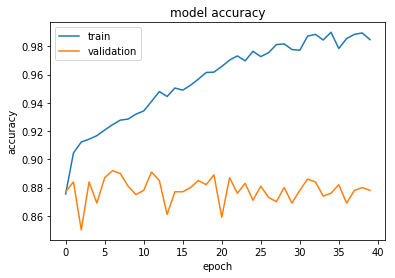

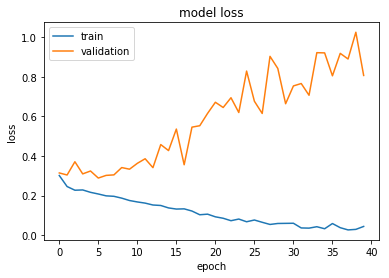

0.877234375


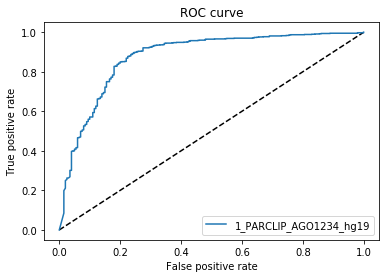

2_PARCLIP_AGO2MNASE_hg19


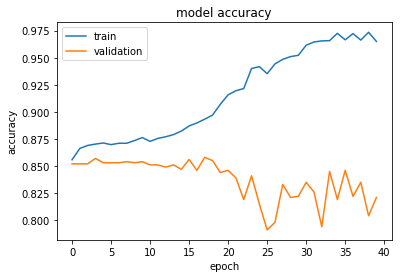

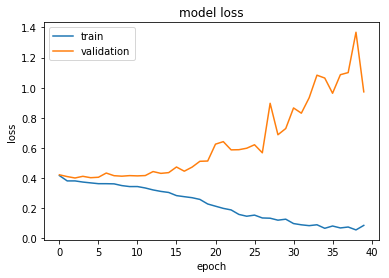

0.7291968750000001


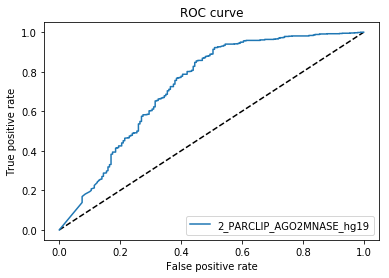

3_HITSCLIP_Ago2_binding_clusters


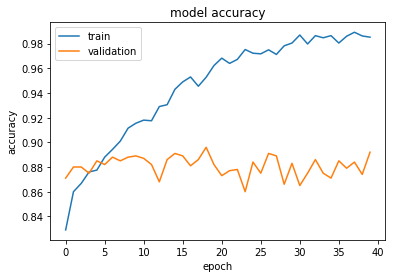

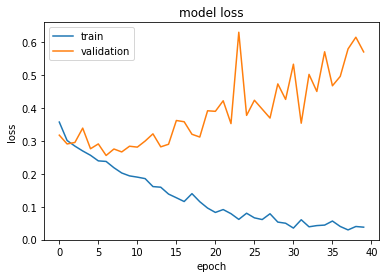

0.9178125


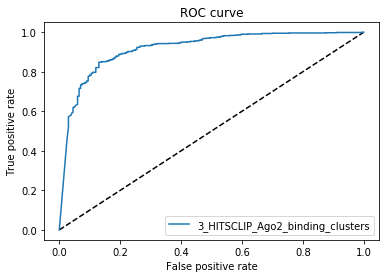

4_HITSCLIP_Ago2_binding_clusters_2


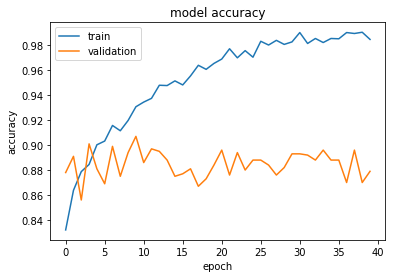

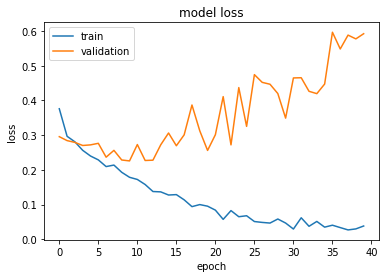

0.916021875


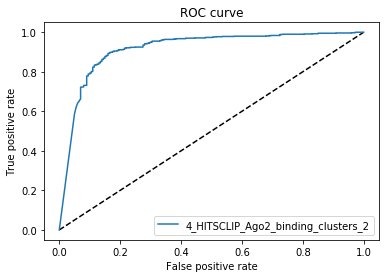

5_CLIPSEQ_AGO2_hg19


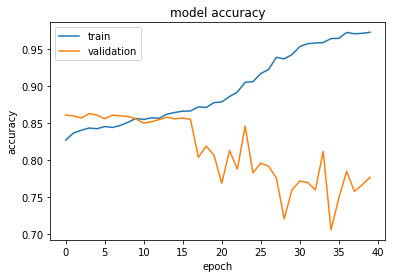

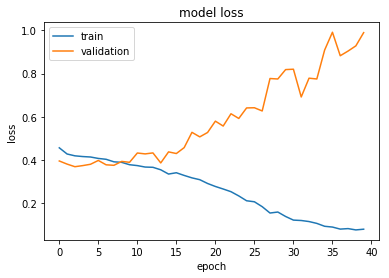

0.6782125000000001


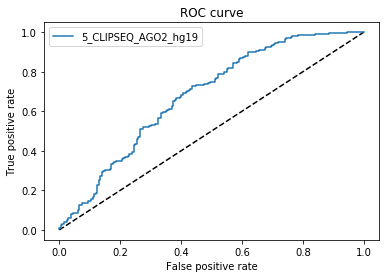

6_CLIP-seq-eIF4AIII_1


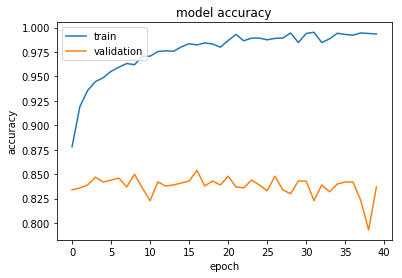

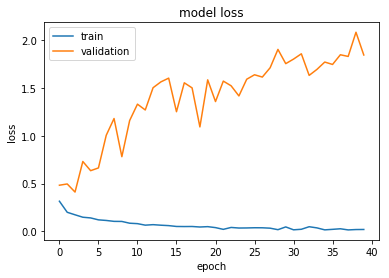

0.921115625


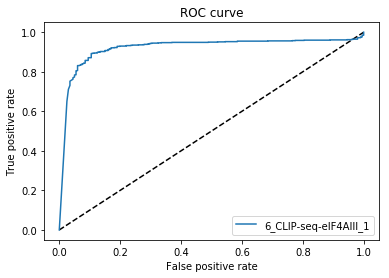

7_CLIP-seq-eIF4AIII_2


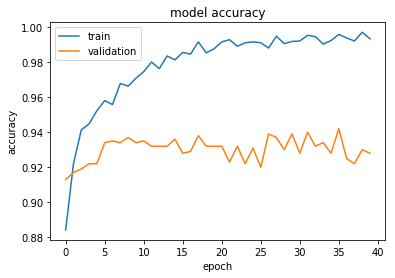

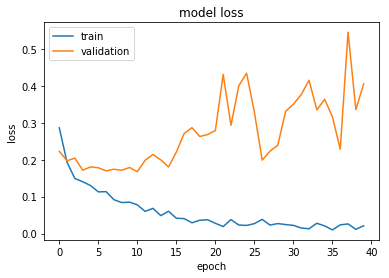

0.948409375


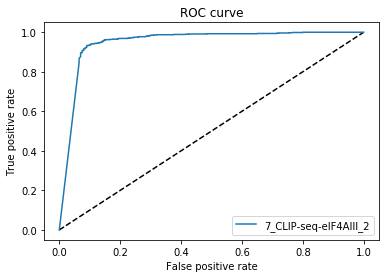

8_PARCLIP_ELAVL1_hg19


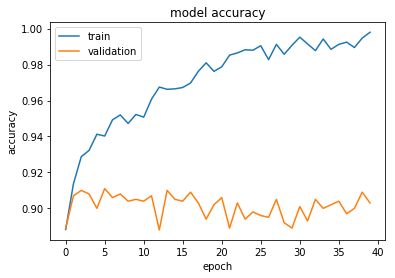

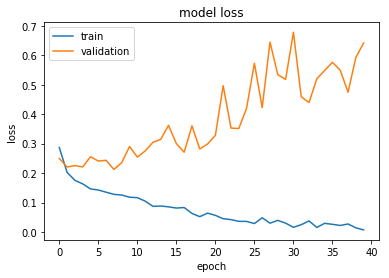

0.953884375


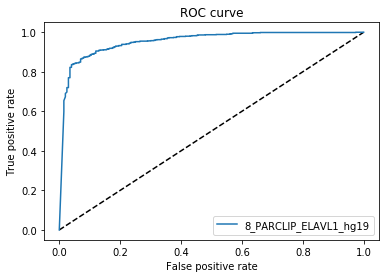

9_PARCLIP_ELAVL1MNASE_hg19


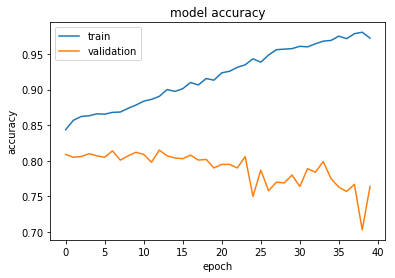

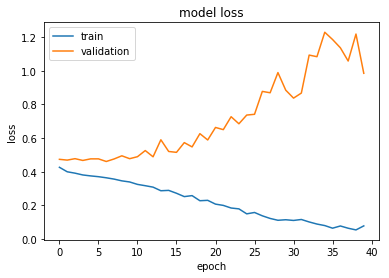

0.707009375


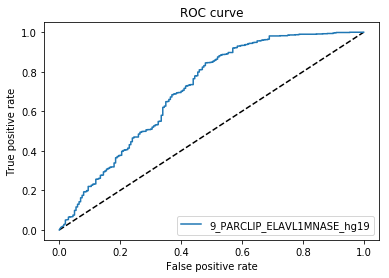

10_PARCLIP_ELAVL1A_hg19


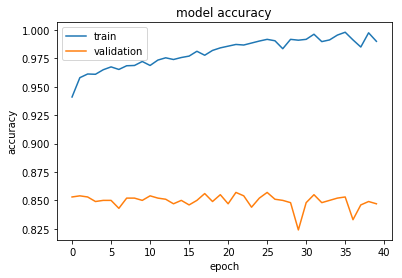

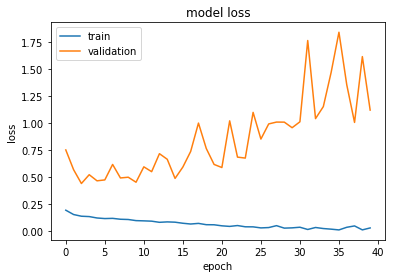

0.9061374999999999


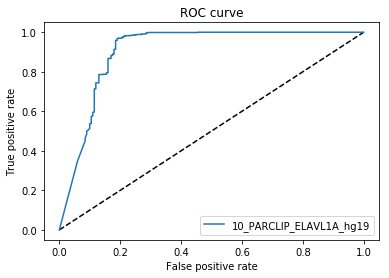

10_PARCLIP_ELAVL1A_hg19


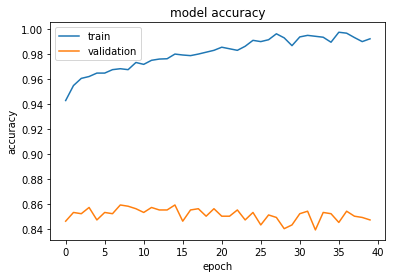

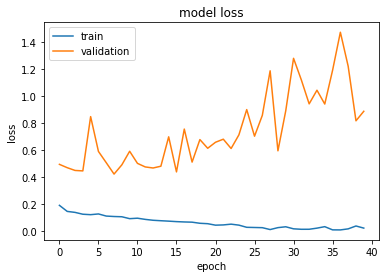

0.9287812500000001


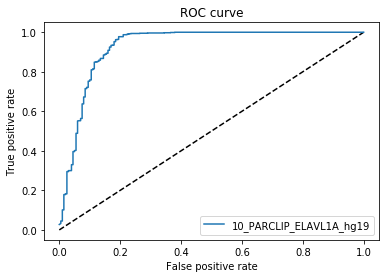

12_PARCLIP_EWSR1_hg19


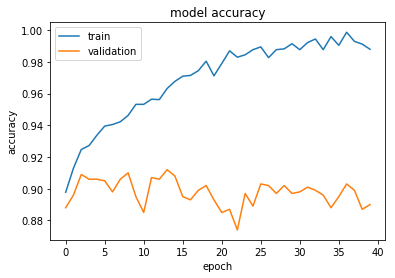

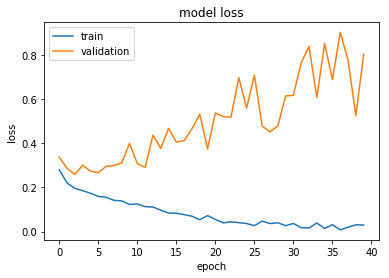

0.930775


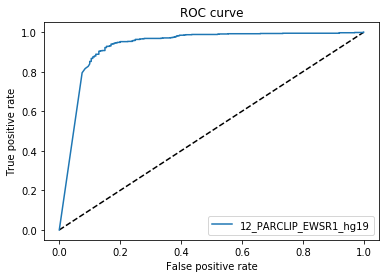

13_PARCLIP_FUS_hg19


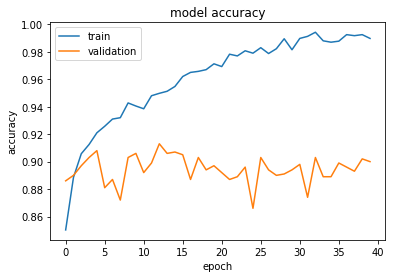

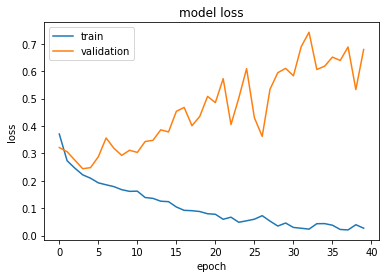

0.9177500000000001


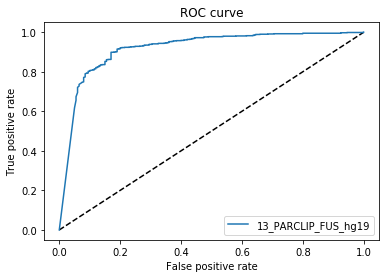

14_PARCLIP_FUS_mut_hg19


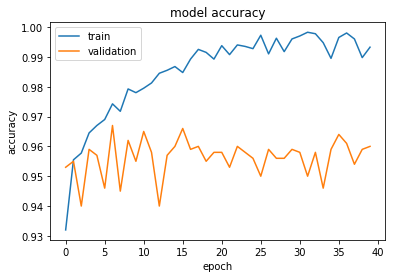

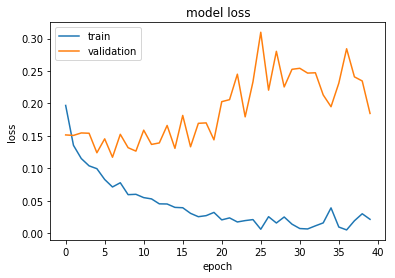

0.96885


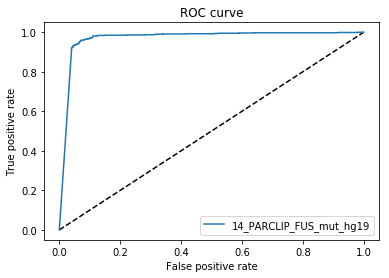

15_PARCLIP_IGF2BP123_hg19


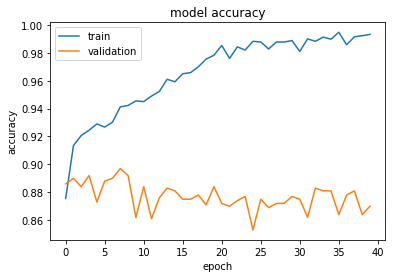

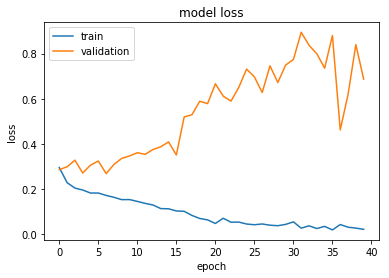

0.92001875


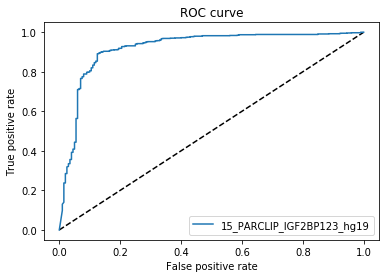

16_ICLIP_hnRNPC_Hela_iCLIP_all_clusters


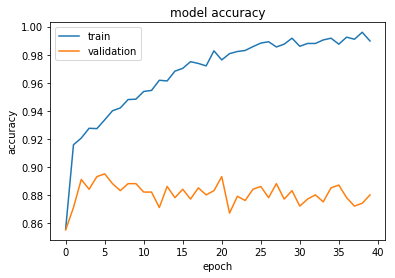

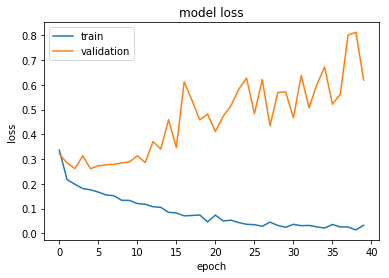

0.92391875


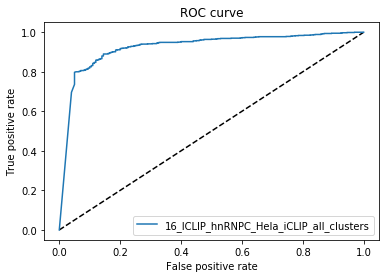

17_ICLIP_HNRNPC_hg19


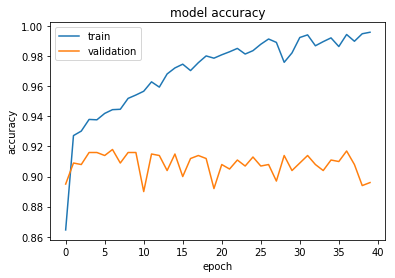

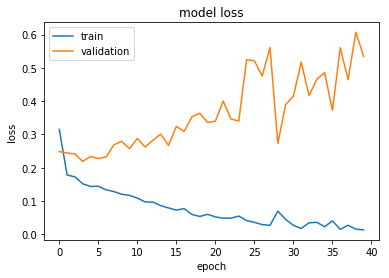

0.971290625


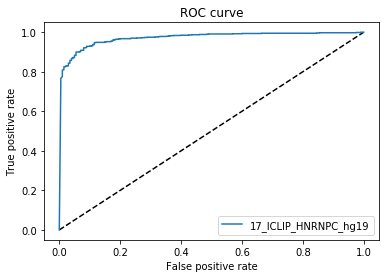

18_ICLIP_hnRNPL_Hela_group_3975_all-hnRNPL-Hela-hg19_sum_G_hg19--ensembl59_from_2337-2339-741_bedGraph-cDNA-hits-in-genome


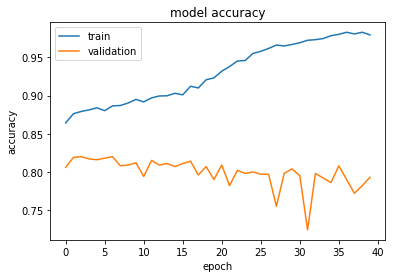

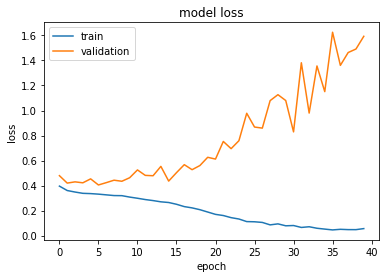

0.742009375


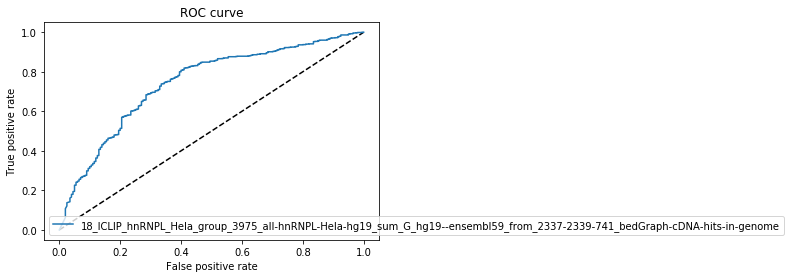

19_ICLIP_hnRNPL_U266_group_3986_all-hnRNPL-U266-hg19_sum_G_hg19--ensembl59_from_2485_bedGraph-cDNA-hits-in-genome


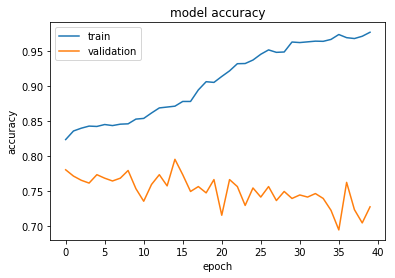

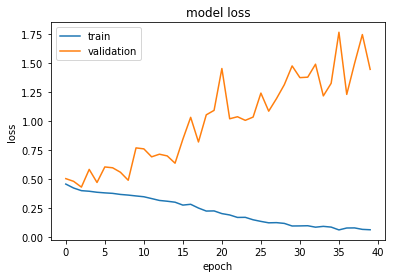

0.6462875


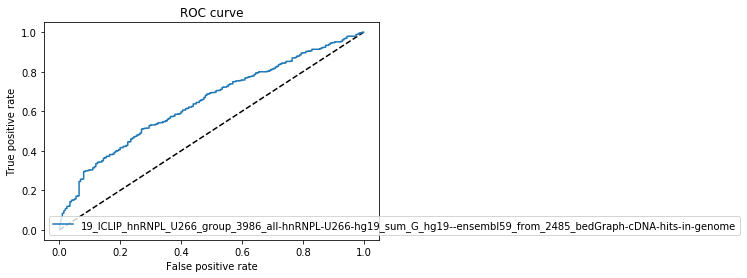

20_ICLIP_hnRNPlike_U266_group_4000_all-hnRNPLlike-U266-hg19_sum_G_hg19--ensembl59_from_2342-2486_bedGraph-cDNA-hits-in-genome


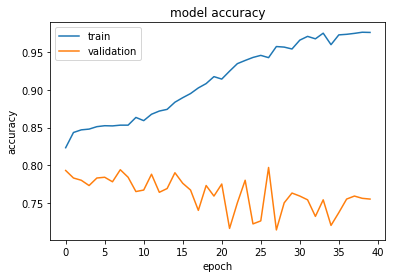

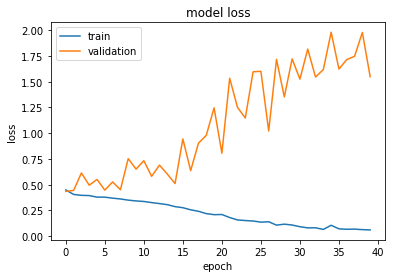

0.67093125


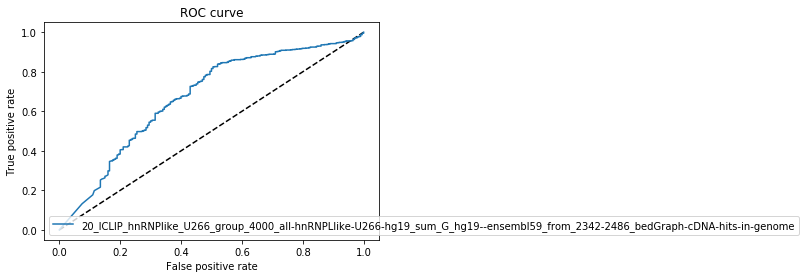

21_PARCLIP_MOV10_Sievers_hg19


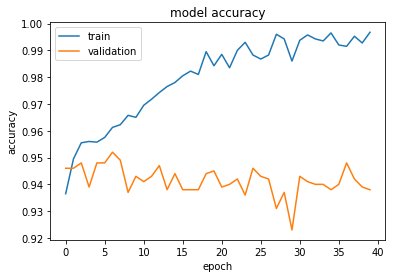

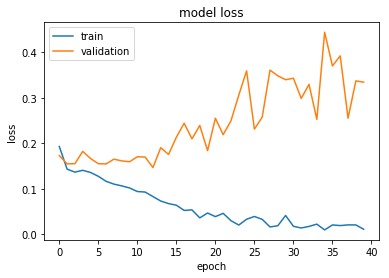

0.9640312499999999


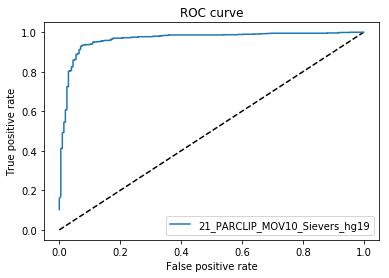

22_ICLIP_NSUN2_293_group_4007_all-NSUN2-293-hg19_sum_G_hg19--ensembl59_from_3137-3202_bedGraph-cDNA-hits-in-genome


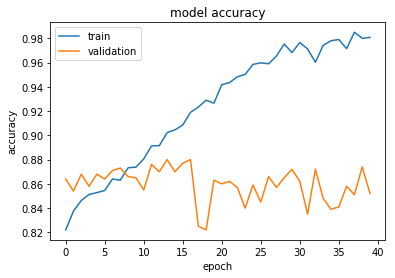

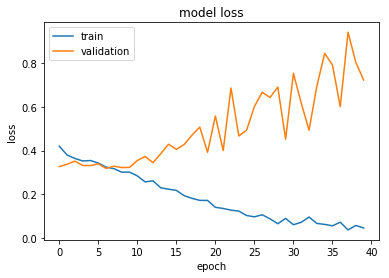

0.7740812499999998


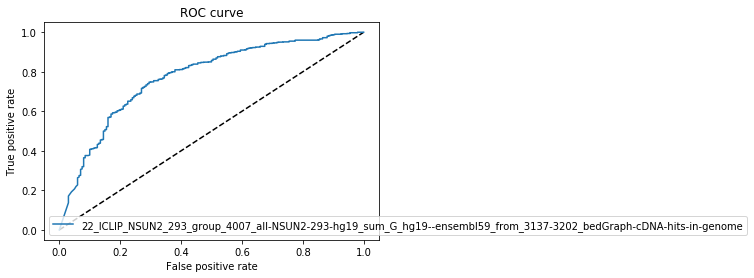

23_PARCLIP_PUM2_hg19


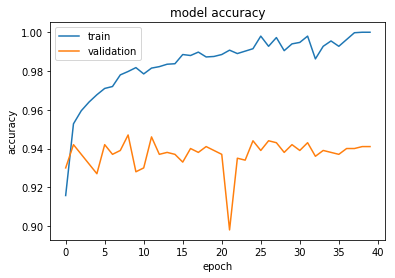

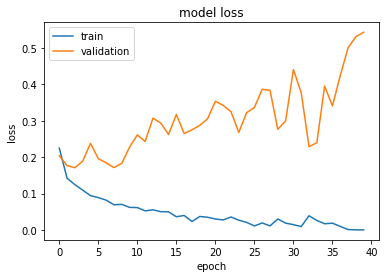

0.97895625


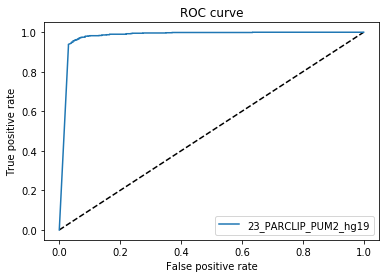

24_PARCLIP_QKI_hg19


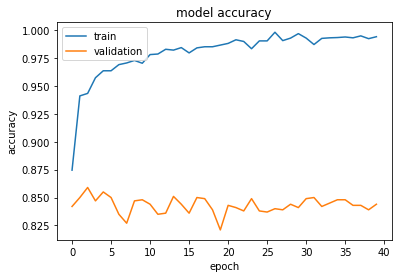

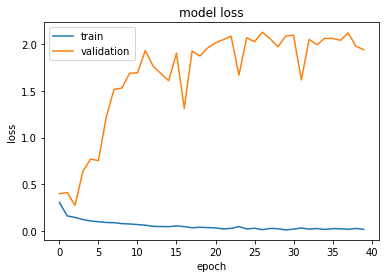

0.9480468749999998


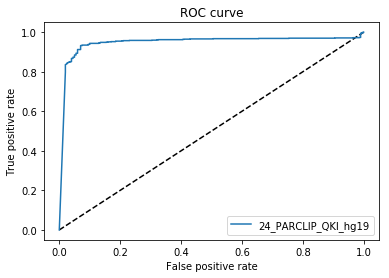

25_CLIPSEQ_SFRS1_hg19


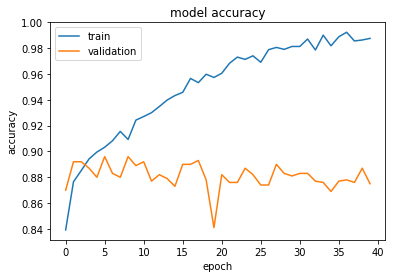

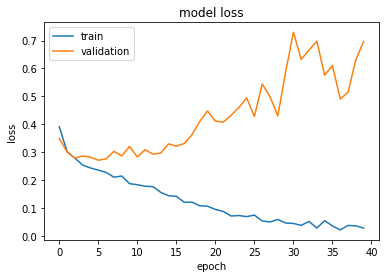

0.8808437499999999


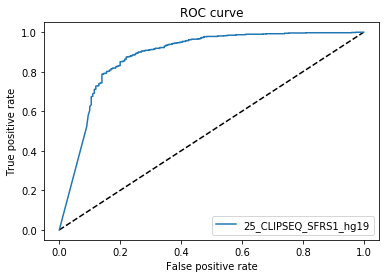

26_PARCLIP_TAF15_hg19


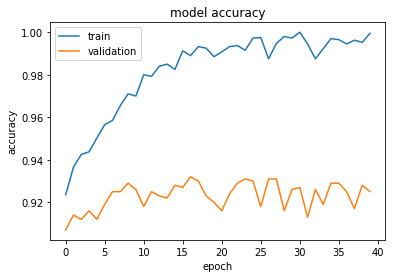

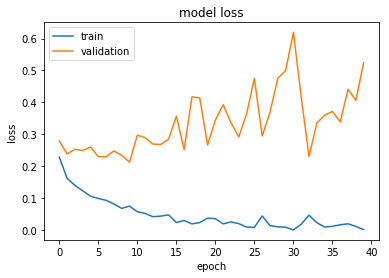

0.9652687499999999


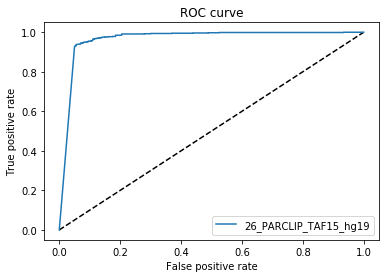

27_ICLIP_TDP43_hg19


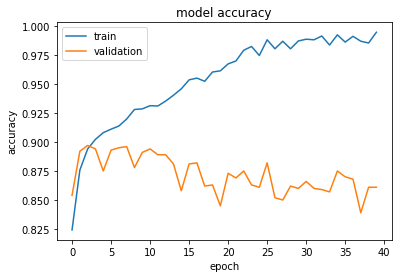

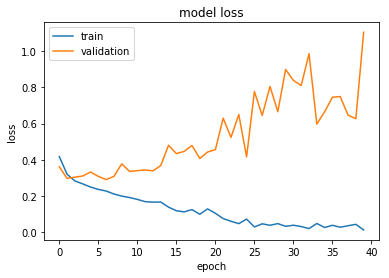

0.8702093750000001


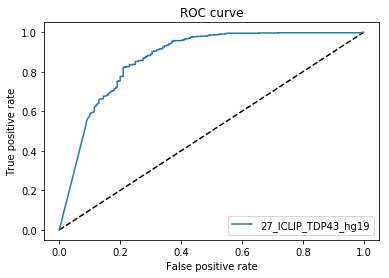

28_ICLIP_TIA1_hg19


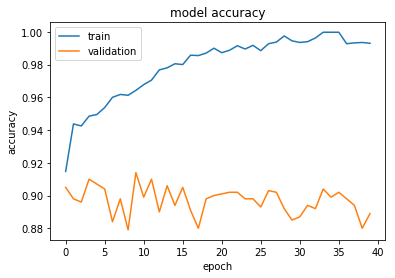

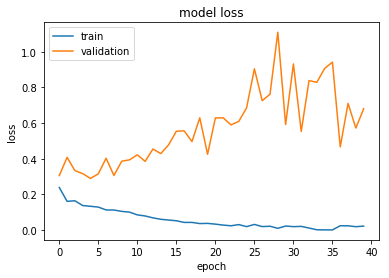

0.955746875


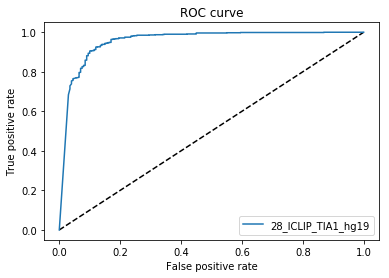

29_ICLIP_TIAL1_hg19


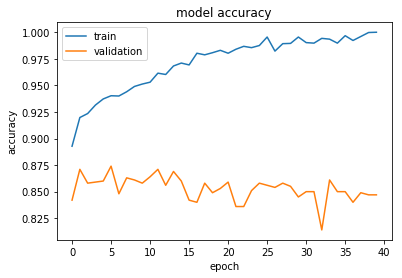

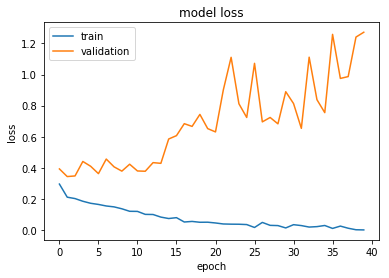

0.899796875


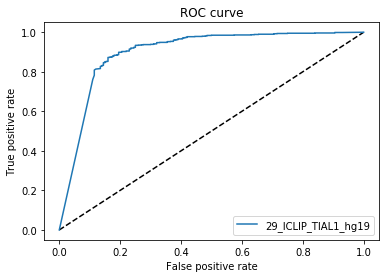

30_ICLIP_U2AF65_Hela_iCLIP_ctrl_all_clusters


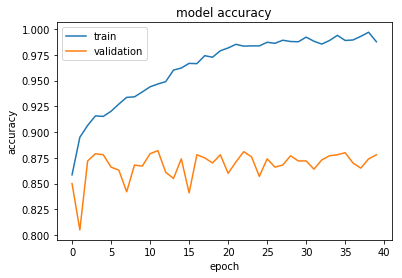

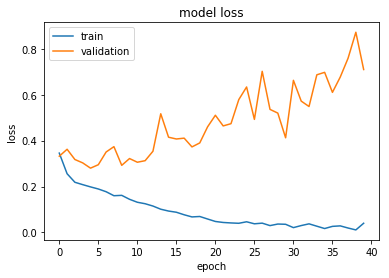

0.9485125000000001


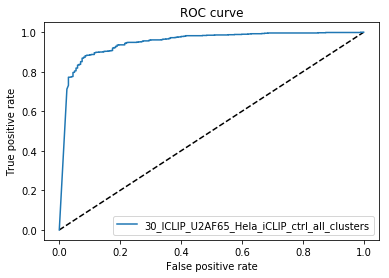

31_ICLIP_U2AF65_Hela_iCLIP_ctrl+kd_all_clusters


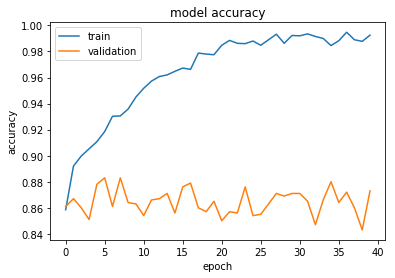

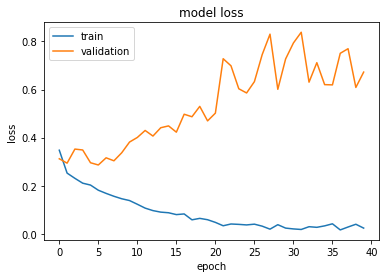

0.9237


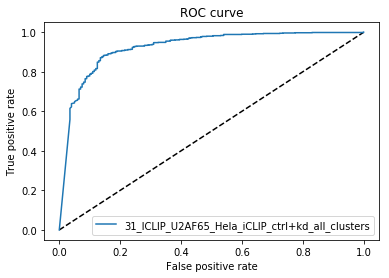

[0.877234375, 0.7291968750000001, 0.9178125, 0.916021875, 0.6782125000000001, 0.921115625, 0.948409375, 0.953884375, 0.707009375, 0.9061374999999999, 0.9287812500000001, 0.930775, 0.9177500000000001, 0.96885, 0.92001875, 0.92391875, 0.971290625, 0.742009375, 0.6462875, 0.67093125, 0.9640312499999999, 0.7740812499999998, 0.97895625, 0.9480468749999998, 0.8808437499999999, 0.9652687499999999, 0.8702093750000001, 0.955746875, 0.899796875, 0.9485125000000001, 0.9237]


In [109]:

score_list = []
protein_list = ["1_PARCLIP_AGO1234_hg19", "2_PARCLIP_AGO2MNASE_hg19","3_HITSCLIP_Ago2_binding_clusters","4_HITSCLIP_Ago2_binding_clusters_2","5_CLIPSEQ_AGO2_hg19", "6_CLIP-seq-eIF4AIII_1","7_CLIP-seq-eIF4AIII_2","8_PARCLIP_ELAVL1_hg19","9_PARCLIP_ELAVL1MNASE_hg19", "10_PARCLIP_ELAVL1A_hg19", "10_PARCLIP_ELAVL1A_hg19", "12_PARCLIP_EWSR1_hg19", "13_PARCLIP_FUS_hg19", "14_PARCLIP_FUS_mut_hg19", "15_PARCLIP_IGF2BP123_hg19", "16_ICLIP_hnRNPC_Hela_iCLIP_all_clusters", "17_ICLIP_HNRNPC_hg19", "18_ICLIP_hnRNPL_Hela_group_3975_all-hnRNPL-Hela-hg19_sum_G_hg19--ensembl59_from_2337-2339-741_bedGraph-cDNA-hits-in-genome", "19_ICLIP_hnRNPL_U266_group_3986_all-hnRNPL-U266-hg19_sum_G_hg19--ensembl59_from_2485_bedGraph-cDNA-hits-in-genome", "20_ICLIP_hnRNPlike_U266_group_4000_all-hnRNPLlike-U266-hg19_sum_G_hg19--ensembl59_from_2342-2486_bedGraph-cDNA-hits-in-genome", "21_PARCLIP_MOV10_Sievers_hg19", "22_ICLIP_NSUN2_293_group_4007_all-NSUN2-293-hg19_sum_G_hg19--ensembl59_from_3137-3202_bedGraph-cDNA-hits-in-genome", "23_PARCLIP_PUM2_hg19", "24_PARCLIP_QKI_hg19", "25_CLIPSEQ_SFRS1_hg19","26_PARCLIP_TAF15_hg19", "27_ICLIP_TDP43_hg19", "28_ICLIP_TIA1_hg19", "29_ICLIP_TIAL1_hg19", "30_ICLIP_U2AF65_Hela_iCLIP_ctrl_all_clusters", "31_ICLIP_U2AF65_Hela_iCLIP_ctrl+kd_all_clusters"]


for x in range (0,31):

    protein = protein_list[x]
    
    print (protein)
    
    X = np.dstack((get_cobinding(protein,"train"), get_seq(protein,"train"), get_region(protein,"train"), get_fold(protein, "train")))
    y = get_class(protein,"train")
    
    size = X.shape[2]
    
   
    
    score = []
    
    model = Sequential()
    model.add(Conv1D(60,6, data_format='channels_last', input_shape=(101, size) , strides = 1, padding='valid'))
    model.add(MaxPooling1D(pool_size=20, strides=1, padding='valid'))
    model.add(Conv1D(60, 4, activation='relu'))
    model.add(Dropout(0.2))
    model.add(MaxPooling1D(pool_size=40, strides=1, padding='valid'))
    model.add(Conv1D(60, 4, activation='relu'))
    model.add(MaxPooling1D(pool_size=30, strides=1, padding='valid'))
    model.add(Conv1D(60, 3, activation='relu'))
    model.add(GlobalAveragePooling1D())


    model.add(Dense(200, activation='relu'))
    model.add(Dense(2, activation='sigmoid'))

    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])



    X_train = X
    y_train = y

    metrics = model.fit(X_train, y_train, validation_split = 0.2, epochs=12, batch_size=200, verbose=0)

    
    # plot history for accuracy
    plt.plot(metrics.history['acc'])
    plt.plot(metrics.history['val_acc'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()


    # plot loss function history
    plt.plot(metrics.history['loss'])
    plt.plot(metrics.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()
    
    #run predictions
    X_test = np.dstack((get_cobinding(protein,"test"), get_seq(protein,"test"), get_region(protein,"test"), get_fold(protein, "test")))
    y_test = get_class(protein,"test")


    y_scores = model.predict(X_test)
    y_scores = y_scores [:,0:1]
    y_test = y_test [:,0:1]

    score = roc_auc_score(y_test, y_scores)
    print (score)
    score_list.append(score)

    fpr, tpr, thresholds = roc_curve(y_test, y_scores)

    #ROC plot
    plt.figure(1)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.plot(fpr, tpr, label=protein.format(score))
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('ROC curve')
    plt.legend(loc='best')
    plt.show()

print(score_list)

0.8913687499999999


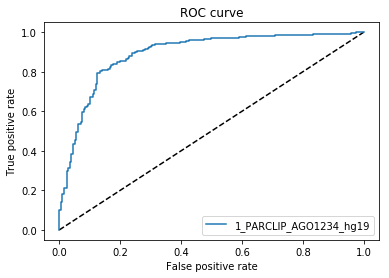

In [104]:
X_test = np.dstack((get_cobinding(protein,"test"), get_seq(protein,"test"), get_region(protein,"test"), get_fold(protein, "test")))
y_test = get_class(protein,"test")


y_scores = model.predict(X_test)
y_scores = y_scores [:,0:1]
y_test = y_test [:,0:1]

score = roc_auc_score(y_test, y_scores)
print (score)

fpr, tpr, thresholds = roc_curve(y_test, y_scores)


plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label=protein.format(score))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()


 

In [ ]:
[0.877234375, 0.7291968750000001, 0.9178125, 0.916021875, 0.6782125000000001, 0.921115625, 0.948409375, 0.953884375, 0.707009375, 0.9061374999999999, 0.9287812500000001, 0.930775, 0.9177500000000001, 0.96885, 0.92001875, 0.92391875, 0.971290625, 0.742009375, 0.6462875, 0.67093125, 0.9640312499999999, 0.7740812499999998, 0.97895625, 0.9480468749999998, 0.8808437499999999, 0.9652687499999999, 0.8702093750000001, 0.955746875, 0.899796875, 0.9485125000000001, 0.9237]


1_PARCLIP_AGO1234_hg19


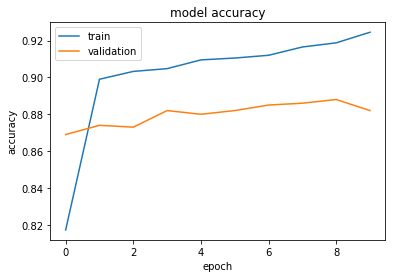

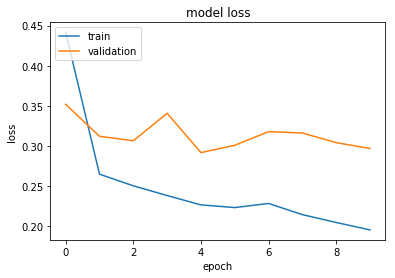

0.89766875


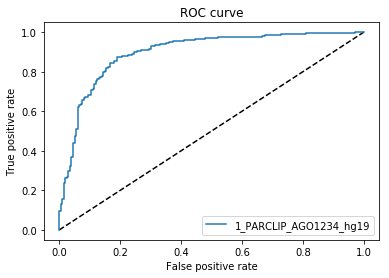

2_PARCLIP_AGO2MNASE_hg19


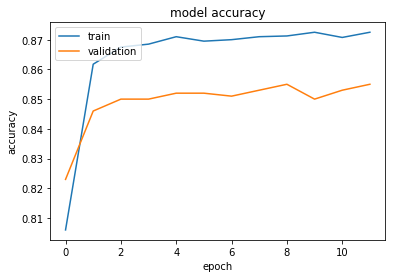

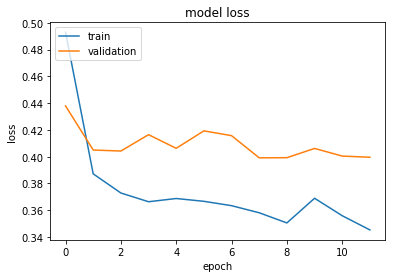

0.7401125


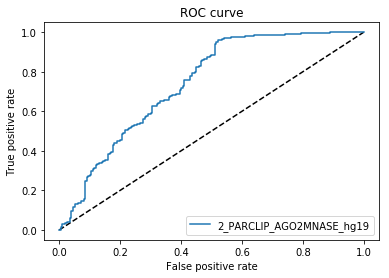

3_HITSCLIP_Ago2_binding_clusters


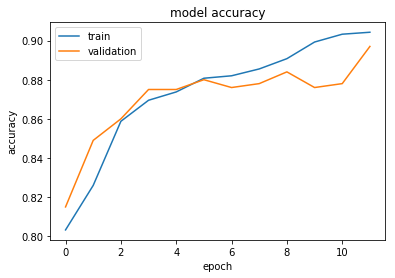

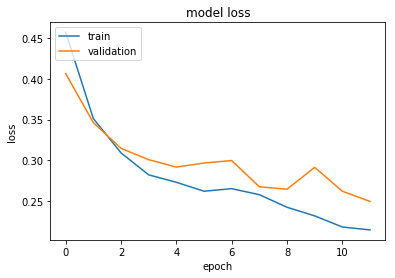

0.9297749999999999


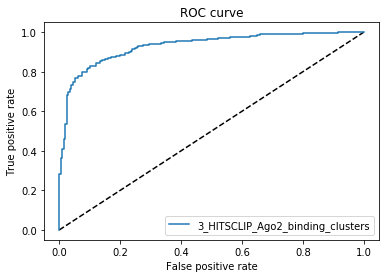

4_HITSCLIP_Ago2_binding_clusters_2


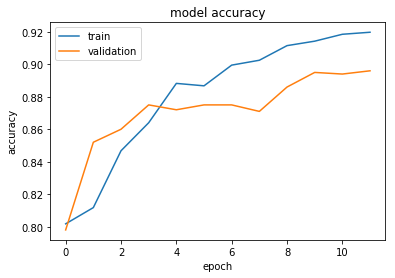

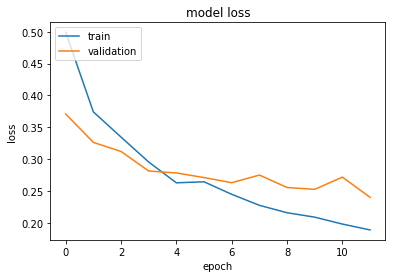

0.92835


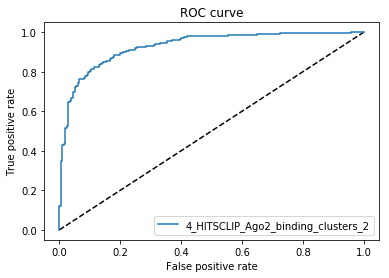

5_CLIPSEQ_AGO2_hg19


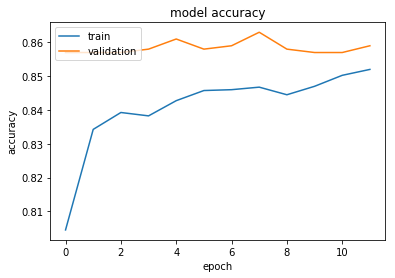

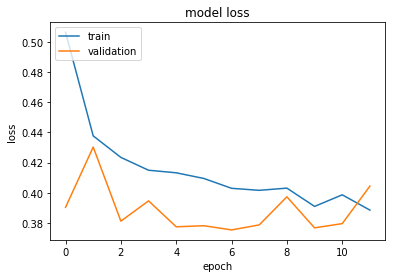

0.71879375


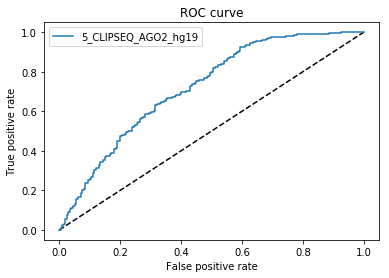

6_CLIP-seq-eIF4AIII_1


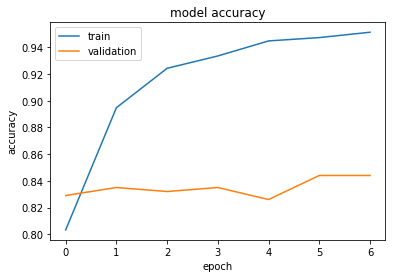

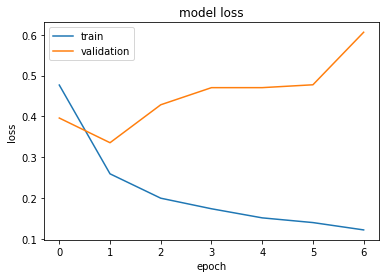

0.9420000000000001


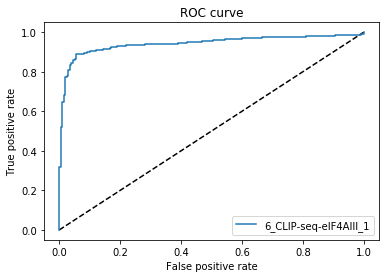

7_CLIP-seq-eIF4AIII_2


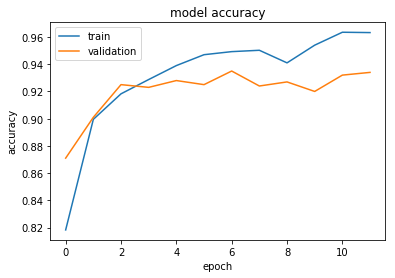

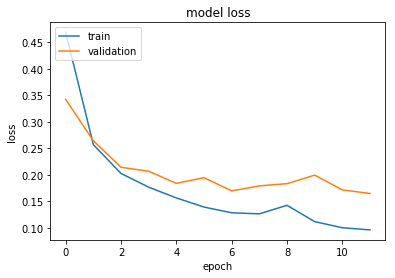

0.9734875


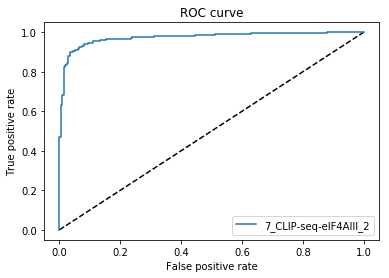

8_PARCLIP_ELAVL1_hg19


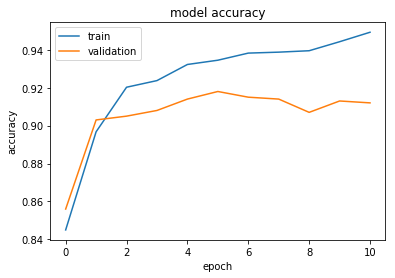

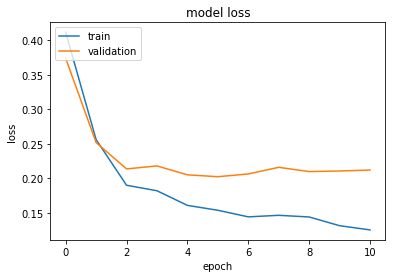

0.95940625


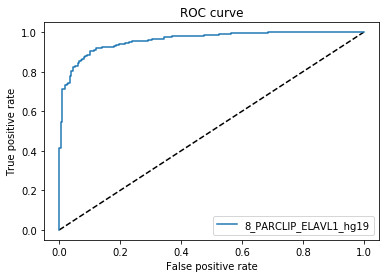

9_PARCLIP_ELAVL1MNASE_hg19


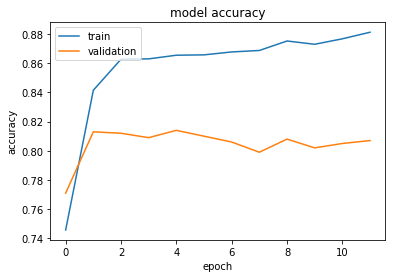

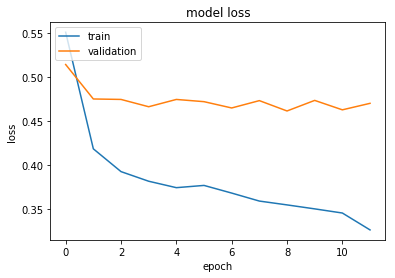

0.74744375


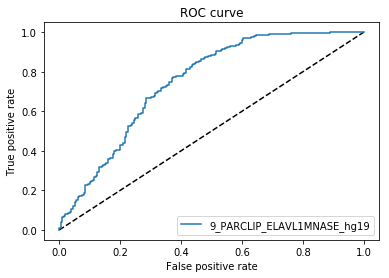

10_PARCLIP_ELAVL1A_hg19


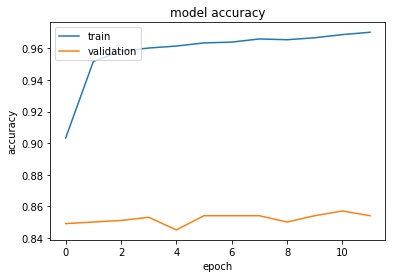

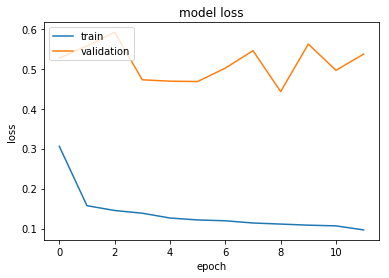

0.94281875


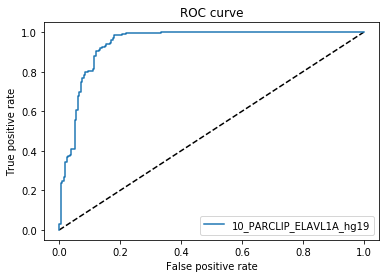

10_PARCLIP_ELAVL1A_hg19


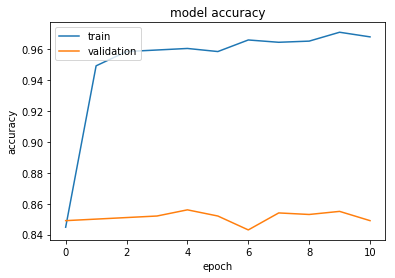

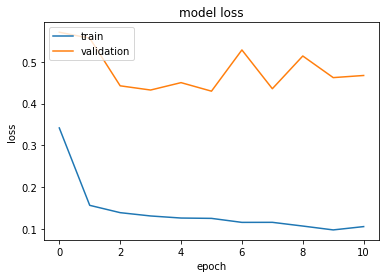

0.94349375


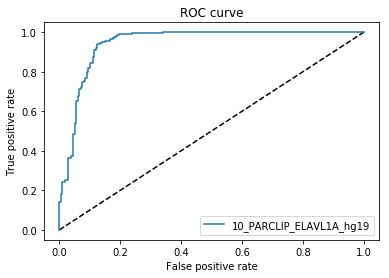

12_PARCLIP_EWSR1_hg19


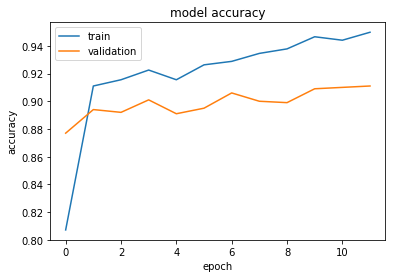

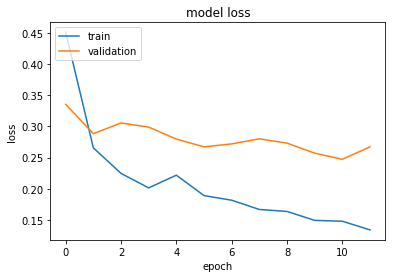

0.9621624999999999


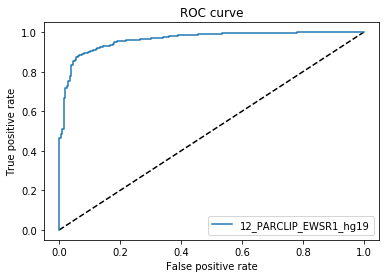

13_PARCLIP_FUS_hg19


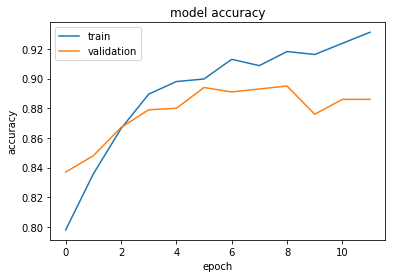

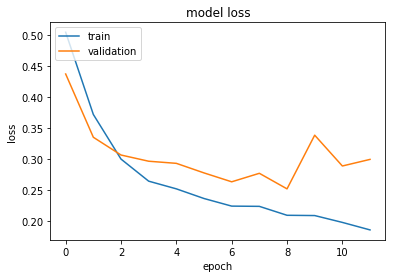

0.9245249999999999


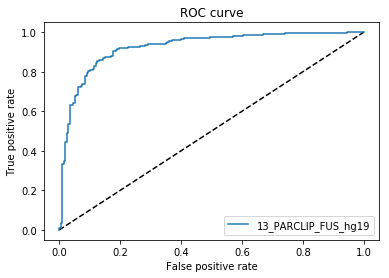

14_PARCLIP_FUS_mut_hg19


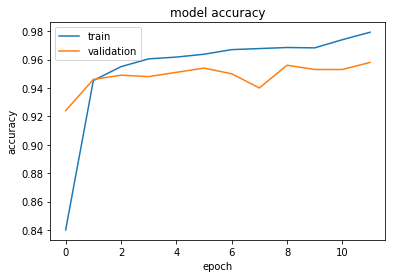

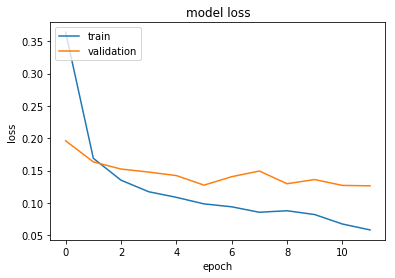

0.9797625


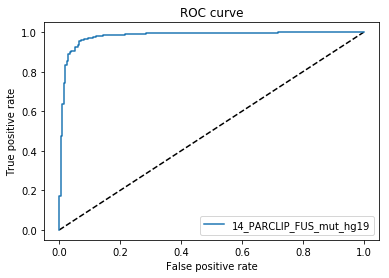

15_PARCLIP_IGF2BP123_hg19


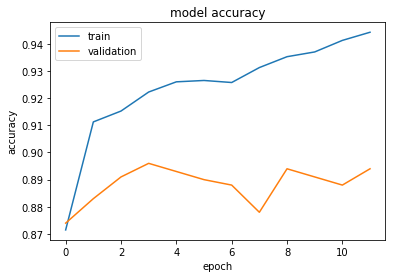

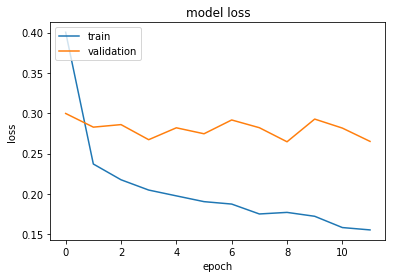

0.94923125


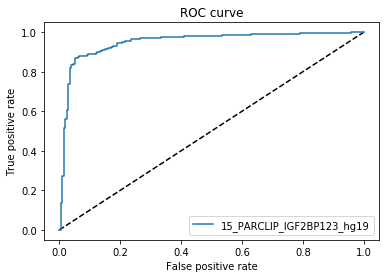

16_ICLIP_hnRNPC_Hela_iCLIP_all_clusters


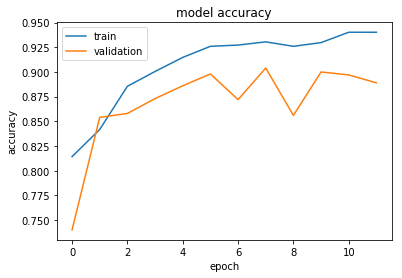

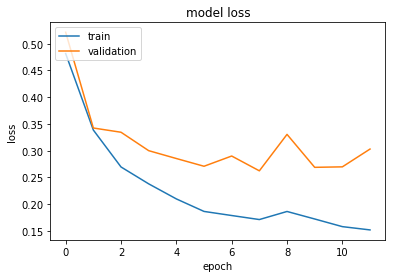

0.95049375


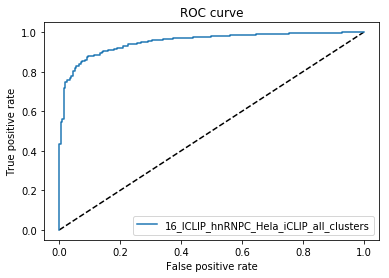

17_ICLIP_HNRNPC_hg19


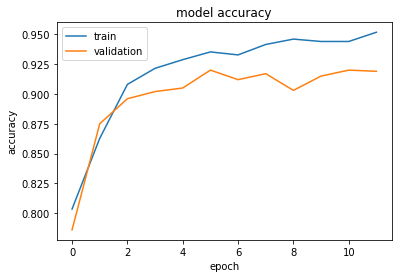

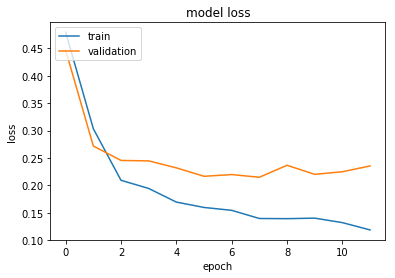

0.97619375


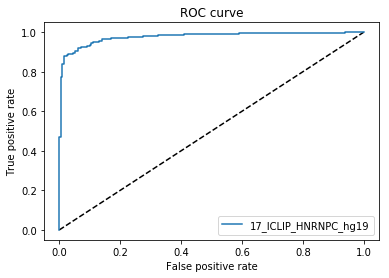

18_ICLIP_hnRNPL_Hela_group_3975_all-hnRNPL-Hela-hg19_sum_G_hg19--ensembl59_from_2337-2339-741_bedGraph-cDNA-hits-in-genome


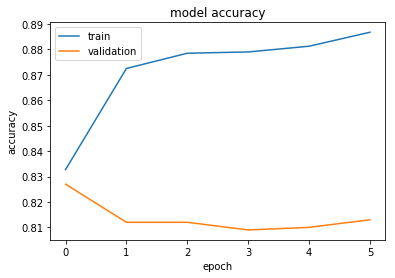

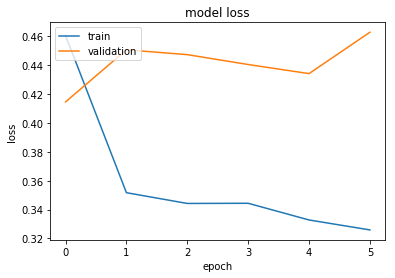

0.7752187499999998


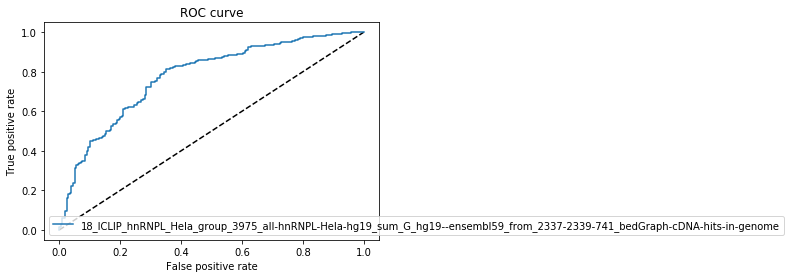

19_ICLIP_hnRNPL_U266_group_3986_all-hnRNPL-U266-hg19_sum_G_hg19--ensembl59_from_2485_bedGraph-cDNA-hits-in-genome


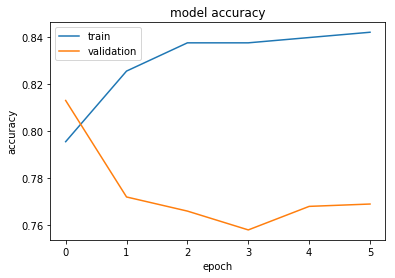

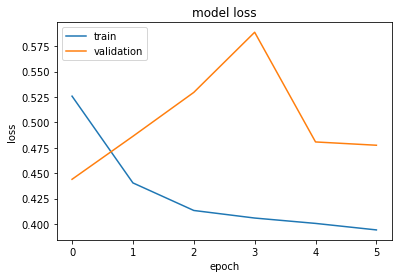

0.678075


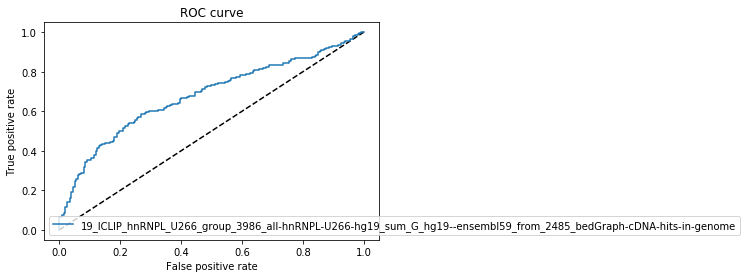

20_ICLIP_hnRNPlike_U266_group_4000_all-hnRNPLlike-U266-hg19_sum_G_hg19--ensembl59_from_2342-2486_bedGraph-cDNA-hits-in-genome


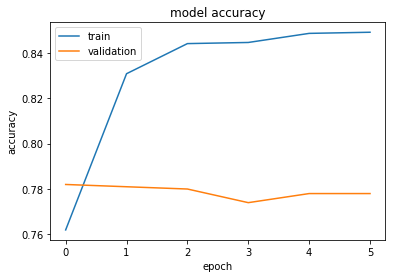

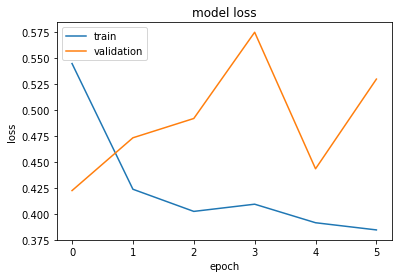

0.7041875


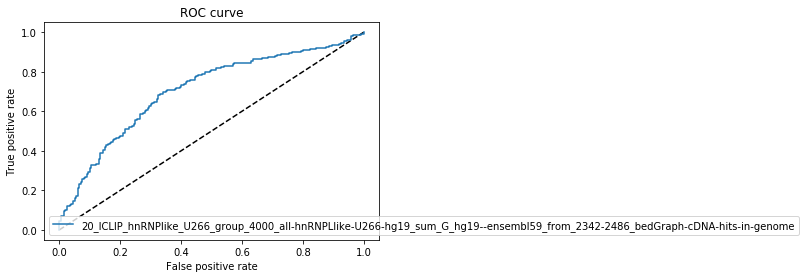

21_PARCLIP_MOV10_Sievers_hg19


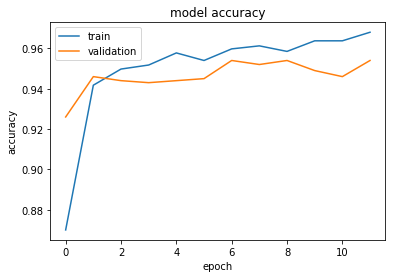

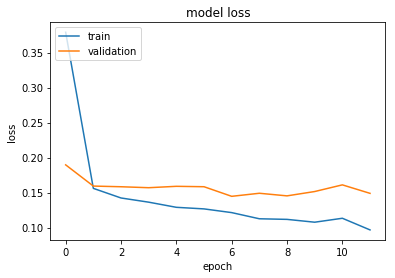

0.97783125


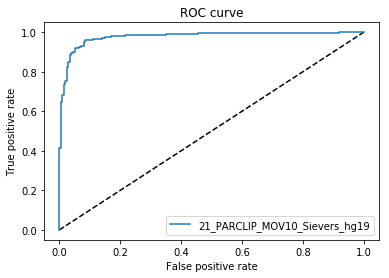

22_ICLIP_NSUN2_293_group_4007_all-NSUN2-293-hg19_sum_G_hg19--ensembl59_from_3137-3202_bedGraph-cDNA-hits-in-genome


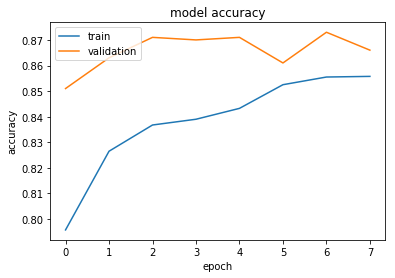

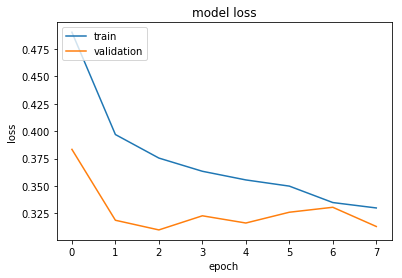

0.8492875


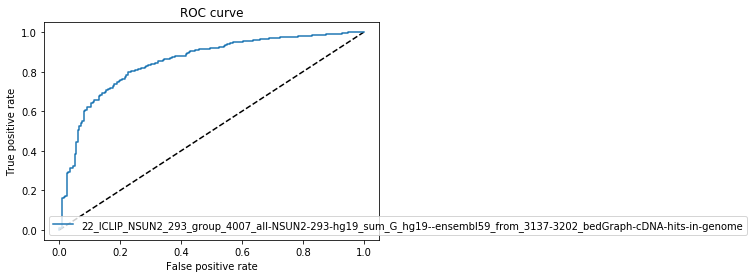

23_PARCLIP_PUM2_hg19


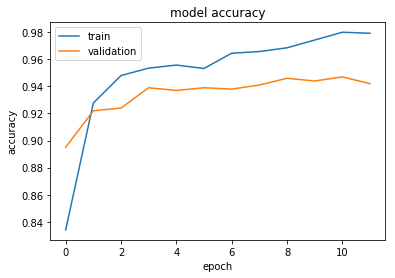

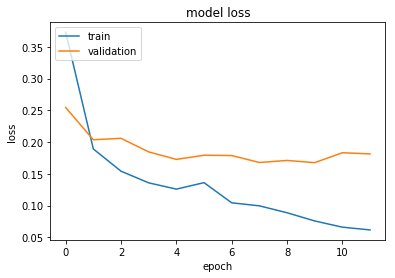

0.9909874999999999


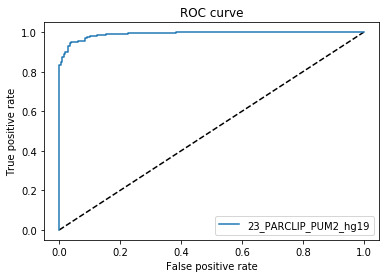

24_PARCLIP_QKI_hg19


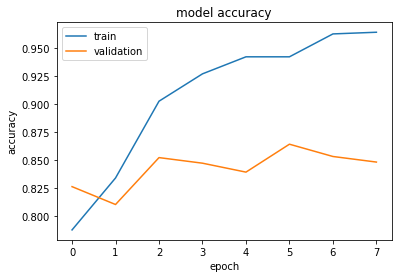

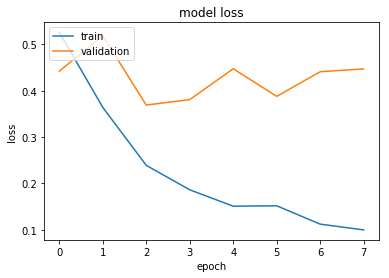

0.9611125


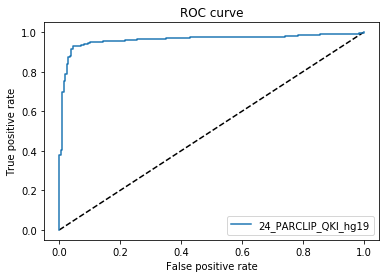

25_CLIPSEQ_SFRS1_hg19


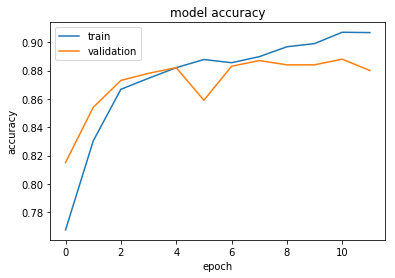

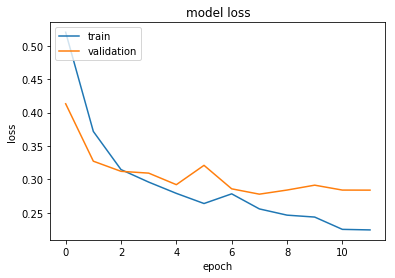

0.9269625000000001


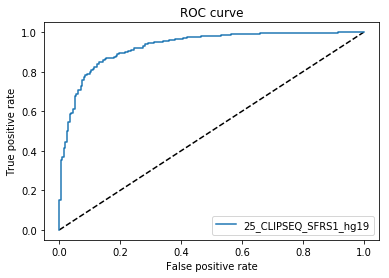

26_PARCLIP_TAF15_hg19


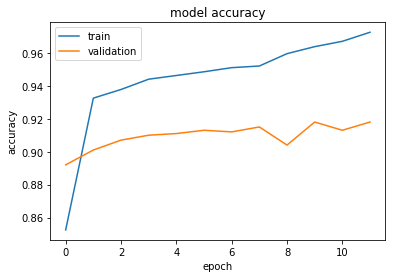

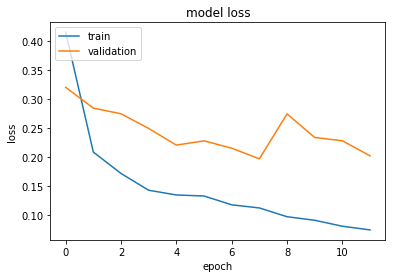

0.97175625


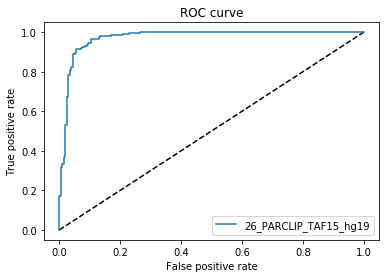

27_ICLIP_TDP43_hg19


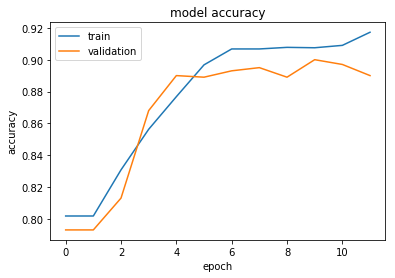

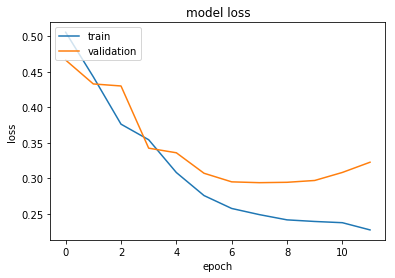

0.8829000000000001


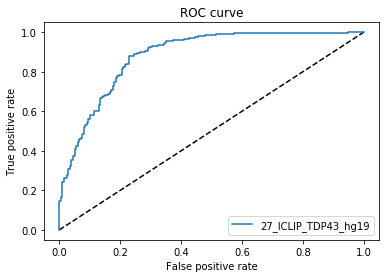

28_ICLIP_TIA1_hg19


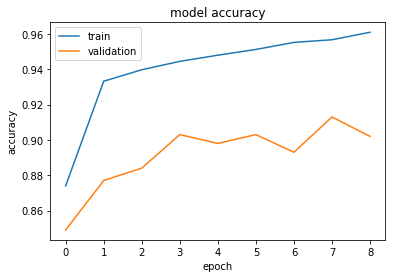

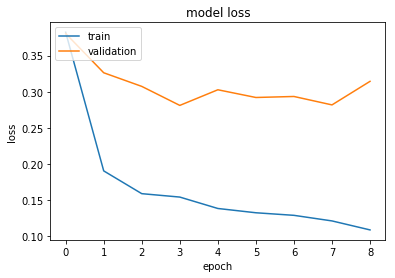

0.97498125


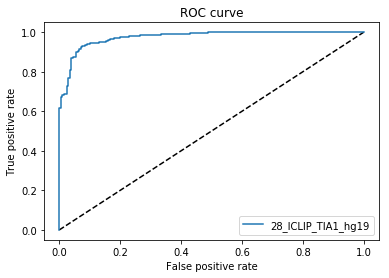

29_ICLIP_TIAL1_hg19


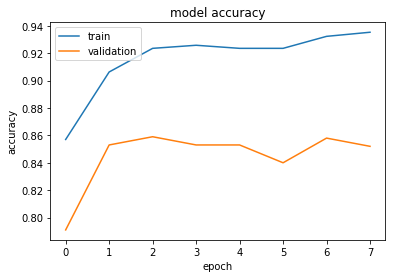

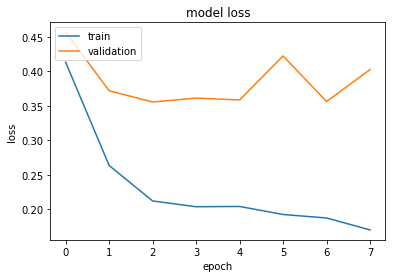

0.9248812500000001


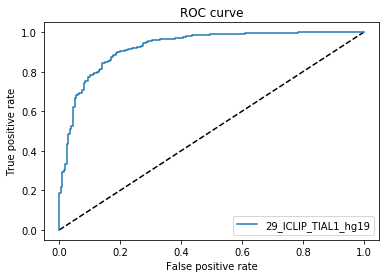

30_ICLIP_U2AF65_Hela_iCLIP_ctrl_all_clusters


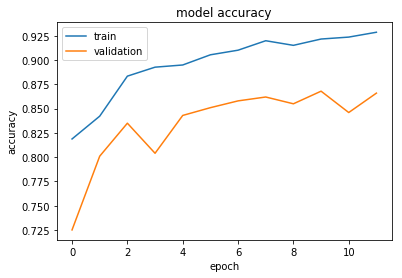

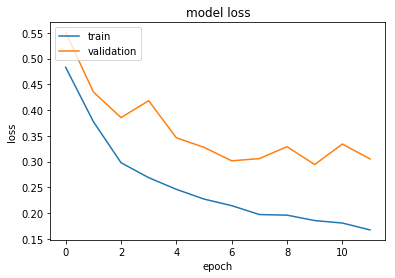

0.9381249999999999


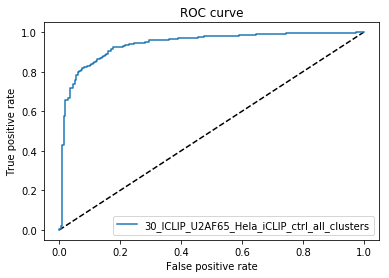

31_ICLIP_U2AF65_Hela_iCLIP_ctrl+kd_all_clusters


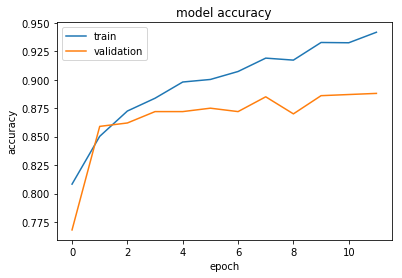

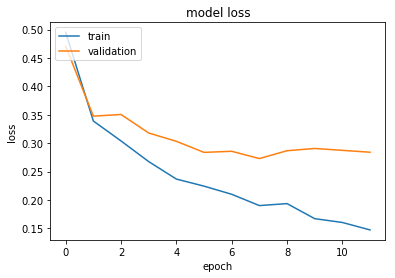

0.91408125


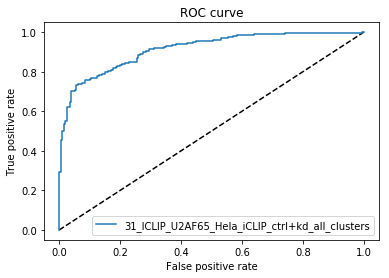

[0.89766875, 0.7401125, 0.9297749999999999, 0.92835, 0.71879375, 0.9420000000000001, 0.9734875, 0.95940625, 0.74744375, 0.94281875, 0.94349375, 0.9621624999999999, 0.9245249999999999, 0.9797625, 0.94923125, 0.95049375, 0.97619375, 0.7752187499999998, 0.678075, 0.7041875, 0.97783125, 0.8492875, 0.9909874999999999, 0.9611125, 0.9269625000000001, 0.97175625, 0.8829000000000001, 0.97498125, 0.9248812500000001, 0.9381249999999999, 0.91408125]


In [7]:
score_list = []
protein_list = ["1_PARCLIP_AGO1234_hg19", "2_PARCLIP_AGO2MNASE_hg19","3_HITSCLIP_Ago2_binding_clusters","4_HITSCLIP_Ago2_binding_clusters_2","5_CLIPSEQ_AGO2_hg19", "6_CLIP-seq-eIF4AIII_1","7_CLIP-seq-eIF4AIII_2","8_PARCLIP_ELAVL1_hg19","9_PARCLIP_ELAVL1MNASE_hg19", "10_PARCLIP_ELAVL1A_hg19", "10_PARCLIP_ELAVL1A_hg19", "12_PARCLIP_EWSR1_hg19", "13_PARCLIP_FUS_hg19", "14_PARCLIP_FUS_mut_hg19", "15_PARCLIP_IGF2BP123_hg19", "16_ICLIP_hnRNPC_Hela_iCLIP_all_clusters", "17_ICLIP_HNRNPC_hg19", "18_ICLIP_hnRNPL_Hela_group_3975_all-hnRNPL-Hela-hg19_sum_G_hg19--ensembl59_from_2337-2339-741_bedGraph-cDNA-hits-in-genome", "19_ICLIP_hnRNPL_U266_group_3986_all-hnRNPL-U266-hg19_sum_G_hg19--ensembl59_from_2485_bedGraph-cDNA-hits-in-genome", "20_ICLIP_hnRNPlike_U266_group_4000_all-hnRNPLlike-U266-hg19_sum_G_hg19--ensembl59_from_2342-2486_bedGraph-cDNA-hits-in-genome", "21_PARCLIP_MOV10_Sievers_hg19", "22_ICLIP_NSUN2_293_group_4007_all-NSUN2-293-hg19_sum_G_hg19--ensembl59_from_3137-3202_bedGraph-cDNA-hits-in-genome", "23_PARCLIP_PUM2_hg19", "24_PARCLIP_QKI_hg19", "25_CLIPSEQ_SFRS1_hg19","26_PARCLIP_TAF15_hg19", "27_ICLIP_TDP43_hg19", "28_ICLIP_TIA1_hg19", "29_ICLIP_TIAL1_hg19", "30_ICLIP_U2AF65_Hela_iCLIP_ctrl_all_clusters", "31_ICLIP_U2AF65_Hela_iCLIP_ctrl+kd_all_clusters"]


for x in range (0,31):

    protein = protein_list[x]
    
    print (protein)
    
    X = np.dstack((get_cobinding(protein,"train"), get_seq(protein,"train"), get_region(protein,"train"), get_fold(protein, "train")))
    y = get_class(protein,"train")
    
    size = X.shape[2]
    
   
    
    score = []
    
    model = Sequential()
    model.add(Conv1D(60,6, data_format='channels_last', input_shape=(101, size) , strides = 1, padding='valid'))
    model.add(MaxPooling1D(pool_size=20, strides=1, padding='valid'))
    model.add(Conv1D(60, 4, activation='relu'))
    model.add(Dropout(0.2))
    model.add(MaxPooling1D(pool_size=40, strides=1, padding='valid'))
    model.add(Conv1D(60, 4, activation='relu'))
    model.add(MaxPooling1D(pool_size=30, strides=1, padding='valid'))
    model.add(Conv1D(60, 3, activation='relu'))
    model.add(GlobalAveragePooling1D())


    model.add(Dense(200, activation='relu'))
    model.add(Dense(2, activation='sigmoid'))

    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    checkpointer = ModelCheckpoint(filepath="models/" + protein + "_weights.hdf5", verbose=0, save_best_only=True)
    earlystopper = EarlyStopping(monitor='val_loss', patience=5, verbose=0)


    X_train = X
    y_train = y

    metrics = model.fit(X_train, y_train, validation_split = 0.2, epochs=12, batch_size=200, verbose=0, callbacks=[earlystopper])

    
    # plot history for accuracy
    plt.plot(metrics.history['acc'])
    plt.plot(metrics.history['val_acc'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()


    # plot loss function history
    plt.plot(metrics.history['loss'])
    plt.plot(metrics.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()
    
    #run predictions
    X_test = np.dstack((get_cobinding(protein,"test"), get_seq(protein,"test"), get_region(protein,"test"), get_fold(protein, "test")))
    y_test = get_class(protein,"test")


    y_scores = model.predict(X_test)
    y_scores = y_scores [:,0:1]
    y_test = y_test [:,0:1]

    score = roc_auc_score(y_test, y_scores)
    print (score)
    score_list.append(score)

    fpr, tpr, thresholds = roc_curve(y_test, y_scores)

    #ROC plot
    plt.figure(1)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.plot(fpr, tpr, label=protein.format(score))
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('ROC curve')
    plt.legend(loc='best')
    plt.show()

print(score_list)

1_PARCLIP_AGO1234_hg19


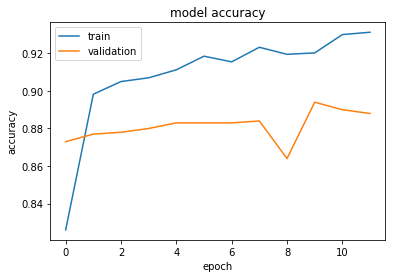

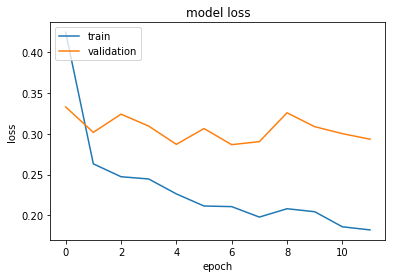

0.8985000000000001


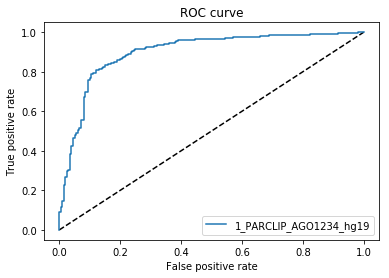

2_PARCLIP_AGO2MNASE_hg19


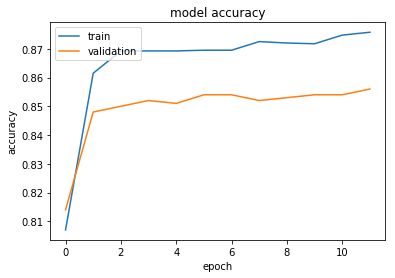

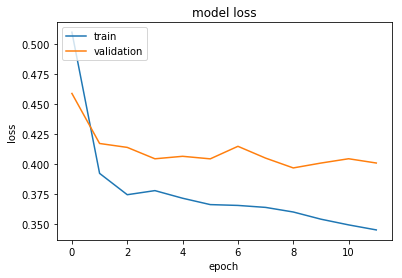

0.7460062500000001


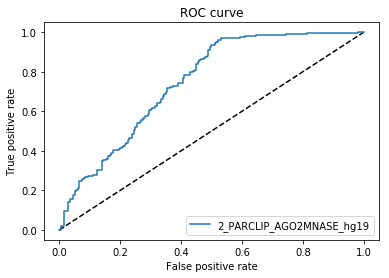

3_HITSCLIP_Ago2_binding_clusters


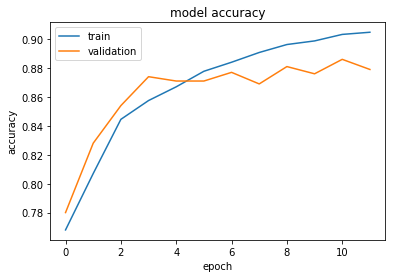

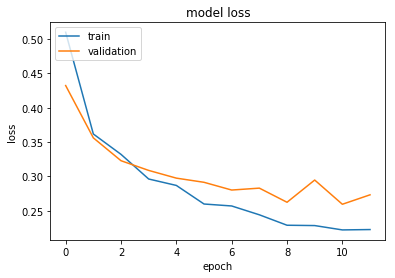

0.92445


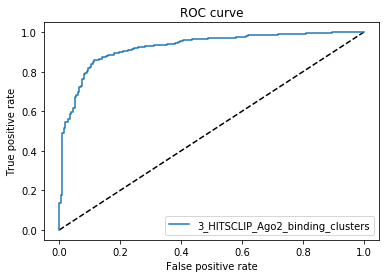

4_HITSCLIP_Ago2_binding_clusters_2


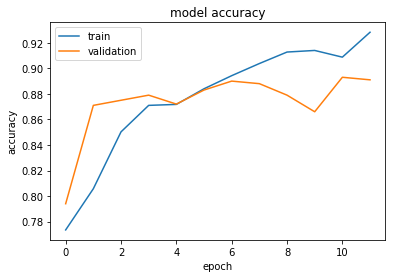

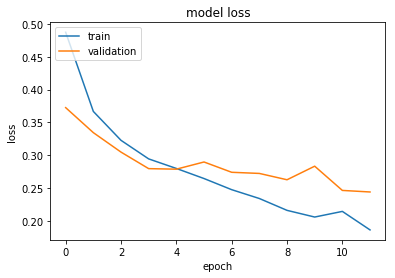

0.9375562500000001


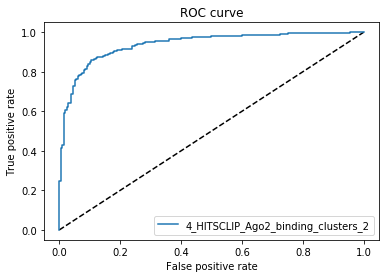

5_CLIPSEQ_AGO2_hg19


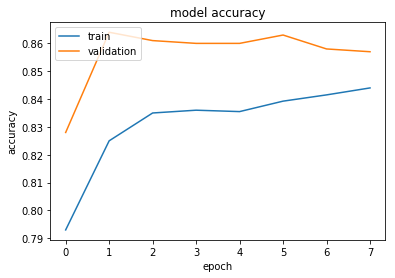

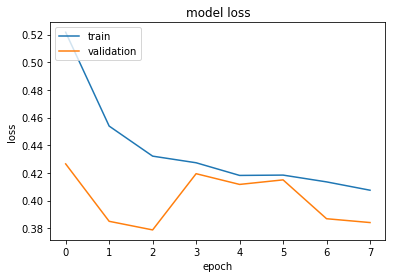

0.76429375


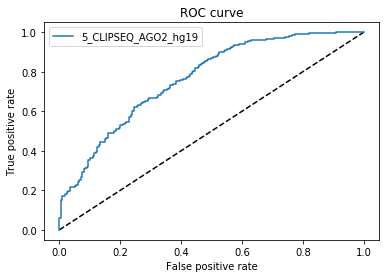

6_CLIP-seq-eIF4AIII_1


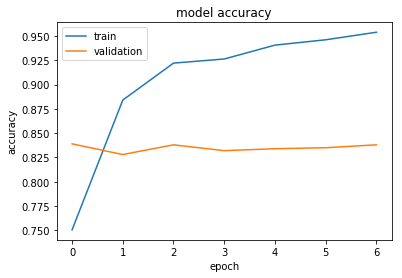

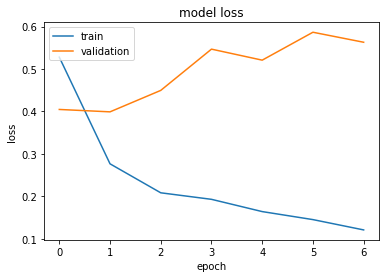

0.9348249999999998


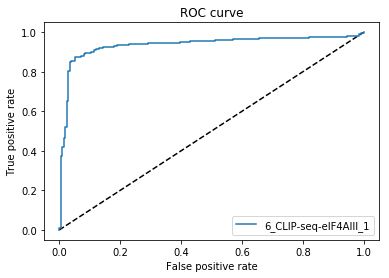

7_CLIP-seq-eIF4AIII_2


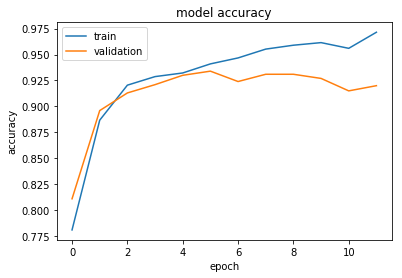

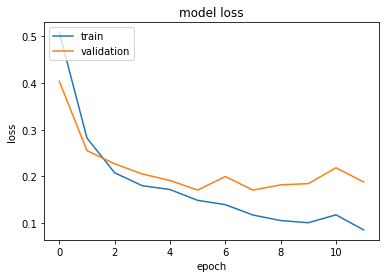

0.97129375


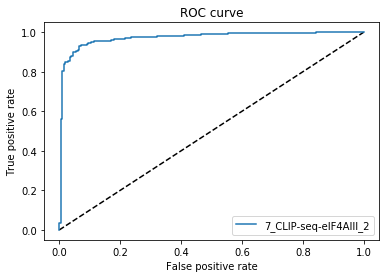

8_PARCLIP_ELAVL1_hg19


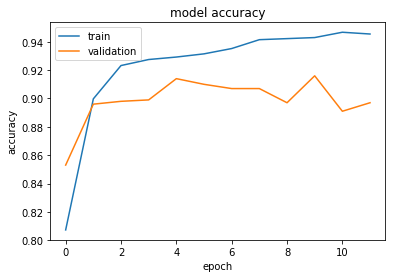

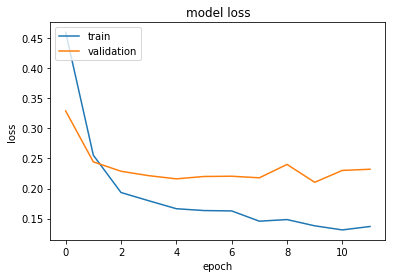

0.96374375


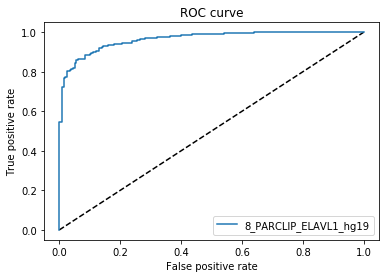

9_PARCLIP_ELAVL1MNASE_hg19


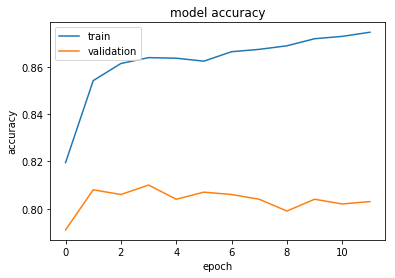

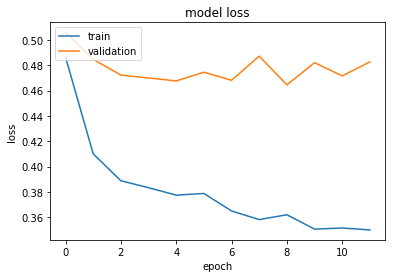

0.7457812500000001


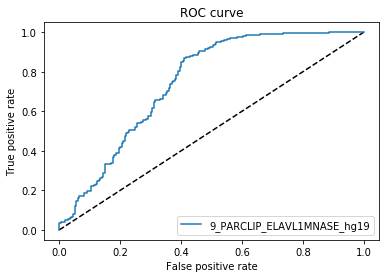

10_PARCLIP_ELAVL1A_hg19


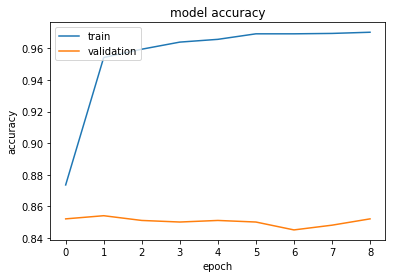

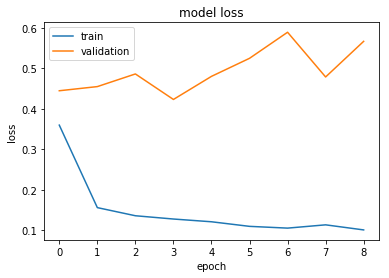

0.9401437499999998


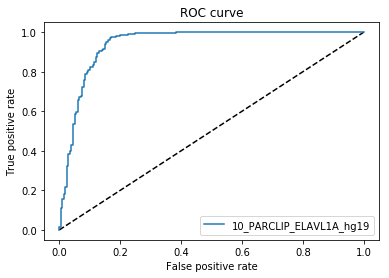

10_PARCLIP_ELAVL1A_hg19


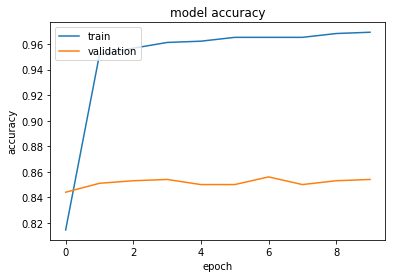

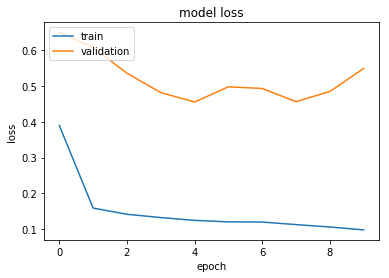

0.9343875


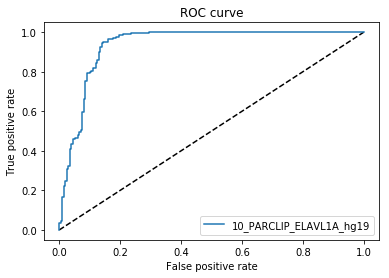

12_PARCLIP_EWSR1_hg19


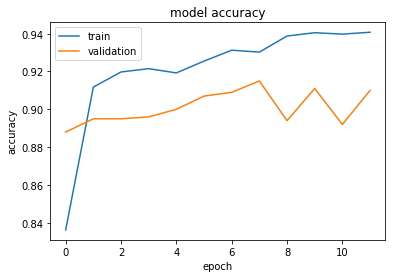

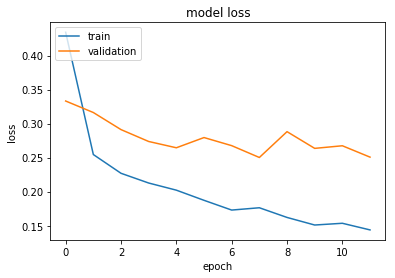

0.9669812499999999


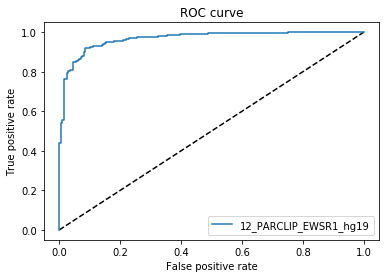

13_PARCLIP_FUS_hg19


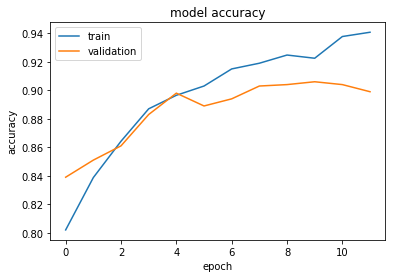

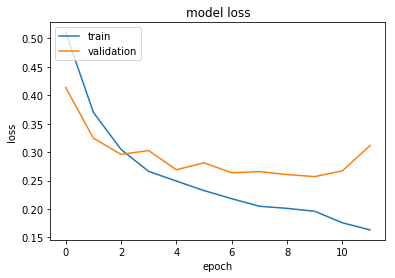

0.9281187500000001


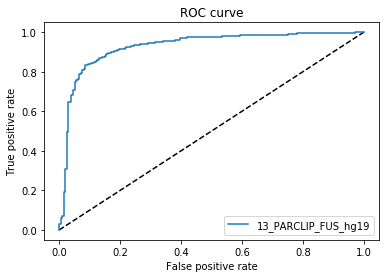

14_PARCLIP_FUS_mut_hg19


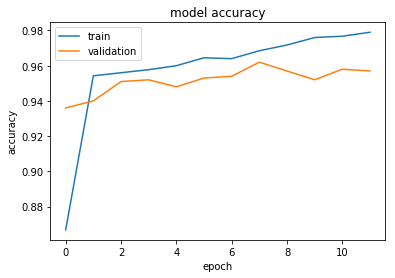

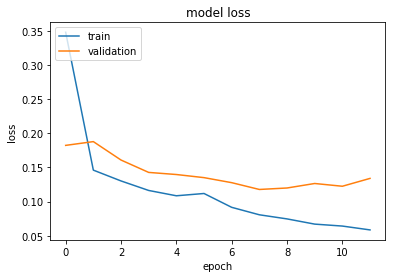

0.9791000000000001


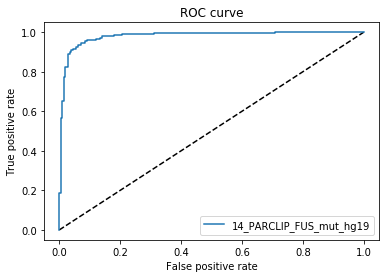

15_PARCLIP_IGF2BP123_hg19


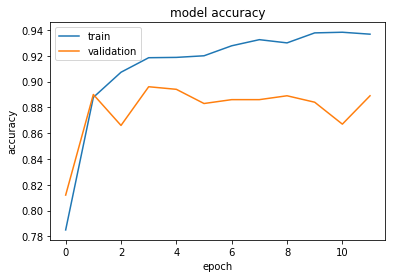

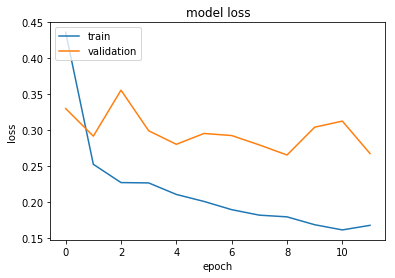

0.94618125


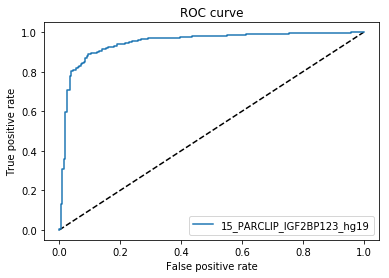

16_ICLIP_hnRNPC_Hela_iCLIP_all_clusters


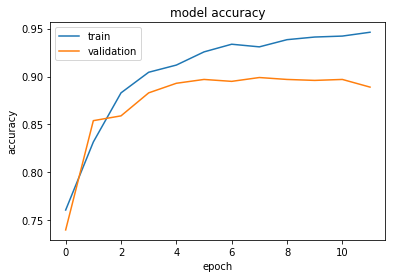

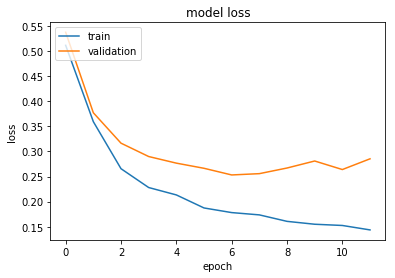

0.9423312500000001


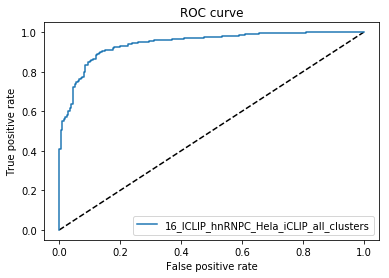

17_ICLIP_HNRNPC_hg19


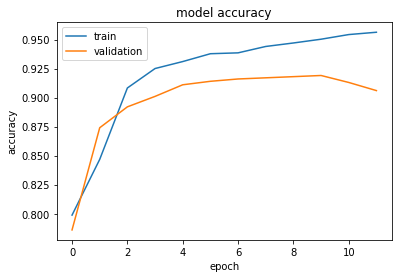

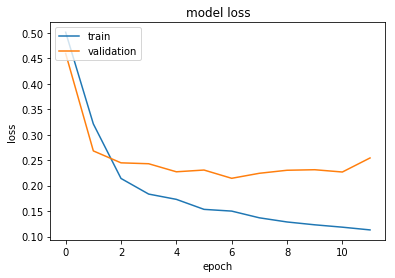

0.9739062500000001


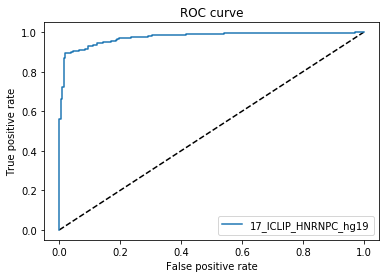

18_ICLIP_hnRNPL_Hela_group_3975_all-hnRNPL-Hela-hg19_sum_G_hg19--ensembl59_from_2337-2339-741_bedGraph-cDNA-hits-in-genome


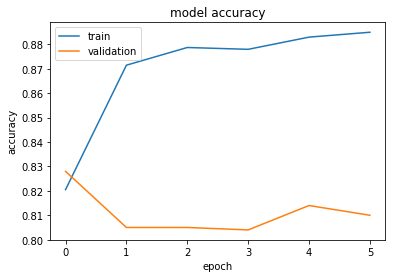

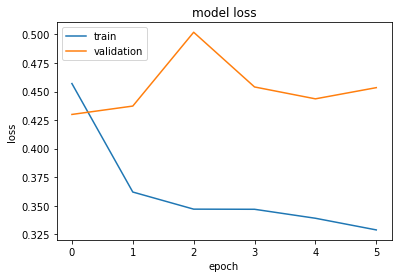

0.7771187499999999


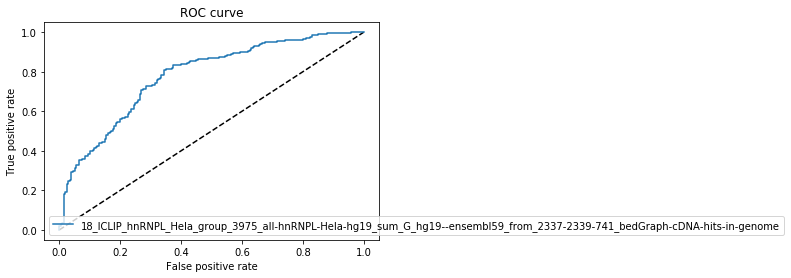

19_ICLIP_hnRNPL_U266_group_3986_all-hnRNPL-U266-hg19_sum_G_hg19--ensembl59_from_2485_bedGraph-cDNA-hits-in-genome


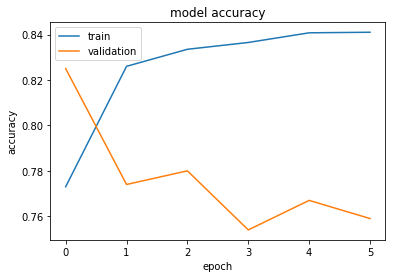

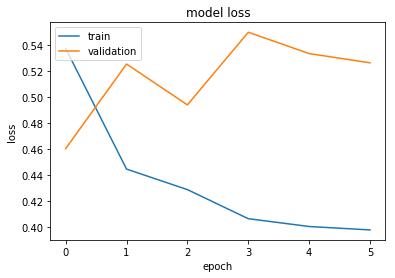

0.68004375


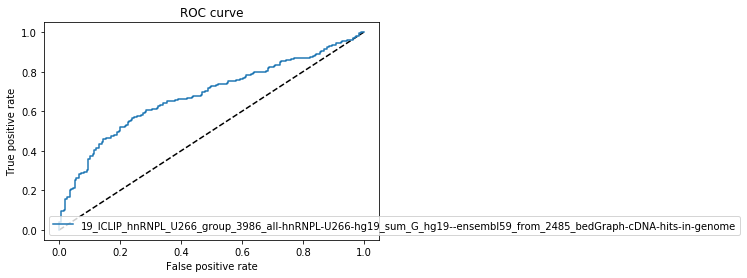

20_ICLIP_hnRNPlike_U266_group_4000_all-hnRNPLlike-U266-hg19_sum_G_hg19--ensembl59_from_2342-2486_bedGraph-cDNA-hits-in-genome


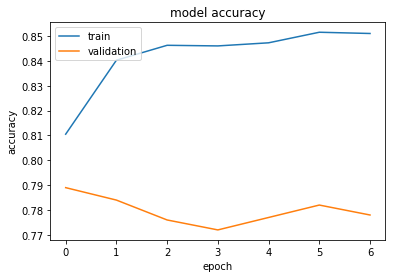

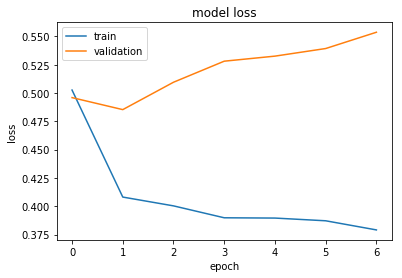

0.70166875


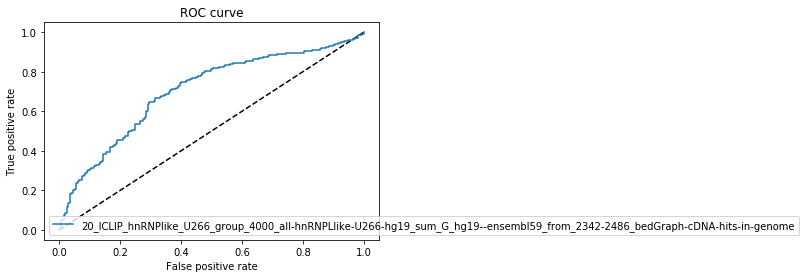

21_PARCLIP_MOV10_Sievers_hg19


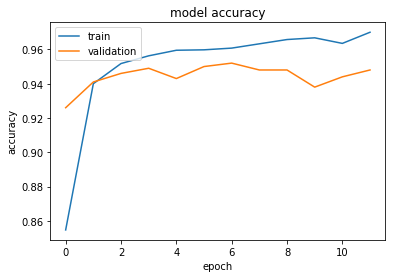

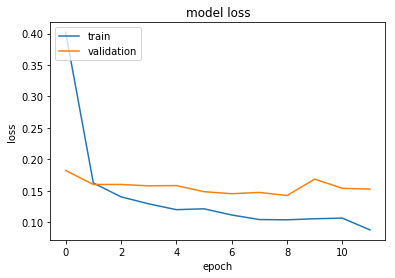

0.97808125


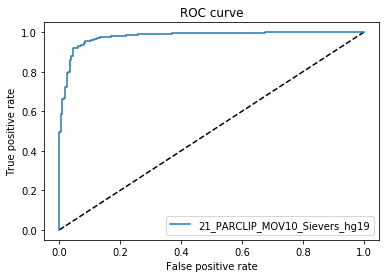

22_ICLIP_NSUN2_293_group_4007_all-NSUN2-293-hg19_sum_G_hg19--ensembl59_from_3137-3202_bedGraph-cDNA-hits-in-genome


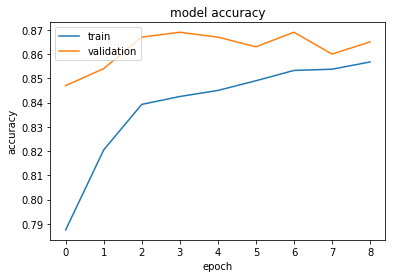

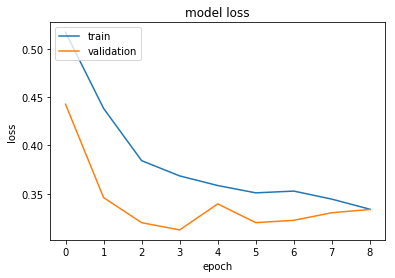

0.84450625


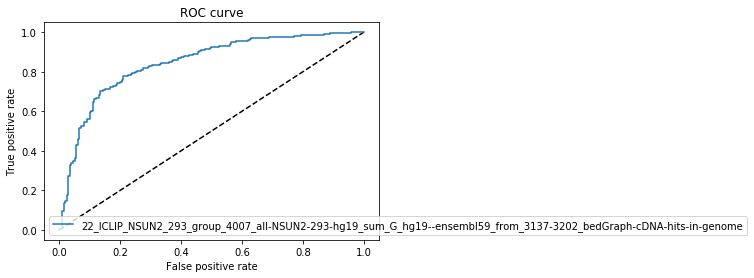

23_PARCLIP_PUM2_hg19


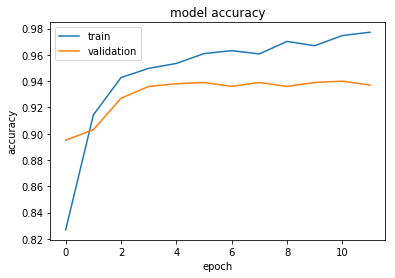

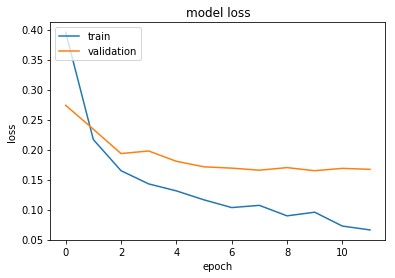

0.99000625


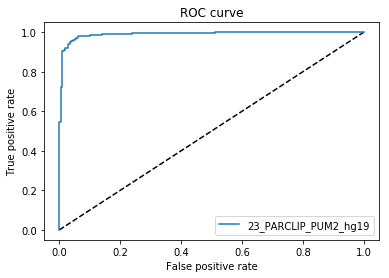

24_PARCLIP_QKI_hg19


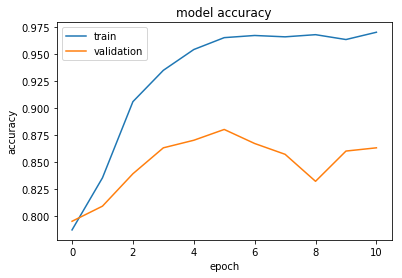

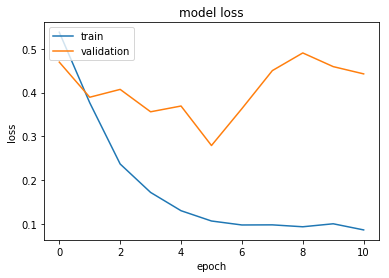

0.9641499999999998


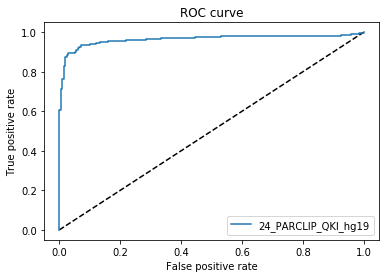

25_CLIPSEQ_SFRS1_hg19


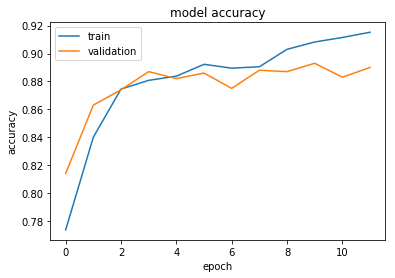

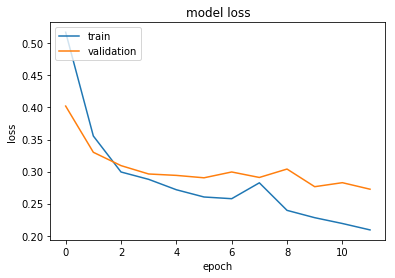

0.9241937499999999


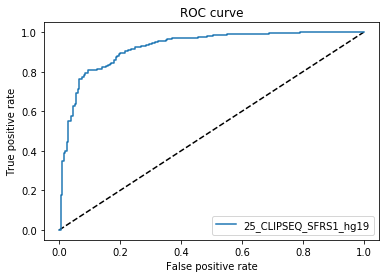

26_PARCLIP_TAF15_hg19


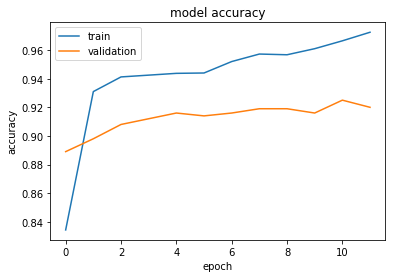

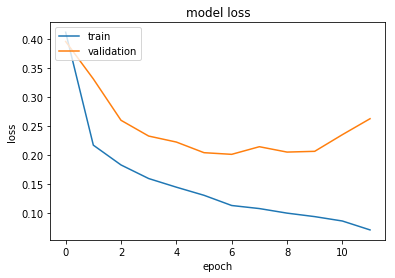

0.9778875


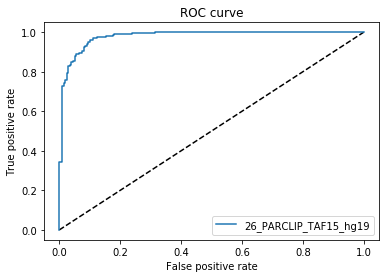

27_ICLIP_TDP43_hg19


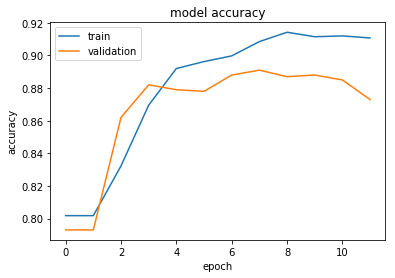

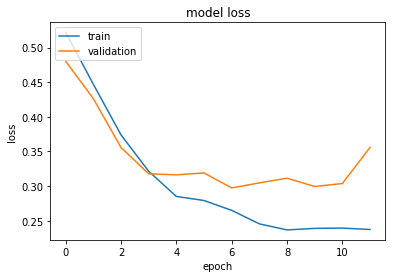

0.8919750000000001


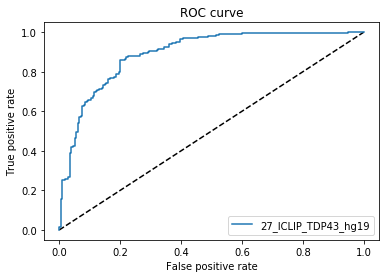

28_ICLIP_TIA1_hg19


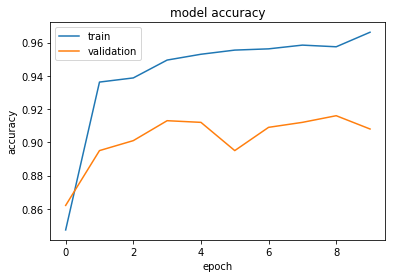

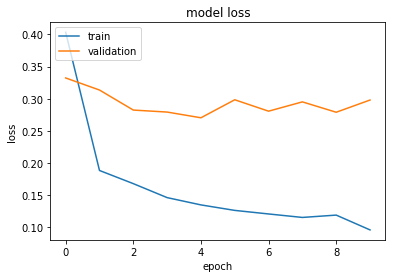

0.96765625


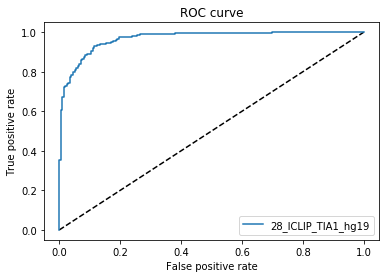

29_ICLIP_TIAL1_hg19


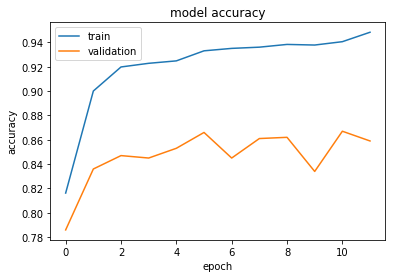

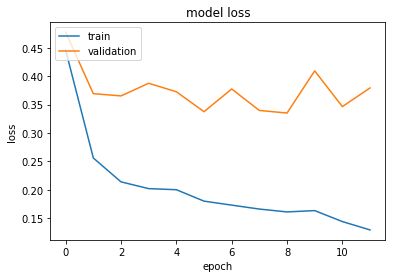

0.9282812500000002


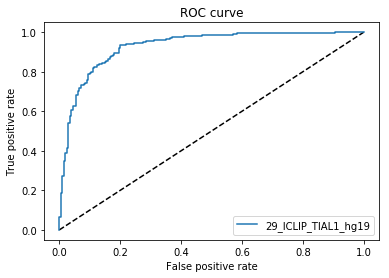

30_ICLIP_U2AF65_Hela_iCLIP_ctrl_all_clusters


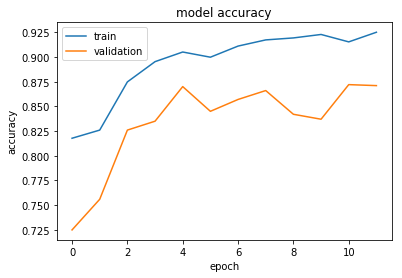

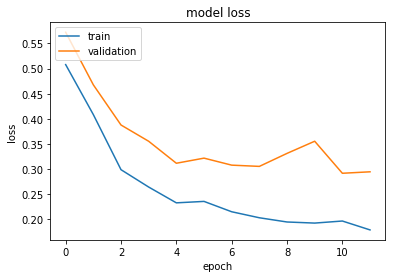

0.938475


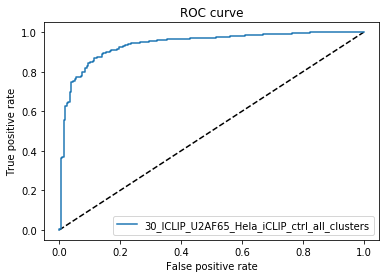

31_ICLIP_U2AF65_Hela_iCLIP_ctrl+kd_all_clusters


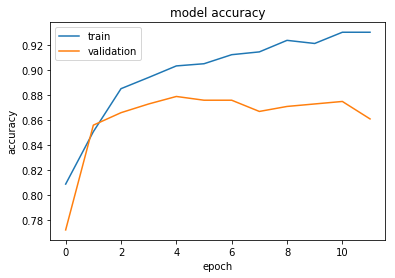

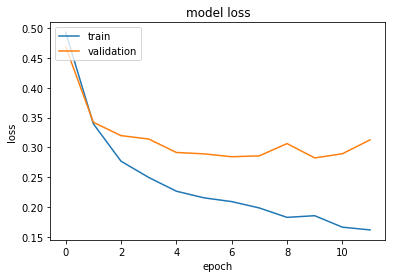

0.9336


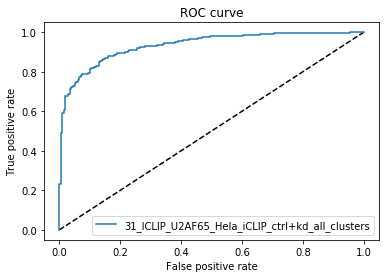

[0.8985000000000001, 0.7460062500000001, 0.92445, 0.9375562500000001, 0.76429375, 0.9348249999999998, 0.97129375, 0.96374375, 0.7457812500000001, 0.9401437499999998, 0.9343875, 0.9669812499999999, 0.9281187500000001, 0.9791000000000001, 0.94618125, 0.9423312500000001, 0.9739062500000001, 0.7771187499999999, 0.68004375, 0.70166875, 0.97808125, 0.84450625, 0.99000625, 0.9641499999999998, 0.9241937499999999, 0.9778875, 0.8919750000000001, 0.96765625, 0.9282812500000002, 0.938475, 0.9336]


In [10]:
score_list = []
protein_list = ["1_PARCLIP_AGO1234_hg19", "2_PARCLIP_AGO2MNASE_hg19","3_HITSCLIP_Ago2_binding_clusters","4_HITSCLIP_Ago2_binding_clusters_2","5_CLIPSEQ_AGO2_hg19", "6_CLIP-seq-eIF4AIII_1","7_CLIP-seq-eIF4AIII_2","8_PARCLIP_ELAVL1_hg19","9_PARCLIP_ELAVL1MNASE_hg19", "10_PARCLIP_ELAVL1A_hg19", "10_PARCLIP_ELAVL1A_hg19", "12_PARCLIP_EWSR1_hg19", "13_PARCLIP_FUS_hg19", "14_PARCLIP_FUS_mut_hg19", "15_PARCLIP_IGF2BP123_hg19", "16_ICLIP_hnRNPC_Hela_iCLIP_all_clusters", "17_ICLIP_HNRNPC_hg19", "18_ICLIP_hnRNPL_Hela_group_3975_all-hnRNPL-Hela-hg19_sum_G_hg19--ensembl59_from_2337-2339-741_bedGraph-cDNA-hits-in-genome", "19_ICLIP_hnRNPL_U266_group_3986_all-hnRNPL-U266-hg19_sum_G_hg19--ensembl59_from_2485_bedGraph-cDNA-hits-in-genome", "20_ICLIP_hnRNPlike_U266_group_4000_all-hnRNPLlike-U266-hg19_sum_G_hg19--ensembl59_from_2342-2486_bedGraph-cDNA-hits-in-genome", "21_PARCLIP_MOV10_Sievers_hg19", "22_ICLIP_NSUN2_293_group_4007_all-NSUN2-293-hg19_sum_G_hg19--ensembl59_from_3137-3202_bedGraph-cDNA-hits-in-genome", "23_PARCLIP_PUM2_hg19", "24_PARCLIP_QKI_hg19", "25_CLIPSEQ_SFRS1_hg19","26_PARCLIP_TAF15_hg19", "27_ICLIP_TDP43_hg19", "28_ICLIP_TIA1_hg19", "29_ICLIP_TIAL1_hg19", "30_ICLIP_U2AF65_Hela_iCLIP_ctrl_all_clusters", "31_ICLIP_U2AF65_Hela_iCLIP_ctrl+kd_all_clusters"]


for x in range (0,31):

    protein = protein_list[x]
    
    print (protein)
    
    X = np.dstack((get_cobinding(protein,"train"), get_seq(protein,"train"), get_region(protein,"train"), get_fold(protein, "train")))
    y = get_class(protein,"train")
    
    size = X.shape[2]
    
   
    
    score = []
    
    model = Sequential()
    model.add(Conv1D(60,6, data_format='channels_last', input_shape=(101, size) , strides = 1, padding='valid'))
    model.add(MaxPooling1D(pool_size=20, strides=1, padding='valid'))
    model.add(Conv1D(60, 4, activation='relu'))
    model.add(Dropout(0.2))
    model.add(MaxPooling1D(pool_size=40, strides=1, padding='valid'))
    model.add(Conv1D(60, 4, activation='relu'))
    model.add(MaxPooling1D(pool_size=30, strides=1, padding='valid'))
    model.add(Conv1D(60, 3, activation='relu'))
    model.add(GlobalAveragePooling1D())


    model.add(Dense(200, activation='relu'))
    model.add(Dropout(0.1))
    model.add(Dense(2, activation='sigmoid'))

    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    checkpointer = ModelCheckpoint(filepath="models/" + protein + "_weights.hdf5", verbose=0, save_best_only=True)
    earlystopper = EarlyStopping(monitor='val_loss', patience=5, verbose=0)


    X_train = X
    y_train = y

    metrics = model.fit(X_train, y_train, validation_split = 0.2, epochs=12, batch_size=200, verbose=0, callbacks=[earlystopper])

    
    # plot history for accuracy
    plt.plot(metrics.history['acc'])
    plt.plot(metrics.history['val_acc'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()


    # plot loss function history
    plt.plot(metrics.history['loss'])
    plt.plot(metrics.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()
    
    #run predictions
    X_test = np.dstack((get_cobinding(protein,"test"), get_seq(protein,"test"), get_region(protein,"test"), get_fold(protein, "test")))
    y_test = get_class(protein,"test")


    y_scores = model.predict(X_test)
    y_scores = y_scores [:,0:1]
    y_test = y_test [:,0:1]

    score = roc_auc_score(y_test, y_scores)
    print (score)
    score_list.append(score)

    fpr, tpr, thresholds = roc_curve(y_test, y_scores)

    #ROC plot
    plt.figure(1)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.plot(fpr, tpr, label=protein.format(score))
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('ROC curve')
    plt.legend(loc='best')
    plt.show()

print(score_list)

In [17]:
#30k datasets

import numpy as np
from Bio import SeqIO
import gzip
import os
from keras.models import Sequential
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.layers import Dense, Activation, Conv1D, MaxPooling1D, Flatten, GlobalAveragePooling1D, Dropout
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score, roc_curve
import pandas as pd
import matplotlib.pyplot as plt


np.random.seed(454)


def load_data(path):
        
    data = gzip.open(os.path.join(path,"sequences.fa.gz"),"rt")
    return data


def get_seq(protein, t_data):
    
    
    if t_data == "train":
                
        training_data = load_data("datasets/clip/%s/30000/training_sample_0"% protein)
        x_train = np.zeros((30000,101,4))          
    
    elif t_data == "test":    
                
        training_data = load_data("datasets/clip/%s/30000/test_sample_0"% protein)
        x_train = np.zeros((10000,101,4))      
    
    
    
    r = 0    
    
   
    
    for record in SeqIO.parse(training_data,"fasta"):
        sequence = list(record.seq)                
        nucleotide = {'A' : 0, 'T' : 1, 'G' : 2, 'C' : 3, 'N' : 4} 
        num_seq = list() #sekvenca v številskem formatu


        for i in range(0,len(sequence)):
                num_seq.append(nucleotide[sequence[i]])


        X = np.zeros((1,len(num_seq),4))

        
        for i in range (len(num_seq)):
                if num_seq[i] <= 3:
                    X[:,i,num_seq[i]] = 1               

        x_train[r,:,:] = X
        r = r + 1
    
    return x_train


def get_class(protein, t_data):
    y_train = []
    

    if t_data == 'train':
        data = load_data("datasets/clip/%s/30000/training_sample_0"% protein)

    elif t_data == 'test':
        data = load_data("datasets/clip/%s/30000/test_sample_0"% protein)


    for record in SeqIO.parse(data,"fasta"):
        v = int((record.description).split(":")[1])
        y_train.append([int(v == 0), int(v != 0)])

    y_train = np.array(y_train)
    return y_train


def get_cobinding(protein, t_data):
    if t_data == "train":
        with gzip.open(("datasets/clip/%s/30000/training_sample_0/matrix_Cobinding.tab.gz"% protein), "rt") as f:
            cobinding_data = np.loadtxt(f, skiprows=1) 
            
        cobinding = np.zeros((30000,101,cobinding_data.shape[1]/101),dtype=np.int)    
    elif t_data == "test":
        with gzip.open(("datasets/clip/%s/30000/test_sample_0/matrix_Cobinding.tab.gz"% protein), "rt") as f:
            cobinding_data = np.loadtxt(f, skiprows=1) 
        cobinding = np.zeros((10000,101,cobinding_data.shape[1]/101),dtype=np.int)
   
    
    for n in range(0,cobinding_data.shape[1],101):
        a = cobinding_data[:,n:(n+101)]
        cobinding[:,:,(n/101)] = a
    
    return cobinding
    

def get_region (protein, t_data):
    
    if t_data == "train":
        with gzip.open(("datasets/clip/%s/30000/training_sample_0/matrix_RegionType.tab.gz"% protein), "rt") as f:
            region_data = np.loadtxt(f, skiprows=1)
        region = np.zeros((30000,101,region_data.shape[1]/101),dtype=np.int)
                             
    elif t_data == "test":
        with gzip.open(("datasets/clip/%s/30000/test_sample_0/matrix_RegionType.tab.gz"% protein), "rt") as f:
            region_data = np.loadtxt(f, skiprows=1) 
        region = np.zeros((10000,101,region_data.shape[1]/101),dtype=np.int)
    

    for n in range(0,region_data.shape[1],101):
        a = region_data[:,n:(n+101)]
        region[:,:,(n/101)] = a
        
    return region


def get_fold (protein, t_data):
    
    if t_data == "train":
        with gzip.open(("datasets/clip/%s/30000/training_sample_0/matrix_RNAfold.tab.gz"% protein), "rt") as f:
            fold_data = np.loadtxt(f, skiprows=1) 
        fold = np.zeros((30000,101,fold_data.shape[1]/101),dtype=np.int)
                             
    elif t_data == "test":
        with gzip.open(("datasets/clip/%s/30000/test_sample_0/matrix_RNAfold.tab.gz"% protein), "rt") as f:
            fold_data = np.loadtxt(f, skiprows=1) 
        fold = np.zeros((10000,101,fold_data.shape[1]/101),dtype=np.int)




    for n in range(0,fold_data.shape[1],101):
        a = fold_data[:,n:(n+101)]
        fold[:,:,(n/101)] = a
    
    
    return fold


1_PARCLIP_AGO1234_hg19


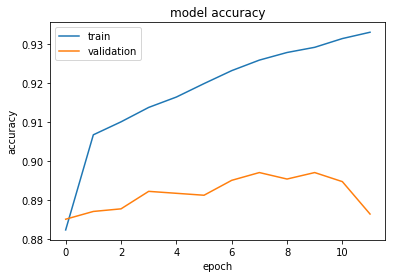

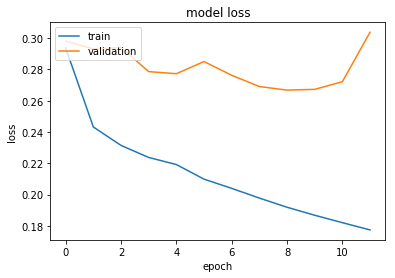

0.93355259375


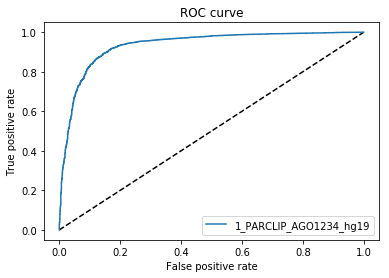

2_PARCLIP_AGO2MNASE_hg19


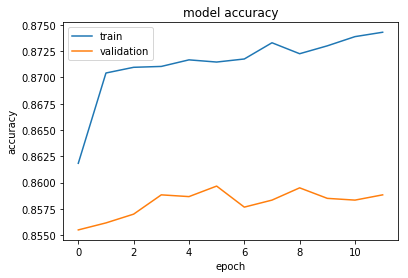

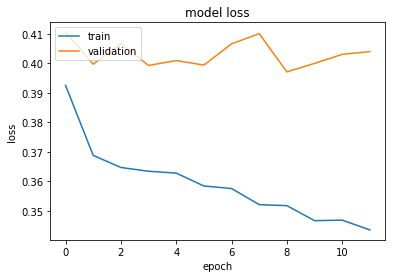

0.76494834375


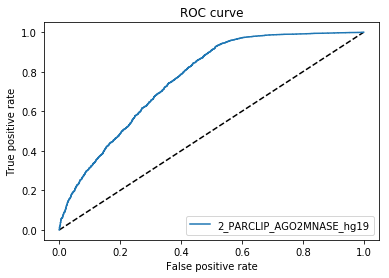

3_HITSCLIP_Ago2_binding_clusters


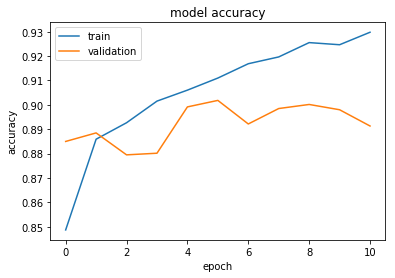

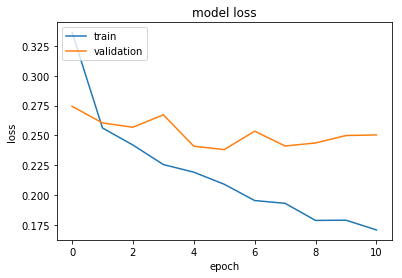

0.9452638750000001


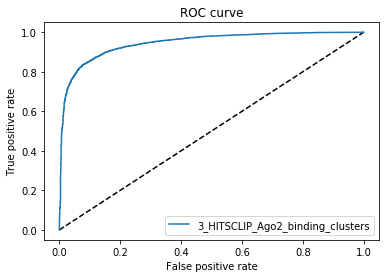

4_HITSCLIP_Ago2_binding_clusters_2


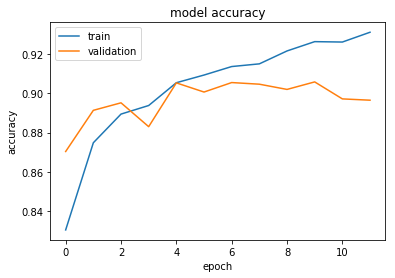

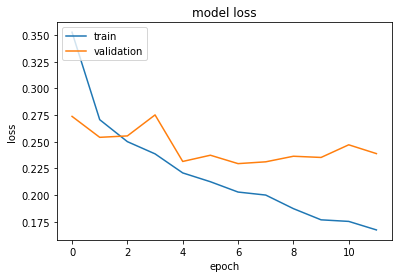

0.94973265625


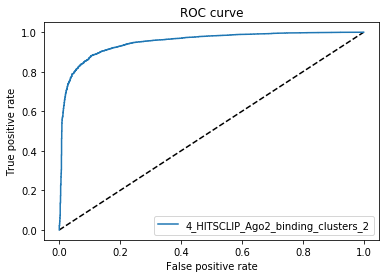

5_CLIPSEQ_AGO2_hg19


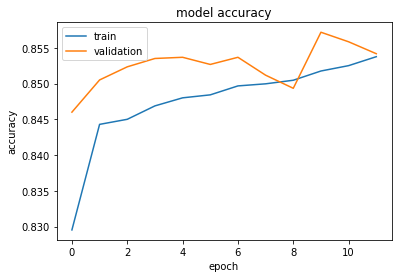

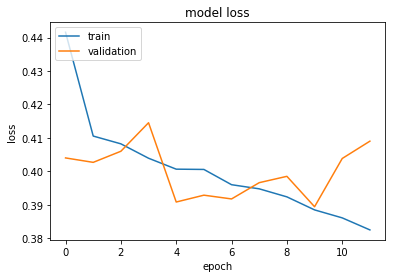

0.77152384375


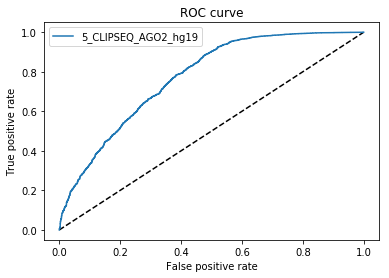

6_CLIP-seq-eIF4AIII_1


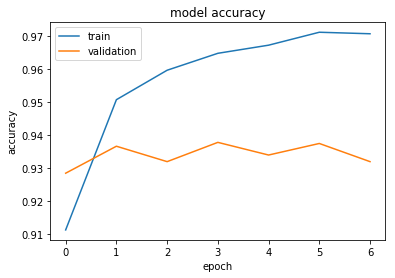

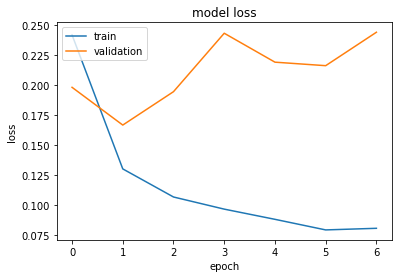

0.9582632812499999


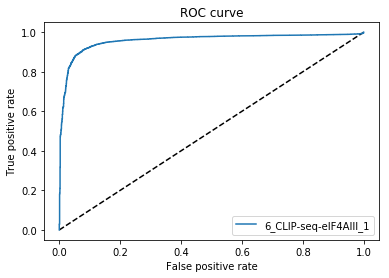

7_CLIP-seq-eIF4AIII_2


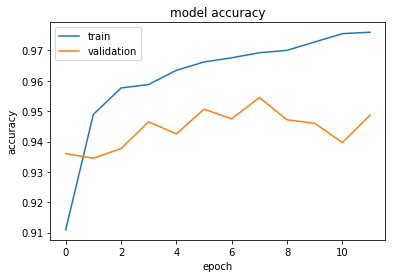

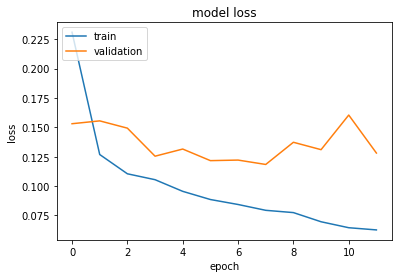

0.9752335625000002


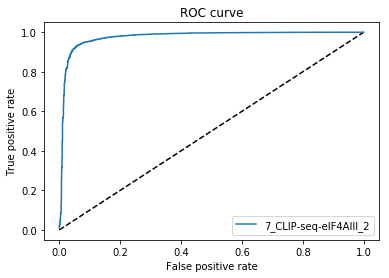

8_PARCLIP_ELAVL1_hg19


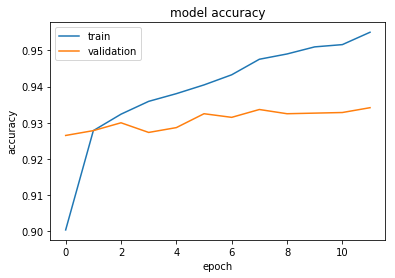

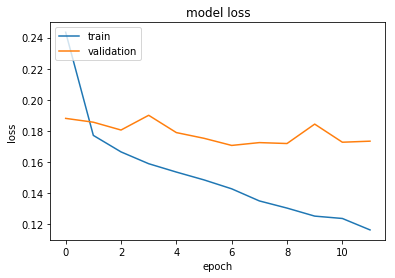

0.9687438125000001


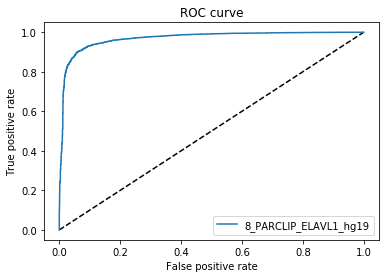

9_PARCLIP_ELAVL1MNASE_hg19


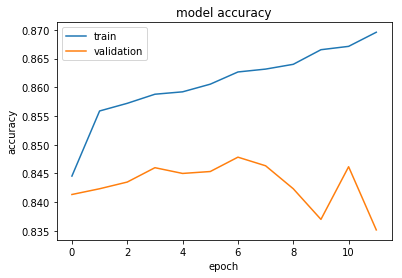

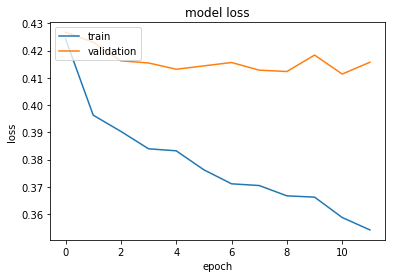

0.76417015625


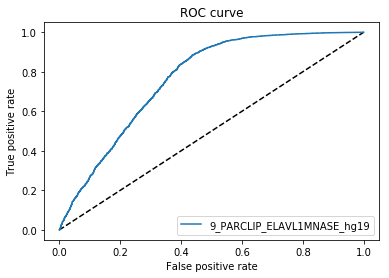

10_PARCLIP_ELAVL1A_hg19


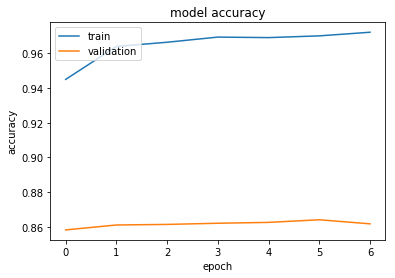

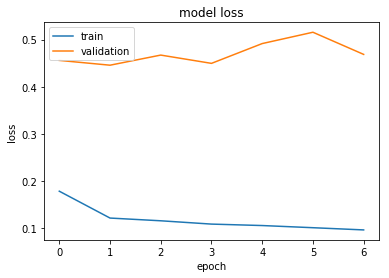

0.92554928125


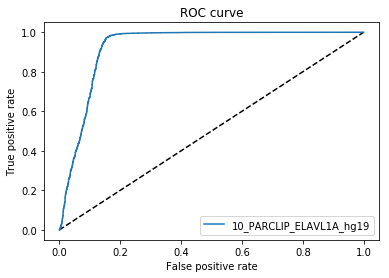

10_PARCLIP_ELAVL1A_hg19


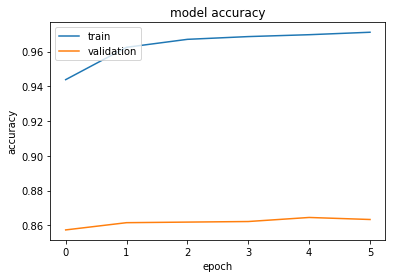

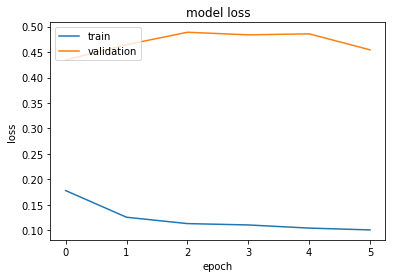

0.9481649062499999


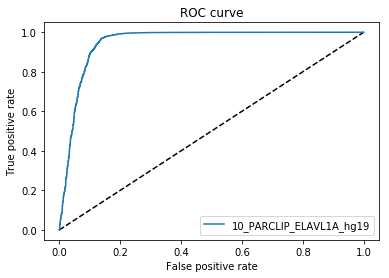

12_PARCLIP_EWSR1_hg19


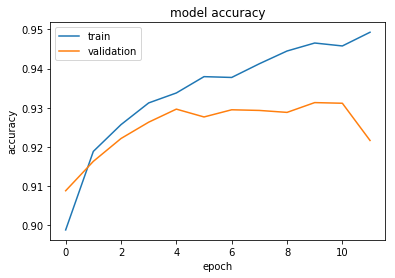

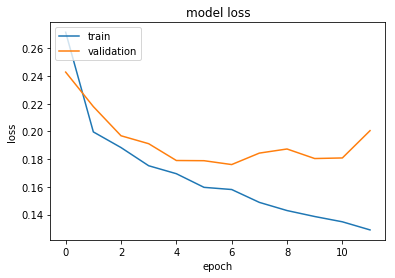

0.96474009375


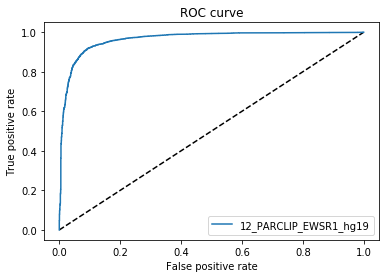

13_PARCLIP_FUS_hg19


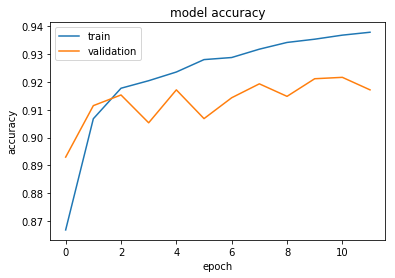

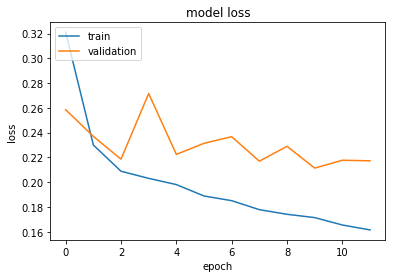

0.95151325


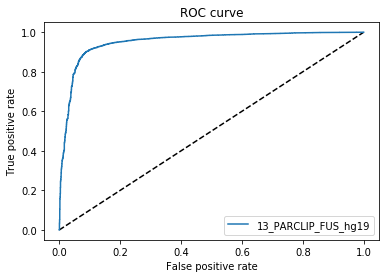

14_PARCLIP_FUS_mut_hg19


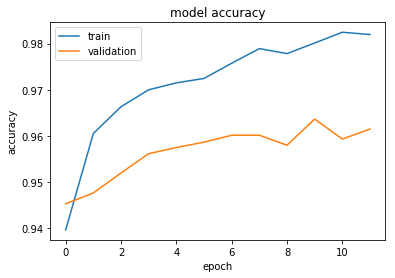

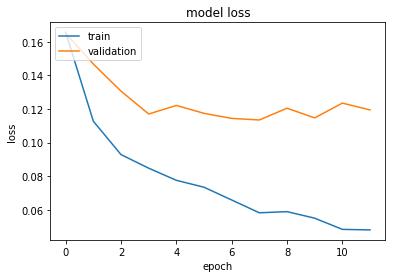

0.99254175


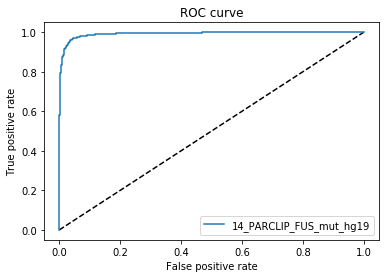

15_PARCLIP_IGF2BP123_hg19


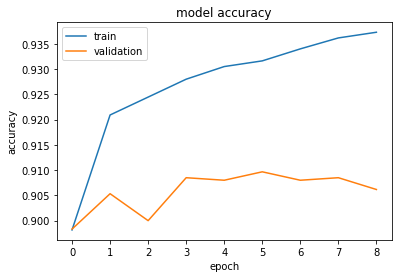

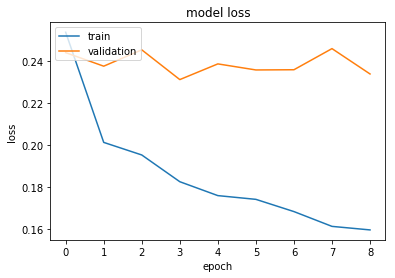

0.9606924375


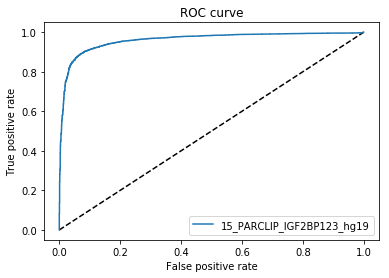

16_ICLIP_hnRNPC_Hela_iCLIP_all_clusters


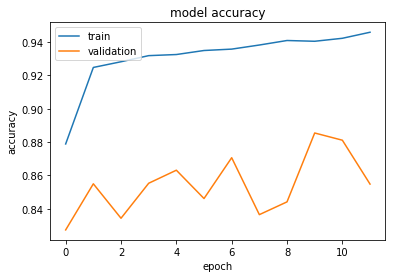

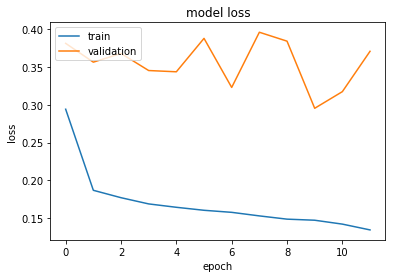

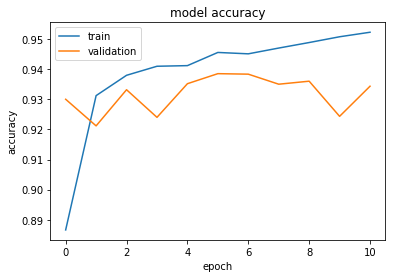

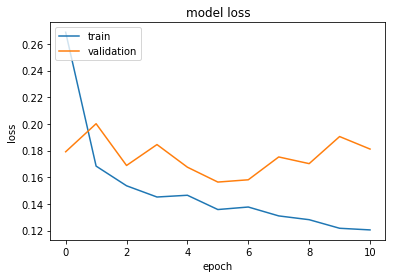

0.9714602812500001


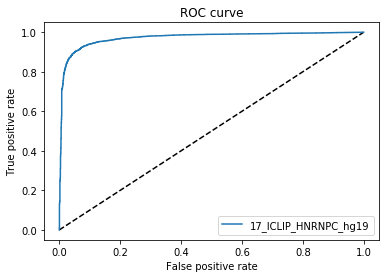

18_ICLIP_hnRNPL_Hela_group_3975_all-hnRNPL-Hela-hg19_sum_G_hg19--ensembl59_from_2337-2339-741_bedGraph-cDNA-hits-in-genome


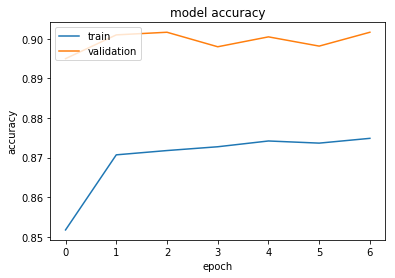

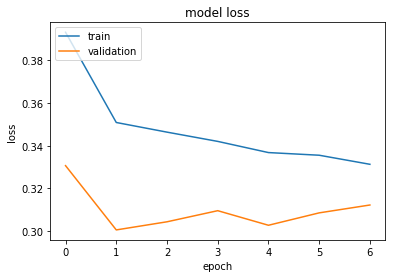

0.8549026562500001


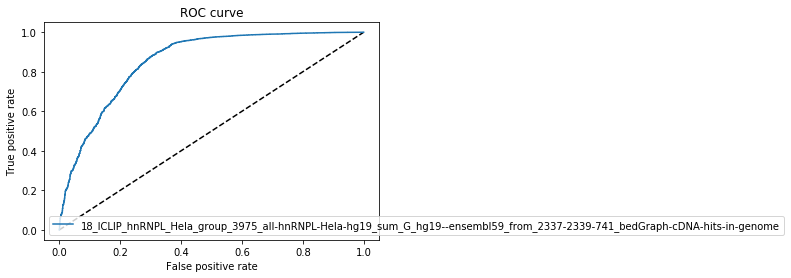

19_ICLIP_hnRNPL_U266_group_3986_all-hnRNPL-U266-hg19_sum_G_hg19--ensembl59_from_2485_bedGraph-cDNA-hits-in-genome


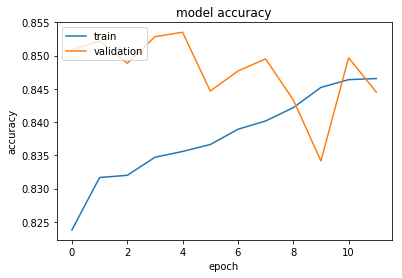

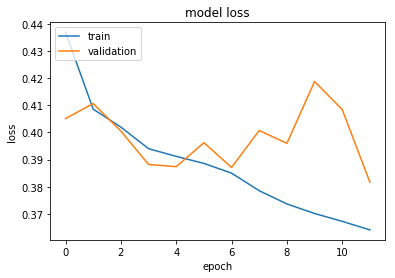

0.793634


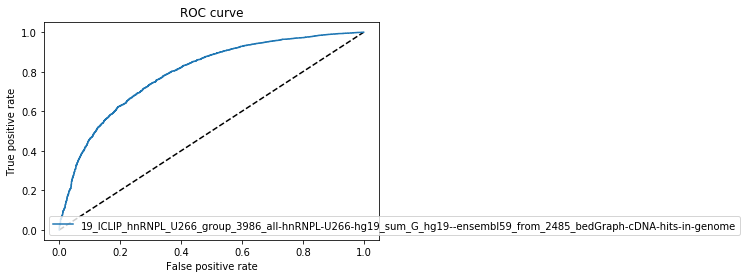

20_ICLIP_hnRNPlike_U266_group_4000_all-hnRNPLlike-U266-hg19_sum_G_hg19--ensembl59_from_2342-2486_bedGraph-cDNA-hits-in-genome


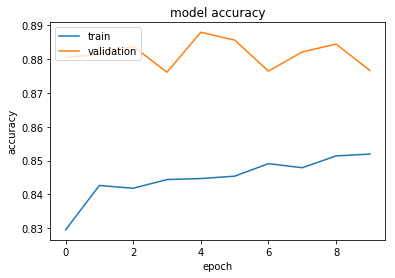

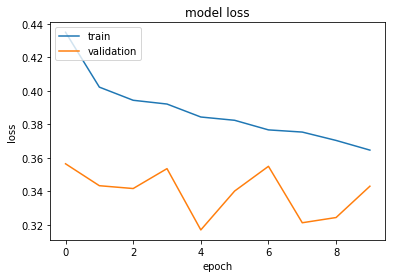

0.80276684375


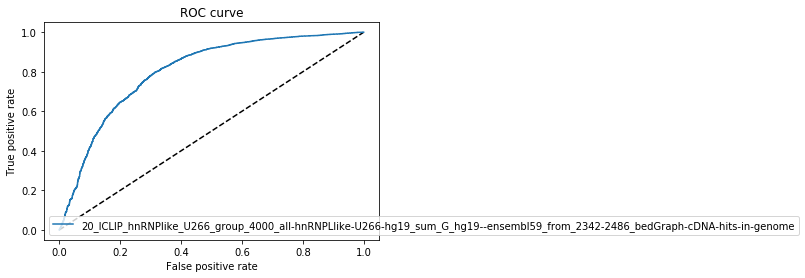

21_PARCLIP_MOV10_Sievers_hg19


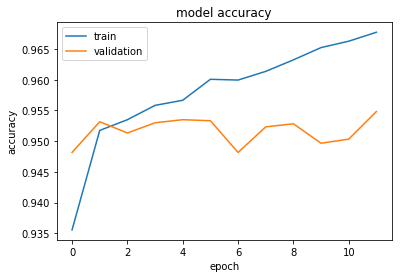

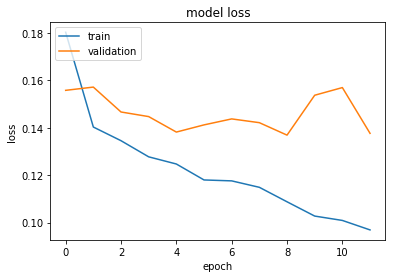

0.9771661249999999


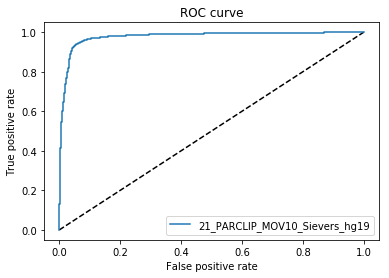

22_ICLIP_NSUN2_293_group_4007_all-NSUN2-293-hg19_sum_G_hg19--ensembl59_from_3137-3202_bedGraph-cDNA-hits-in-genome


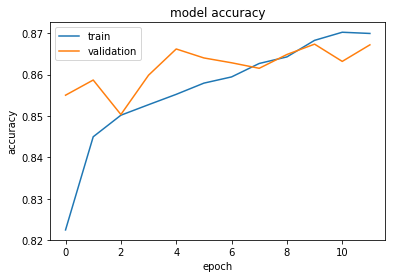

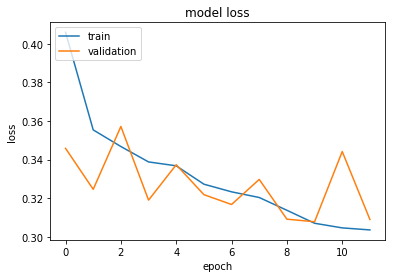

0.8770343125


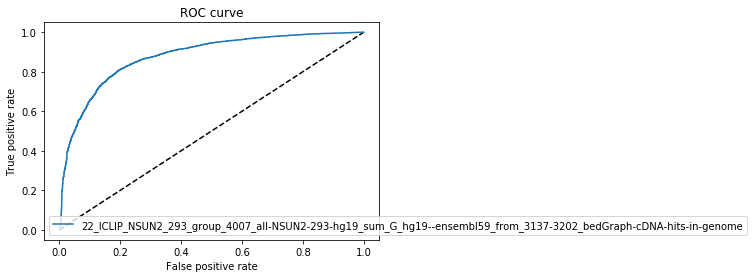

23_PARCLIP_PUM2_hg19


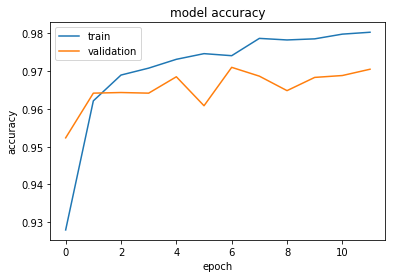

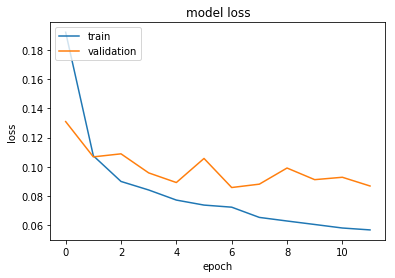

0.9900286875000002


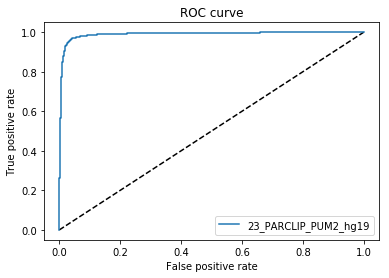

24_PARCLIP_QKI_hg19


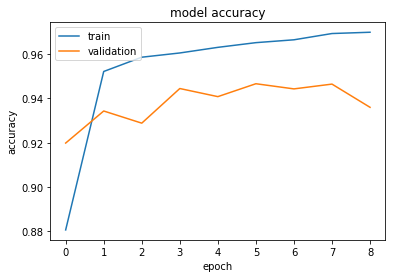

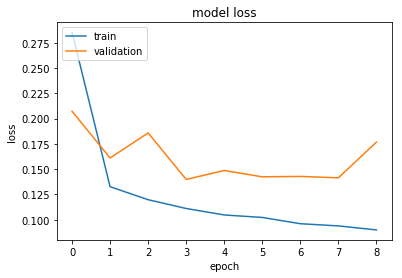

0.9802337500000001


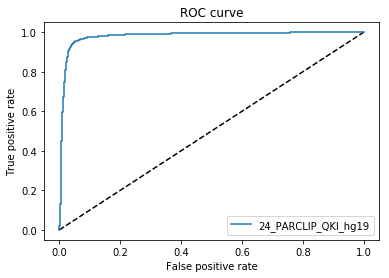

25_CLIPSEQ_SFRS1_hg19


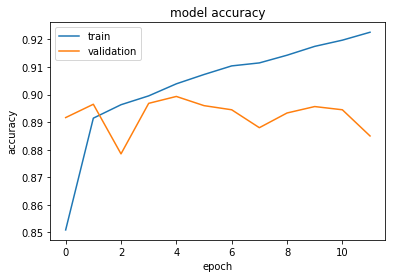

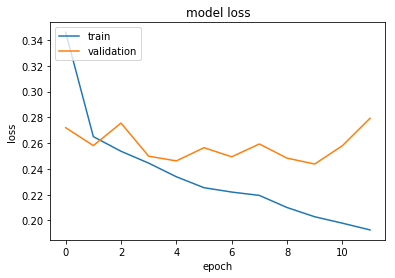

0.927933625


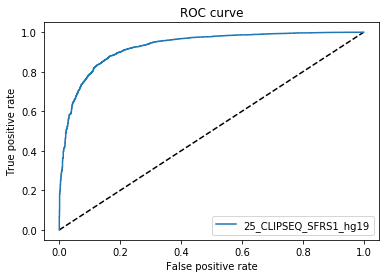

26_PARCLIP_TAF15_hg19


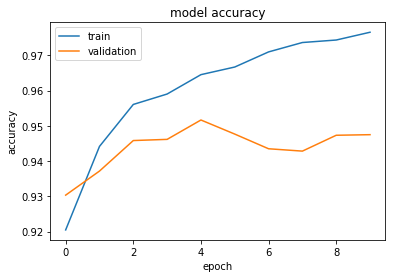

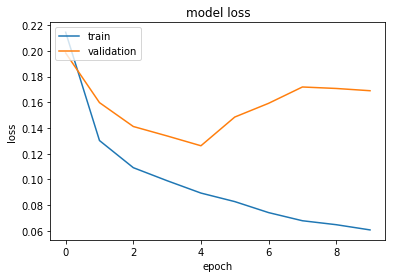

0.98297865625


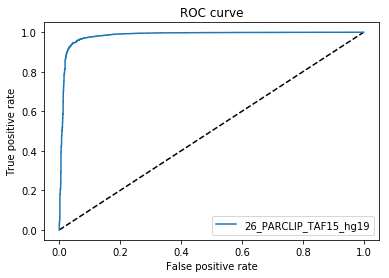

27_ICLIP_TDP43_hg19


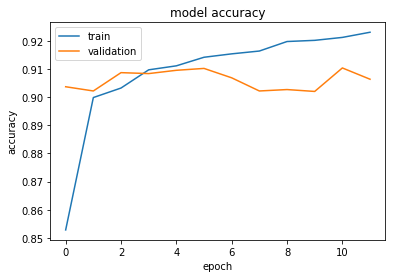

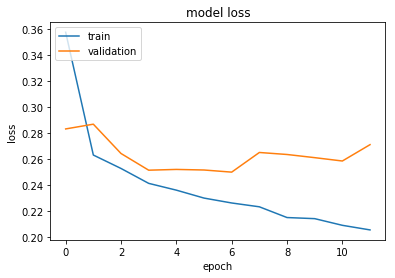

0.9195029374999999


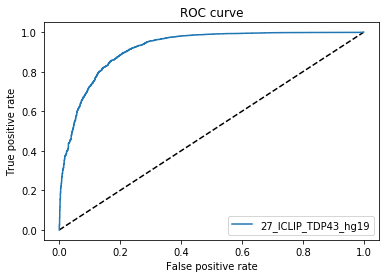

28_ICLIP_TIA1_hg19


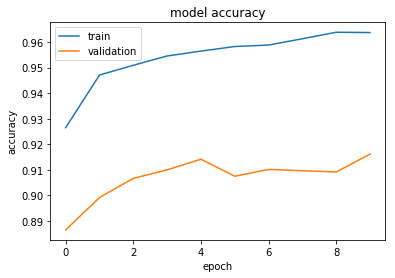

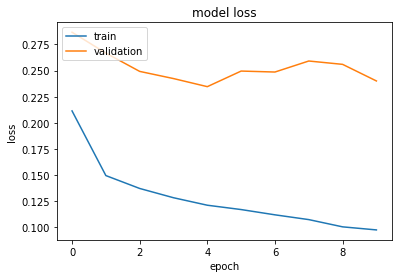

0.9773015624999999


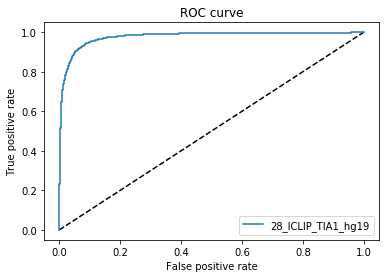

29_ICLIP_TIAL1_hg19


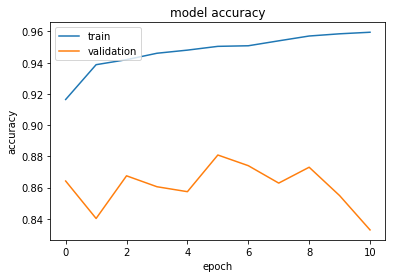

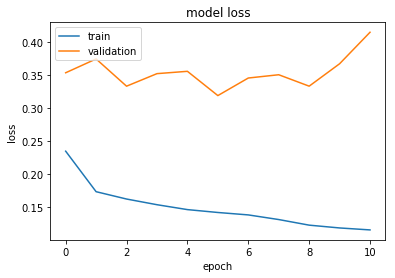

0.95274246875


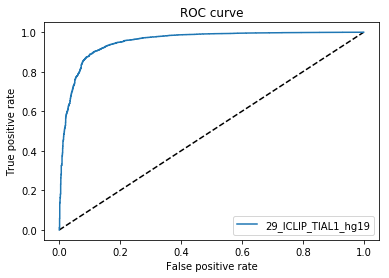

30_ICLIP_U2AF65_Hela_iCLIP_ctrl_all_clusters


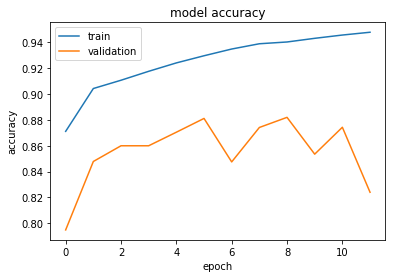

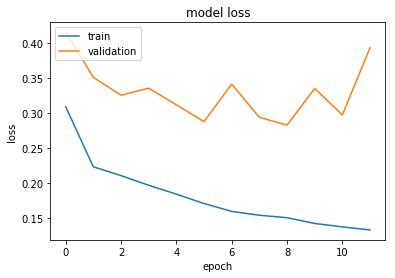

0.9594788750000001


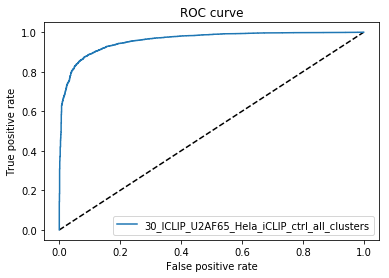

31_ICLIP_U2AF65_Hela_iCLIP_ctrl+kd_all_clusters


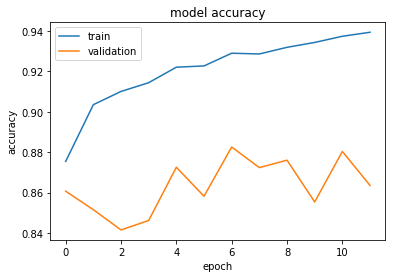

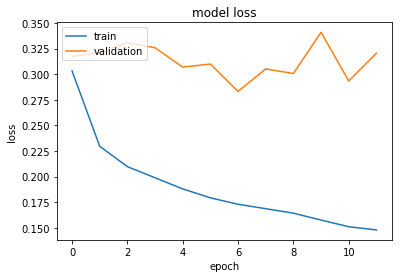

0.9473421875


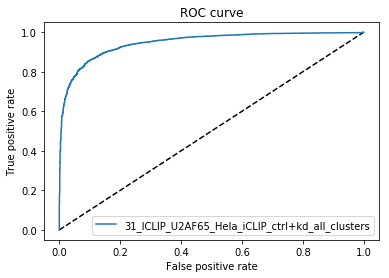

[0.93355259375, 0.76494834375, 0.9452638750000001, 0.94973265625, 0.77152384375, 0.9582632812499999, 0.9752335625000002, 0.9687438125000001, 0.76417015625, 0.92554928125, 0.9481649062499999, 0.96474009375, 0.95151325, 0.99254175, 0.9606924375, 0.96043278125, 0.9714602812500001, 0.8549026562500001, 0.793634, 0.80276684375, 0.9771661249999999, 0.8770343125, 0.9900286875000002, 0.9802337500000001, 0.927933625, 0.98297865625, 0.9195029374999999, 0.9773015624999999, 0.95274246875, 0.9594788750000001, 0.9473421875]


In [18]:
score_list = []
protein_list = ["1_PARCLIP_AGO1234_hg19", "2_PARCLIP_AGO2MNASE_hg19","3_HITSCLIP_Ago2_binding_clusters","4_HITSCLIP_Ago2_binding_clusters_2","5_CLIPSEQ_AGO2_hg19", "6_CLIP-seq-eIF4AIII_1","7_CLIP-seq-eIF4AIII_2","8_PARCLIP_ELAVL1_hg19","9_PARCLIP_ELAVL1MNASE_hg19", "10_PARCLIP_ELAVL1A_hg19", "10_PARCLIP_ELAVL1A_hg19", "12_PARCLIP_EWSR1_hg19", "13_PARCLIP_FUS_hg19", "14_PARCLIP_FUS_mut_hg19", "15_PARCLIP_IGF2BP123_hg19", "16_ICLIP_hnRNPC_Hela_iCLIP_all_clusters", "17_ICLIP_HNRNPC_hg19", "18_ICLIP_hnRNPL_Hela_group_3975_all-hnRNPL-Hela-hg19_sum_G_hg19--ensembl59_from_2337-2339-741_bedGraph-cDNA-hits-in-genome", "19_ICLIP_hnRNPL_U266_group_3986_all-hnRNPL-U266-hg19_sum_G_hg19--ensembl59_from_2485_bedGraph-cDNA-hits-in-genome", "20_ICLIP_hnRNPlike_U266_group_4000_all-hnRNPLlike-U266-hg19_sum_G_hg19--ensembl59_from_2342-2486_bedGraph-cDNA-hits-in-genome", "21_PARCLIP_MOV10_Sievers_hg19", "22_ICLIP_NSUN2_293_group_4007_all-NSUN2-293-hg19_sum_G_hg19--ensembl59_from_3137-3202_bedGraph-cDNA-hits-in-genome", "23_PARCLIP_PUM2_hg19", "24_PARCLIP_QKI_hg19", "25_CLIPSEQ_SFRS1_hg19","26_PARCLIP_TAF15_hg19", "27_ICLIP_TDP43_hg19", "28_ICLIP_TIA1_hg19", "29_ICLIP_TIAL1_hg19", "30_ICLIP_U2AF65_Hela_iCLIP_ctrl_all_clusters", "31_ICLIP_U2AF65_Hela_iCLIP_ctrl+kd_all_clusters"]


for x in range (0,31):

    protein = protein_list[x]
    
    print (protein)
    
    X = np.dstack((get_cobinding(protein,"train"), get_seq(protein,"train"), get_region(protein,"train"), get_fold(protein, "train")))
    y = get_class(protein,"train")
    
    size = X.shape[2]
    
   
    
    score = []
    
    model = Sequential()
    model.add(Conv1D(60,6, data_format='channels_last', input_shape=(101, size) , strides = 1, padding='valid'))
    model.add(MaxPooling1D(pool_size=20, strides=1, padding='valid'))
    model.add(Conv1D(60, 4, activation='relu'))
    model.add(Dropout(0.2))
    model.add(MaxPooling1D(pool_size=40, strides=1, padding='valid'))
    model.add(Conv1D(60, 4, activation='relu'))
    model.add(MaxPooling1D(pool_size=30, strides=1, padding='valid'))
    model.add(Conv1D(60, 3, activation='relu'))
    model.add(GlobalAveragePooling1D())


    model.add(Dense(200, activation='relu'))
    model.add(Dropout(0.1))
    model.add(Dense(2, activation='sigmoid'))

    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    checkpointer = ModelCheckpoint(filepath="models/" + protein + "_weights.hdf5", verbose=0, save_best_only=True)
    earlystopper = EarlyStopping(monitor='val_loss', patience=5, verbose=0)


    X_train = X
    y_train = y

    metrics = model.fit(X_train, y_train, validation_split = 0.2, epochs=12, batch_size=200, verbose=0, callbacks=[earlystopper])

    
    # plot history for accuracy
    plt.plot(metrics.history['acc'])
    plt.plot(metrics.history['val_acc'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()


    # plot loss function history
    plt.plot(metrics.history['loss'])
    plt.plot(metrics.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()
    
    #run predictions
    X_test = np.dstack((get_cobinding(protein,"test"), get_seq(protein,"test"), get_region(protein,"test"), get_fold(protein, "test")))
    y_test = get_class(protein,"test")


    y_scores = model.predict(X_test)
    y_scores = y_scores [:,0:1]
    y_test = y_test [:,0:1]

    score = roc_auc_score(y_test, y_scores)
    print (score)
    score_list.append(score)

    fpr, tpr, thresholds = roc_curve(y_test, y_scores)

    #ROC plot
    plt.figure(1)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.plot(fpr, tpr, label=protein.format(score))
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('ROC curve')
    plt.legend(loc='best')
    plt.show()

print(score_list)

1_PARCLIP_AGO1234_hg19


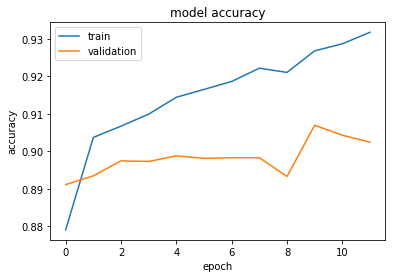

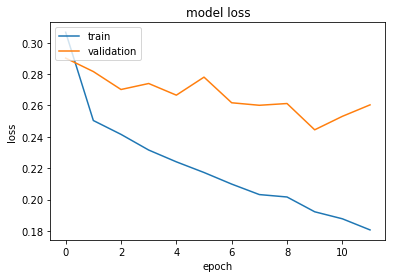

0.9385295625000001


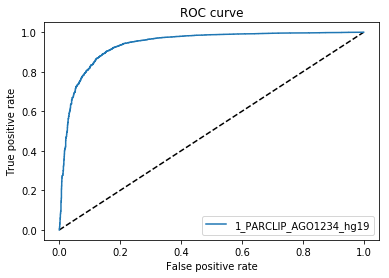

2_PARCLIP_AGO2MNASE_hg19


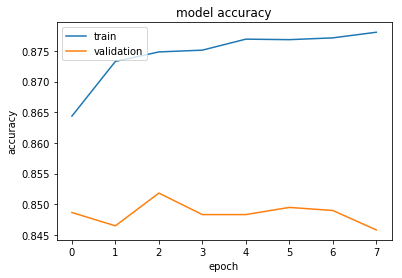

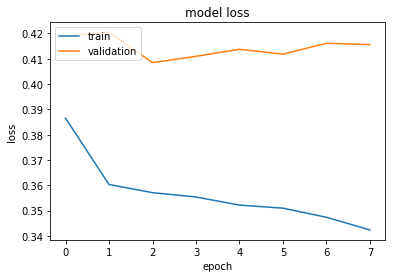

0.7697197812500001


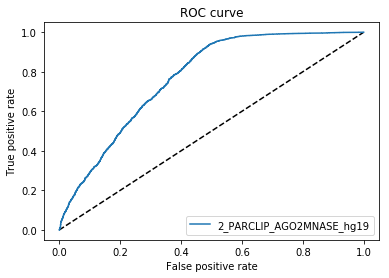

3_HITSCLIP_Ago2_binding_clusters


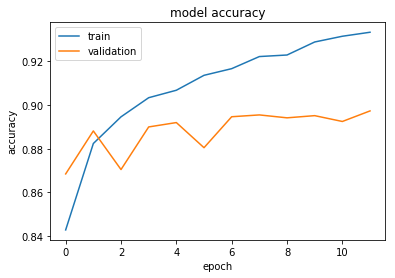

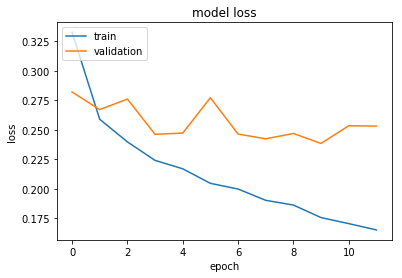

0.9494823124999999


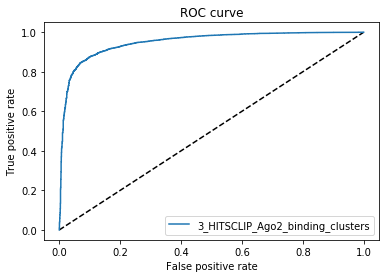

4_HITSCLIP_Ago2_binding_clusters_2


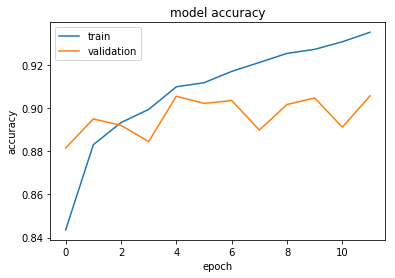

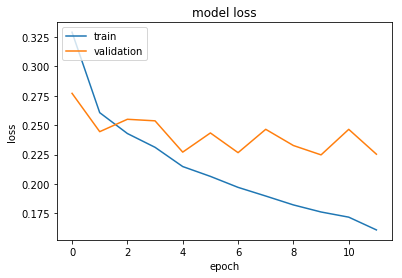

0.950815125


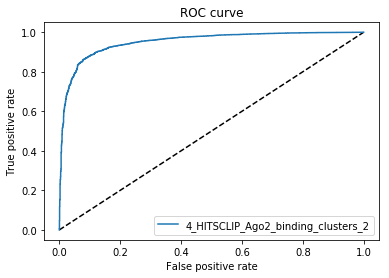

5_CLIPSEQ_AGO2_hg19


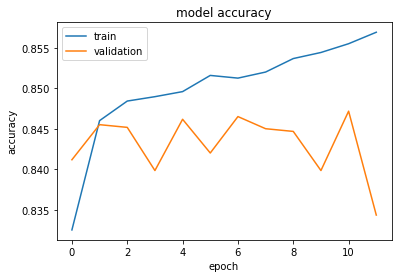

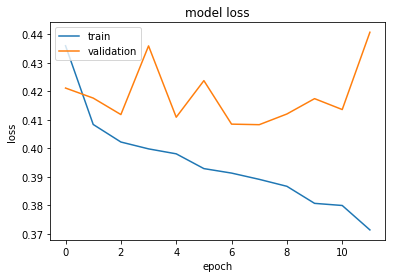

0.7534955624999999


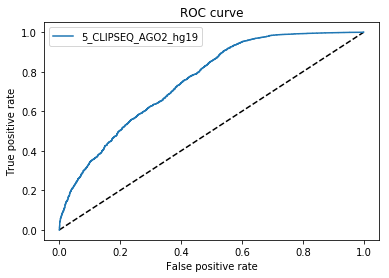

6_CLIP-seq-eIF4AIII_1


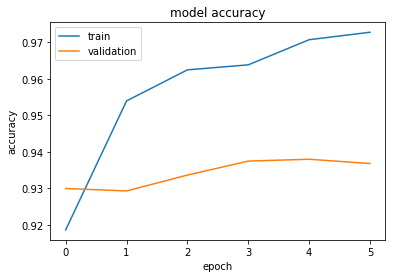

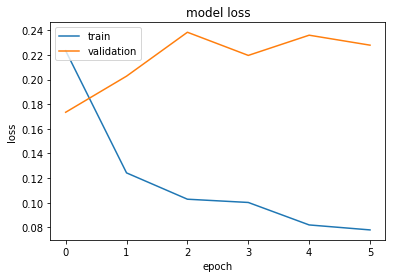

0.9570137812499999


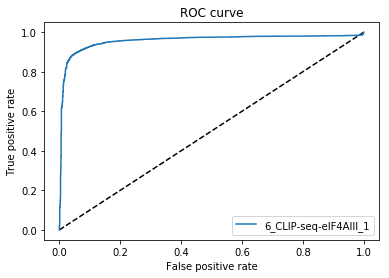

7_CLIP-seq-eIF4AIII_2


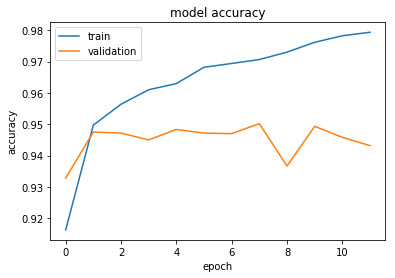

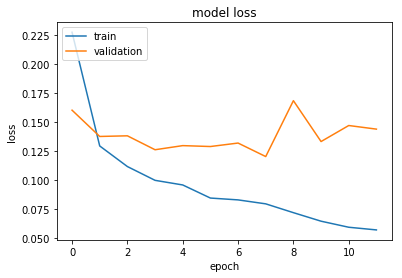

0.9791968125000001


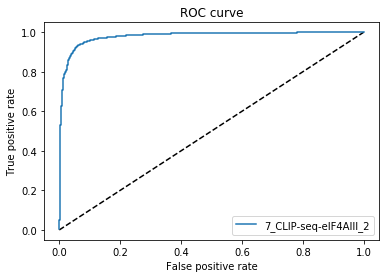

8_PARCLIP_ELAVL1_hg19


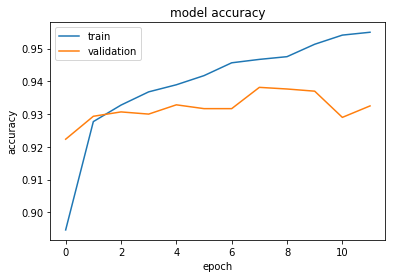

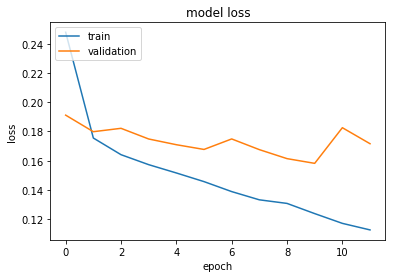

0.974795625


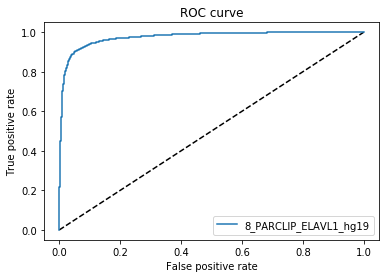

9_PARCLIP_ELAVL1MNASE_hg19


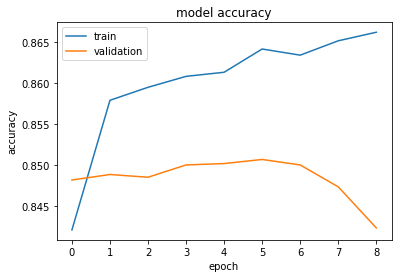

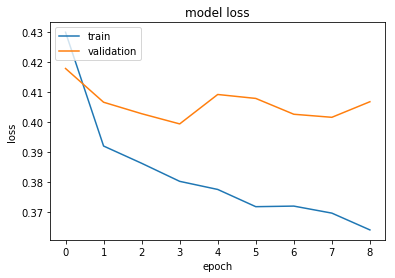

0.7552256562500002


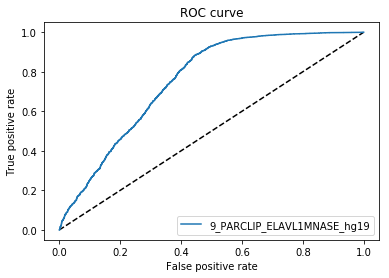

10_PARCLIP_ELAVL1A_hg19


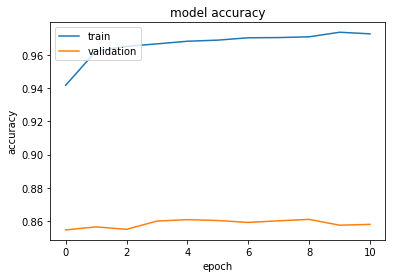

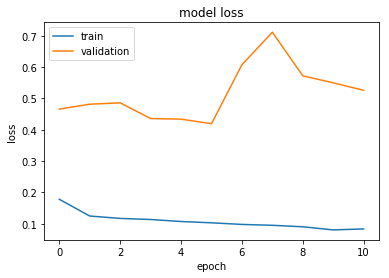

0.9385016562500001


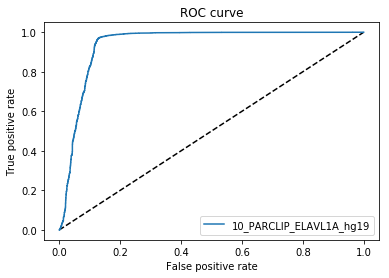

10_PARCLIP_ELAVL1A_hg19


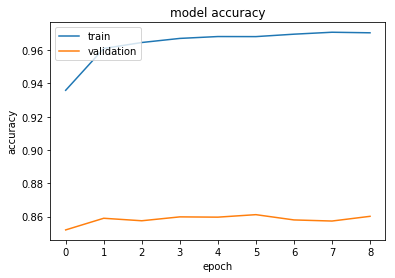

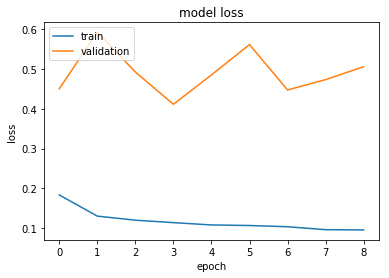

0.9354153125000001


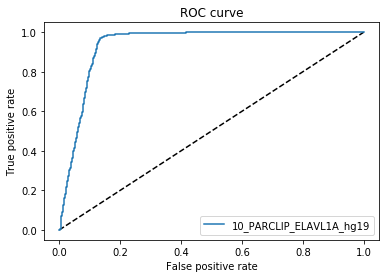

12_PARCLIP_EWSR1_hg19


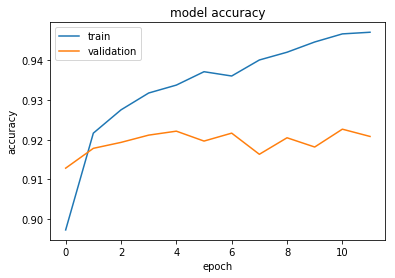

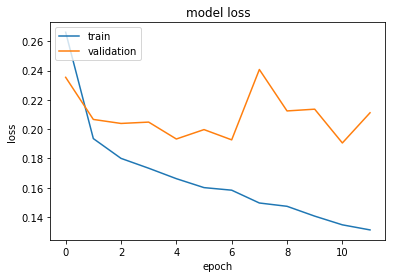

0.95183265625


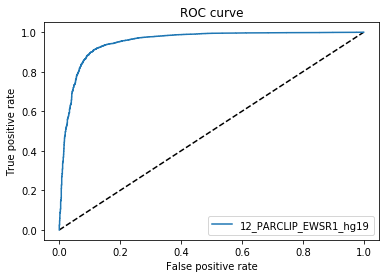

13_PARCLIP_FUS_hg19


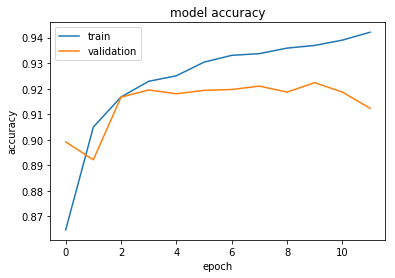

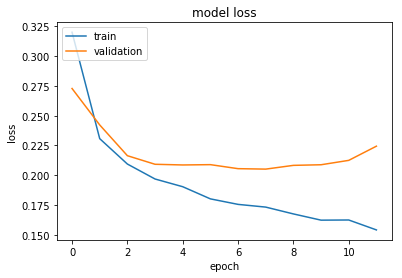

0.946218875


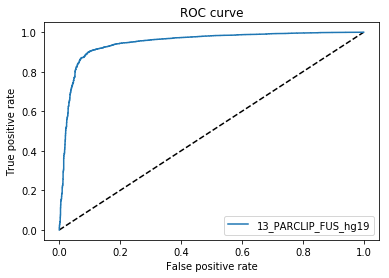

14_PARCLIP_FUS_mut_hg19


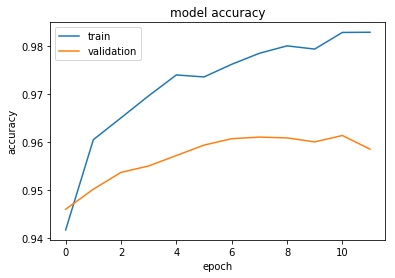

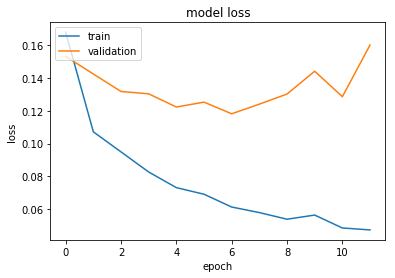

0.9911996875


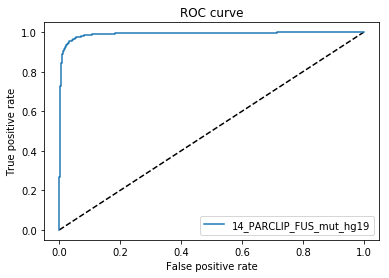

15_PARCLIP_IGF2BP123_hg19


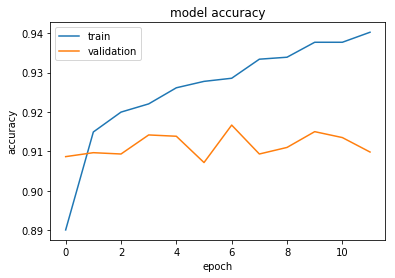

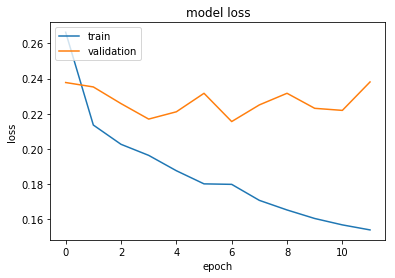

0.9557080625


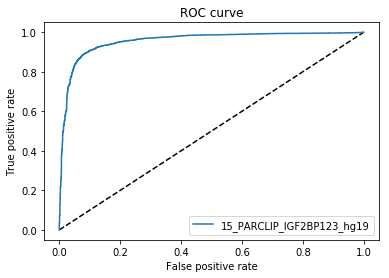

16_ICLIP_hnRNPC_Hela_iCLIP_all_clusters


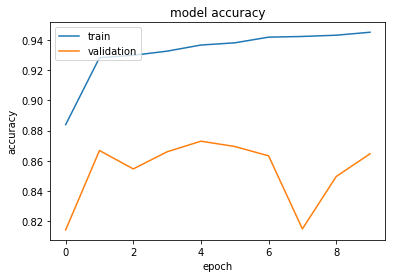

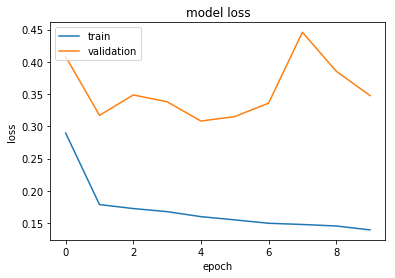

0.9593035000000001


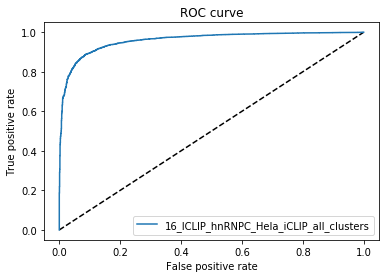

17_ICLIP_HNRNPC_hg19


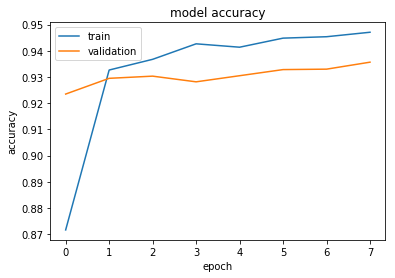

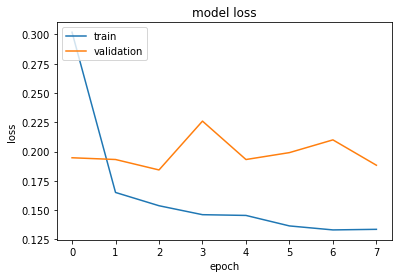

0.9755368125000001


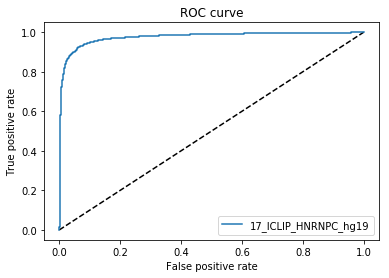

18_ICLIP_hnRNPL_Hela_group_3975_all-hnRNPL-Hela-hg19_sum_G_hg19--ensembl59_from_2337-2339-741_bedGraph-cDNA-hits-in-genome


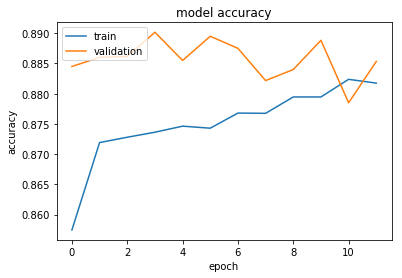

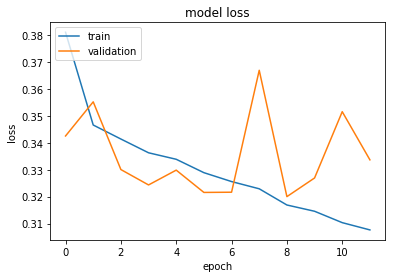

0.8582853749999999


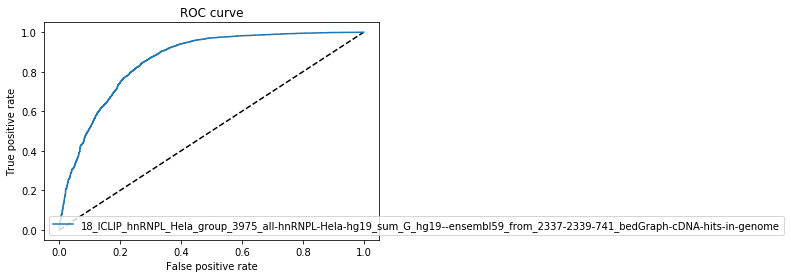

19_ICLIP_hnRNPL_U266_group_3986_all-hnRNPL-U266-hg19_sum_G_hg19--ensembl59_from_2485_bedGraph-cDNA-hits-in-genome


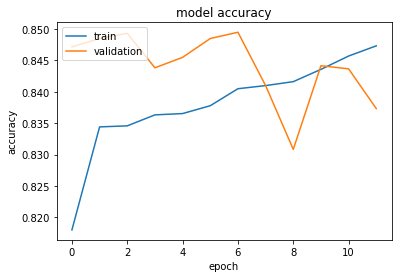

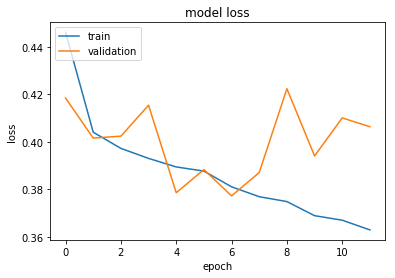

0.7986637187500001


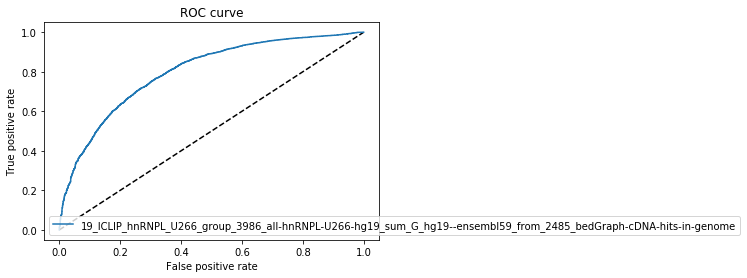

20_ICLIP_hnRNPlike_U266_group_4000_all-hnRNPLlike-U266-hg19_sum_G_hg19--ensembl59_from_2342-2486_bedGraph-cDNA-hits-in-genome


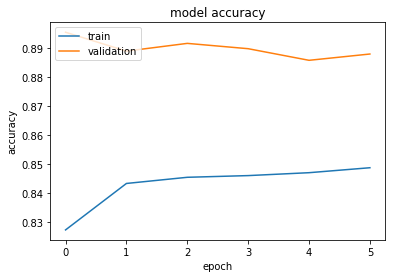

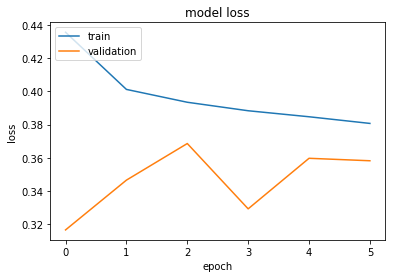

0.792563875


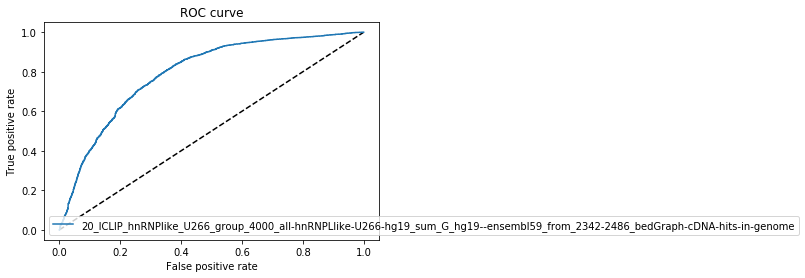

21_PARCLIP_MOV10_Sievers_hg19


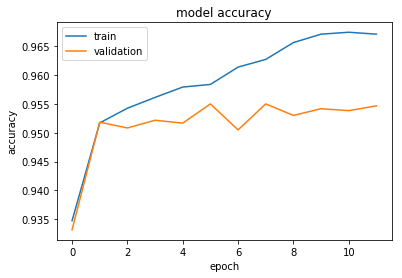

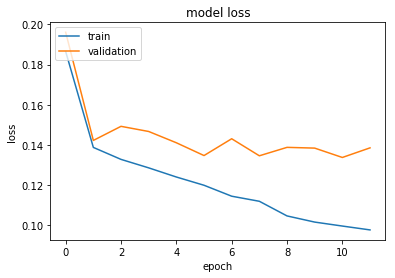

0.97695128125


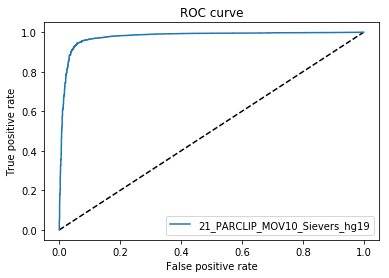

22_ICLIP_NSUN2_293_group_4007_all-NSUN2-293-hg19_sum_G_hg19--ensembl59_from_3137-3202_bedGraph-cDNA-hits-in-genome


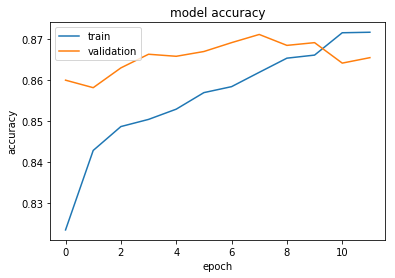

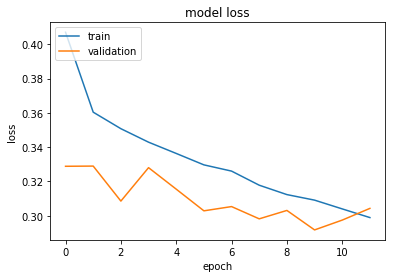

0.8648336249999999


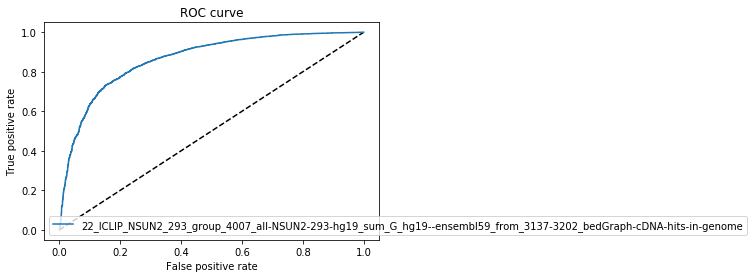

23_PARCLIP_PUM2_hg19


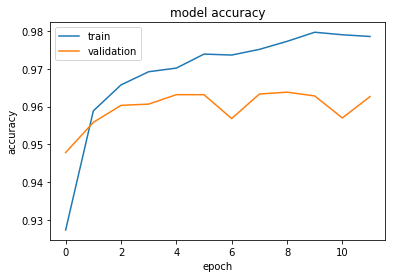

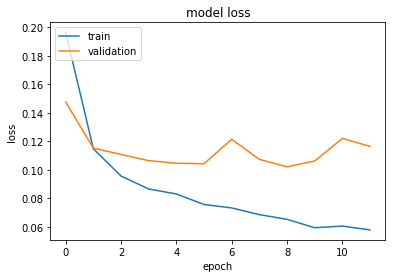

0.988786625


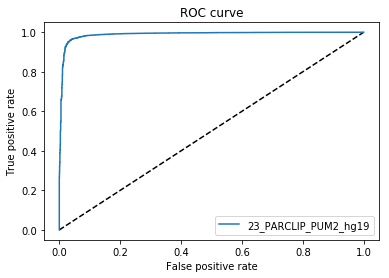

24_PARCLIP_QKI_hg19


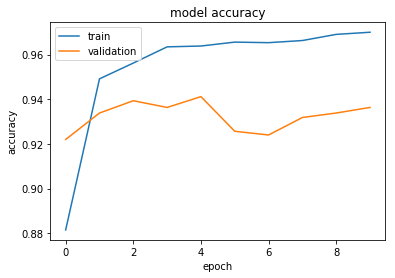

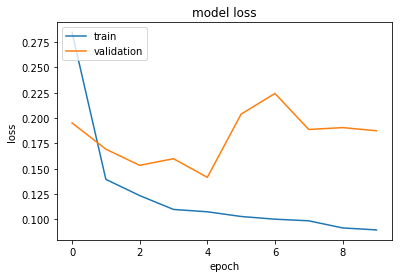

0.97594046875


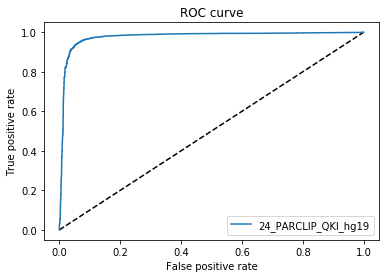

25_CLIPSEQ_SFRS1_hg19


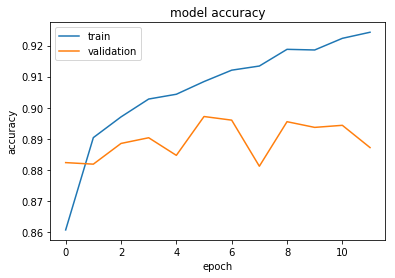

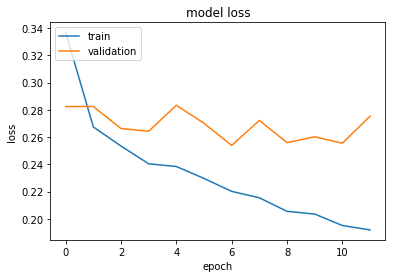

0.935979


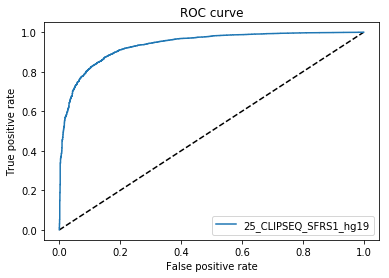

26_PARCLIP_TAF15_hg19


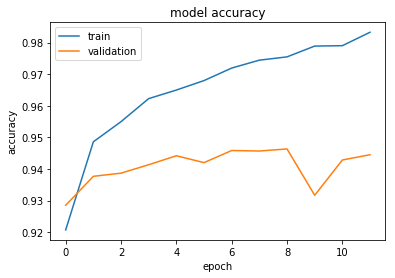

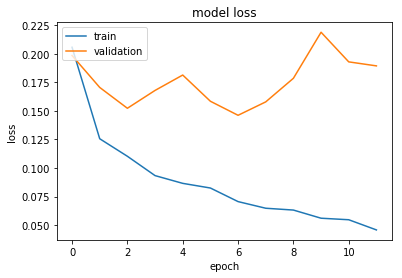

0.9787128125


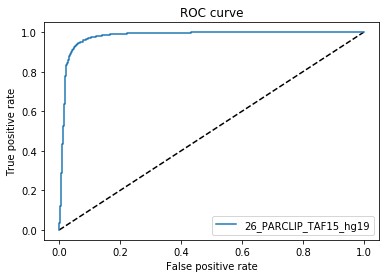

27_ICLIP_TDP43_hg19


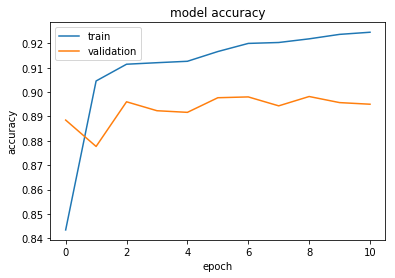

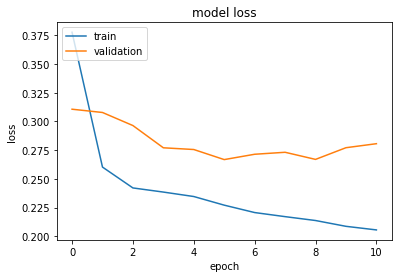

0.9137493750000001


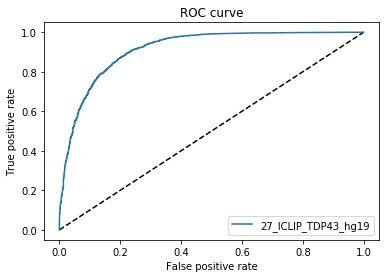

28_ICLIP_TIA1_hg19


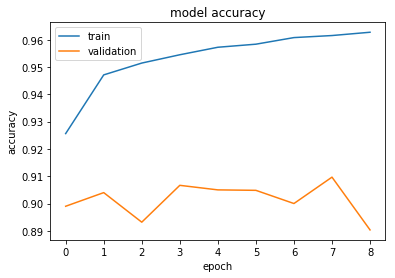

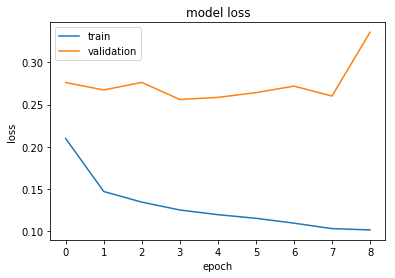

0.978241625


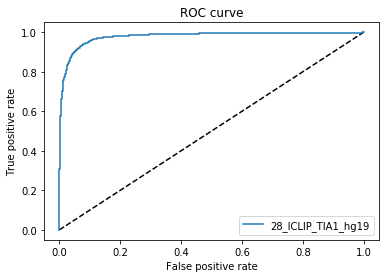

29_ICLIP_TIAL1_hg19


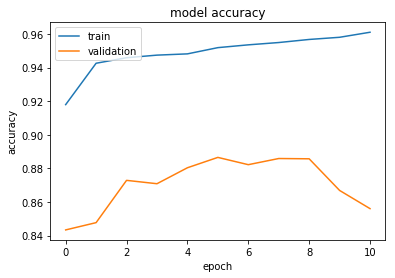

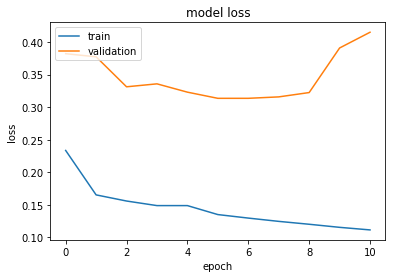

0.95323625


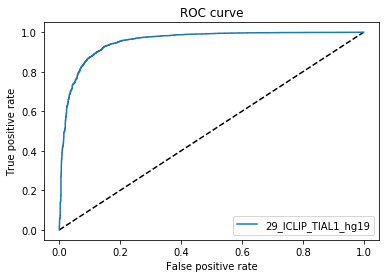

30_ICLIP_U2AF65_Hela_iCLIP_ctrl_all_clusters


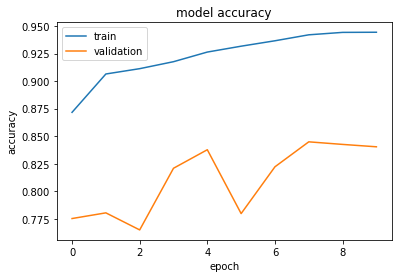

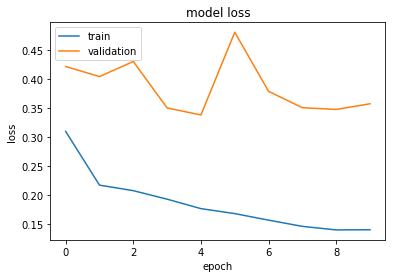

0.95880953125


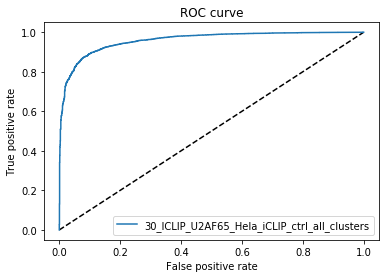

31_ICLIP_U2AF65_Hela_iCLIP_ctrl+kd_all_clusters


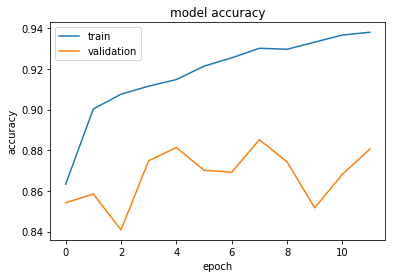

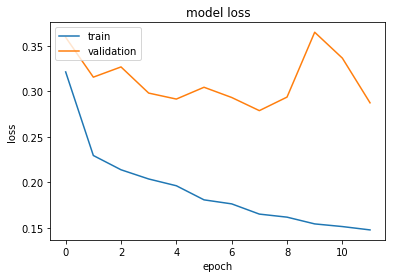

0.9473410625


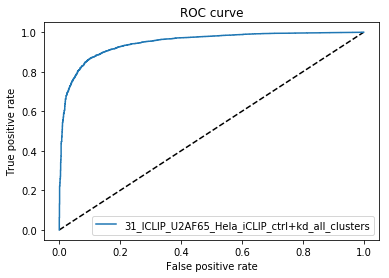

[0.9385295625000001, 0.7697197812500001, 0.9494823124999999, 0.950815125, 0.7534955624999999, 0.9570137812499999, 0.9791968125000001, 0.974795625, 0.7552256562500002, 0.9385016562500001, 0.9354153125000001, 0.95183265625, 0.946218875, 0.9911996875, 0.9557080625, 0.9593035000000001, 0.9755368125000001, 0.8582853749999999, 0.7986637187500001, 0.792563875, 0.97695128125, 0.8648336249999999, 0.988786625, 0.97594046875, 0.935979, 0.9787128125, 0.9137493750000001, 0.978241625, 0.95323625, 0.95880953125, 0.9473410625]


In [19]:
#30k datasets

import numpy as np
from Bio import SeqIO
import gzip
import os
from keras.models import Sequential
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.layers import Dense, Activation, Conv1D, MaxPooling1D, Flatten, GlobalAveragePooling1D, Dropout
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score, roc_curve
import pandas as pd
import matplotlib.pyplot as plt


np.random.seed(454)


def load_data(path):
        
    data = gzip.open(os.path.join(path,"sequences.fa.gz"),"rt")
    return data


def get_seq(protein, t_data):
    
    
    if t_data == "train":
                
        training_data = load_data("datasets/clip/%s/30000/training_sample_1"% protein)
        x_train = np.zeros((30000,101,4))          
    
    elif t_data == "test":    
                
        training_data = load_data("datasets/clip/%s/30000/test_sample_1"% protein)
        x_train = np.zeros((10000,101,4))      
    
    
    
    r = 0    
    
   
    
    for record in SeqIO.parse(training_data,"fasta"):
        sequence = list(record.seq)                
        nucleotide = {'A' : 0, 'T' : 1, 'G' : 2, 'C' : 3, 'N' : 4} 
        num_seq = list() #sekvenca v številskem formatu


        for i in range(0,len(sequence)):
                num_seq.append(nucleotide[sequence[i]])


        X = np.zeros((1,len(num_seq),4))

        
        for i in range (len(num_seq)):
                if num_seq[i] <= 3:
                    X[:,i,num_seq[i]] = 1               

        x_train[r,:,:] = X
        r = r + 1
    
    return x_train


def get_class(protein, t_data):
    y_train = []
    

    if t_data == 'train':
        data = load_data("datasets/clip/%s/30000/training_sample_1"% protein)

    elif t_data == 'test':
        data = load_data("datasets/clip/%s/30000/test_sample_1"% protein)


    for record in SeqIO.parse(data,"fasta"):
        v = int((record.description).split(":")[1])
        y_train.append([int(v == 0), int(v != 0)])

    y_train = np.array(y_train)
    return y_train


def get_cobinding(protein, t_data):
    if t_data == "train":
        with gzip.open(("datasets/clip/%s/30000/training_sample_1/matrix_Cobinding.tab.gz"% protein), "rt") as f:
            cobinding_data = np.loadtxt(f, skiprows=1) 
            
        cobinding = np.zeros((30000,101,cobinding_data.shape[1]/101),dtype=np.int)    
    elif t_data == "test":
        with gzip.open(("datasets/clip/%s/30000/test_sample_1/matrix_Cobinding.tab.gz"% protein), "rt") as f:
            cobinding_data = np.loadtxt(f, skiprows=1) 
        cobinding = np.zeros((10000,101,cobinding_data.shape[1]/101),dtype=np.int)
   
    
    for n in range(0,cobinding_data.shape[1],101):
        a = cobinding_data[:,n:(n+101)]
        cobinding[:,:,(n/101)] = a
    
    return cobinding
    

def get_region (protein, t_data):
    
    if t_data == "train":
        with gzip.open(("datasets/clip/%s/30000/training_sample_1/matrix_RegionType.tab.gz"% protein), "rt") as f:
            region_data = np.loadtxt(f, skiprows=1)
        region = np.zeros((30000,101,region_data.shape[1]/101),dtype=np.int)
                             
    elif t_data == "test":
        with gzip.open(("datasets/clip/%s/30000/test_sample_1/matrix_RegionType.tab.gz"% protein), "rt") as f:
            region_data = np.loadtxt(f, skiprows=1) 
        region = np.zeros((10000,101,region_data.shape[1]/101),dtype=np.int)
    

    for n in range(0,region_data.shape[1],101):
        a = region_data[:,n:(n+101)]
        region[:,:,(n/101)] = a
        
    return region


def get_fold (protein, t_data):
    
    if t_data == "train":
        with gzip.open(("datasets/clip/%s/30000/training_sample_1/matrix_RNAfold.tab.gz"% protein), "rt") as f:
            fold_data = np.loadtxt(f, skiprows=1) 
        fold = np.zeros((30000,101,fold_data.shape[1]/101),dtype=np.int)
                             
    elif t_data == "test":
        with gzip.open(("datasets/clip/%s/30000/test_sample_1/matrix_RNAfold.tab.gz"% protein), "rt") as f:
            fold_data = np.loadtxt(f, skiprows=1) 
        fold = np.zeros((10000,101,fold_data.shape[1]/101),dtype=np.int)




    for n in range(0,fold_data.shape[1],101):
        a = fold_data[:,n:(n+101)]
        fold[:,:,(n/101)] = a
    
    
    return fold



score_list = []
protein_list = ["1_PARCLIP_AGO1234_hg19", "2_PARCLIP_AGO2MNASE_hg19","3_HITSCLIP_Ago2_binding_clusters","4_HITSCLIP_Ago2_binding_clusters_2","5_CLIPSEQ_AGO2_hg19", "6_CLIP-seq-eIF4AIII_1","7_CLIP-seq-eIF4AIII_2","8_PARCLIP_ELAVL1_hg19","9_PARCLIP_ELAVL1MNASE_hg19", "10_PARCLIP_ELAVL1A_hg19", "10_PARCLIP_ELAVL1A_hg19", "12_PARCLIP_EWSR1_hg19", "13_PARCLIP_FUS_hg19", "14_PARCLIP_FUS_mut_hg19", "15_PARCLIP_IGF2BP123_hg19", "16_ICLIP_hnRNPC_Hela_iCLIP_all_clusters", "17_ICLIP_HNRNPC_hg19", "18_ICLIP_hnRNPL_Hela_group_3975_all-hnRNPL-Hela-hg19_sum_G_hg19--ensembl59_from_2337-2339-741_bedGraph-cDNA-hits-in-genome", "19_ICLIP_hnRNPL_U266_group_3986_all-hnRNPL-U266-hg19_sum_G_hg19--ensembl59_from_2485_bedGraph-cDNA-hits-in-genome", "20_ICLIP_hnRNPlike_U266_group_4000_all-hnRNPLlike-U266-hg19_sum_G_hg19--ensembl59_from_2342-2486_bedGraph-cDNA-hits-in-genome", "21_PARCLIP_MOV10_Sievers_hg19", "22_ICLIP_NSUN2_293_group_4007_all-NSUN2-293-hg19_sum_G_hg19--ensembl59_from_3137-3202_bedGraph-cDNA-hits-in-genome", "23_PARCLIP_PUM2_hg19", "24_PARCLIP_QKI_hg19", "25_CLIPSEQ_SFRS1_hg19","26_PARCLIP_TAF15_hg19", "27_ICLIP_TDP43_hg19", "28_ICLIP_TIA1_hg19", "29_ICLIP_TIAL1_hg19", "30_ICLIP_U2AF65_Hela_iCLIP_ctrl_all_clusters", "31_ICLIP_U2AF65_Hela_iCLIP_ctrl+kd_all_clusters"]


for x in range (0,31):

    protein = protein_list[x]
    
    print (protein)
    
    X = np.dstack((get_cobinding(protein,"train"), get_seq(protein,"train"), get_region(protein,"train"), get_fold(protein, "train")))
    y = get_class(protein,"train")
    
    size = X.shape[2]
    
   
    
    score = []
    
    model = Sequential()
    model.add(Conv1D(60,6, data_format='channels_last', input_shape=(101, size) , strides = 1, padding='valid'))
    model.add(MaxPooling1D(pool_size=20, strides=1, padding='valid'))
    model.add(Conv1D(60, 4, activation='relu'))
    model.add(Dropout(0.2))
    model.add(MaxPooling1D(pool_size=40, strides=1, padding='valid'))
    model.add(Conv1D(60, 4, activation='relu'))
    model.add(MaxPooling1D(pool_size=30, strides=1, padding='valid'))
    model.add(Conv1D(60, 3, activation='relu'))
    model.add(GlobalAveragePooling1D())


    model.add(Dense(200, activation='relu'))
    model.add(Dropout(0.1))
    model.add(Dense(2, activation='sigmoid'))

    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    checkpointer = ModelCheckpoint(filepath="models/" + protein + "_weights.hdf5", verbose=0, save_best_only=True)
    earlystopper = EarlyStopping(monitor='val_loss', patience=5, verbose=0)


    X_train = X
    y_train = y

    metrics = model.fit(X_train, y_train, validation_split = 0.2, epochs=12, batch_size=200, verbose=0, callbacks=[earlystopper])

    
    # plot history for accuracy
    plt.plot(metrics.history['acc'])
    plt.plot(metrics.history['val_acc'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()


    # plot loss function history
    plt.plot(metrics.history['loss'])
    plt.plot(metrics.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()
    
    #run predictions
    X_test = np.dstack((get_cobinding(protein,"test"), get_seq(protein,"test"), get_region(protein,"test"), get_fold(protein, "test")))
    y_test = get_class(protein,"test")


    y_scores = model.predict(X_test)
    y_scores = y_scores [:,0:1]
    y_test = y_test [:,0:1]

    score = roc_auc_score(y_test, y_scores)
    print (score)
    score_list.append(score)

    fpr, tpr, thresholds = roc_curve(y_test, y_scores)

    #ROC plot
    plt.figure(1)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.plot(fpr, tpr, label=protein.format(score))
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('ROC curve')
    plt.legend(loc='best')
    plt.show()

print(score_list)

1_PARCLIP_AGO1234_hg19


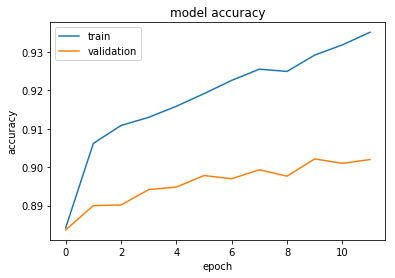

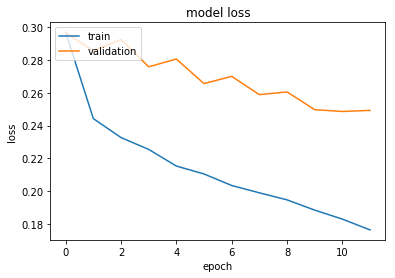

0.9492419062499999


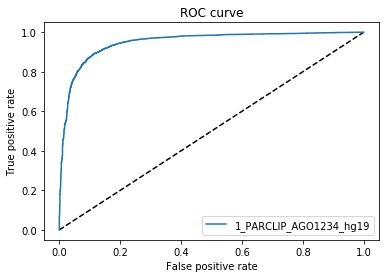

2_PARCLIP_AGO2MNASE_hg19


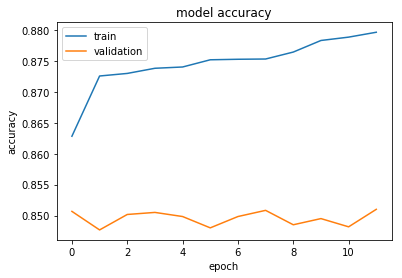

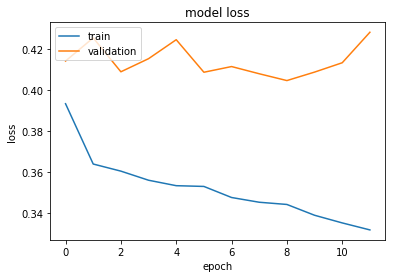

0.7422746874999999


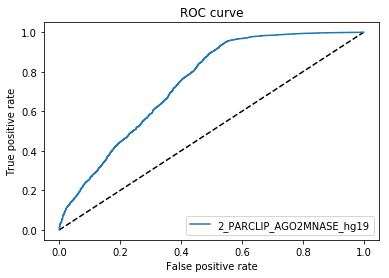

3_HITSCLIP_Ago2_binding_clusters


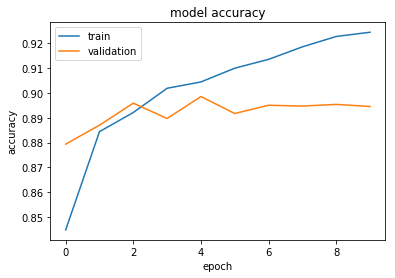

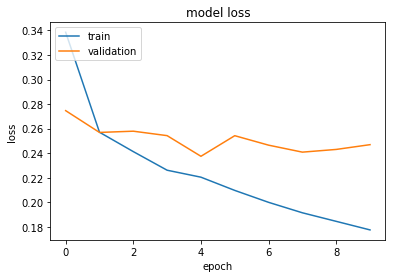

0.9442283124999999


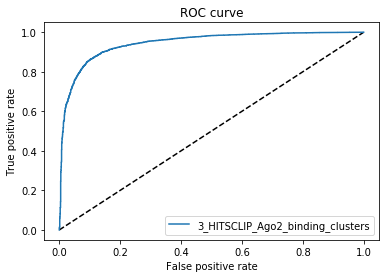

4_HITSCLIP_Ago2_binding_clusters_2


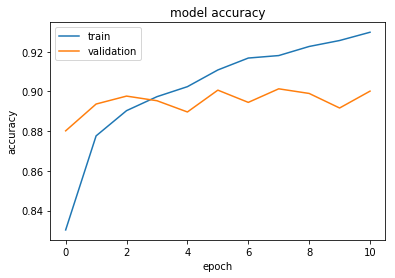

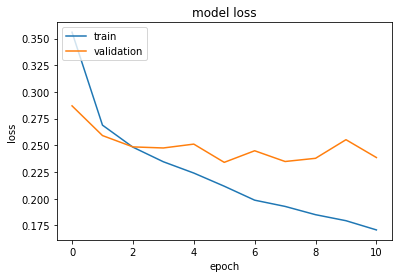

0.9485853750000001


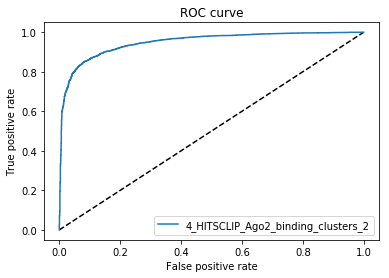

5_CLIPSEQ_AGO2_hg19


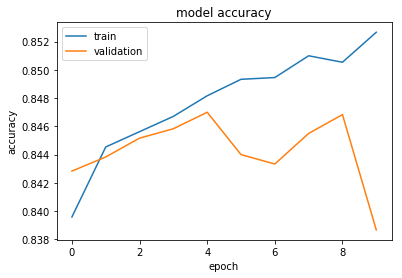

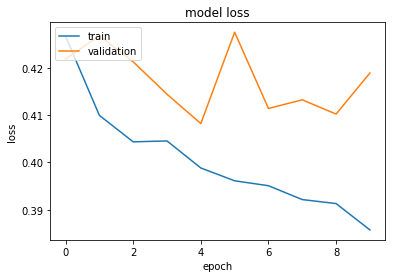

0.756226


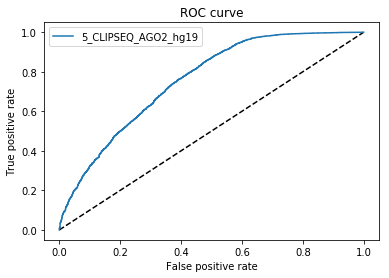

6_CLIP-seq-eIF4AIII_1


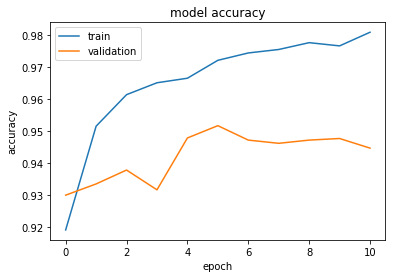

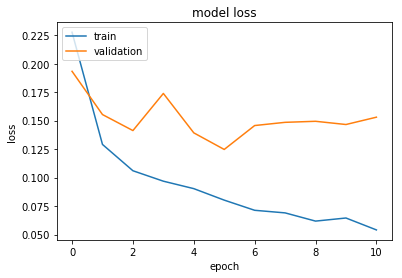

0.9652523125000001


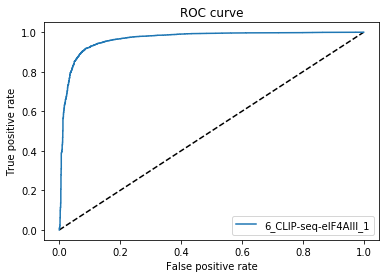

7_CLIP-seq-eIF4AIII_2


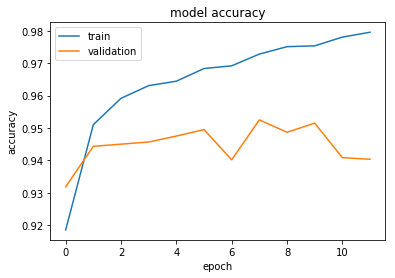

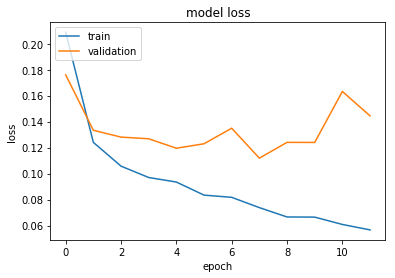

0.97694690625


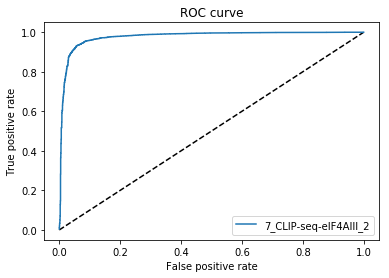

8_PARCLIP_ELAVL1_hg19


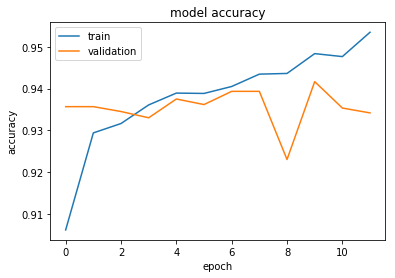

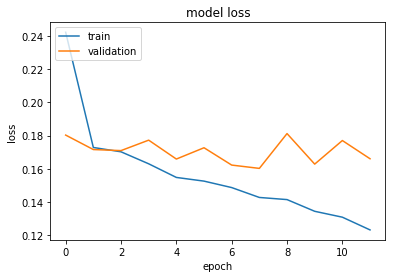

0.9715555


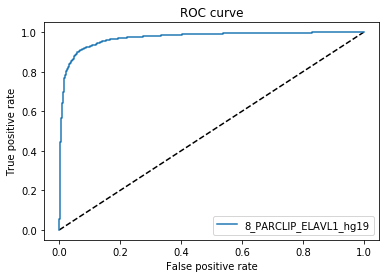

9_PARCLIP_ELAVL1MNASE_hg19


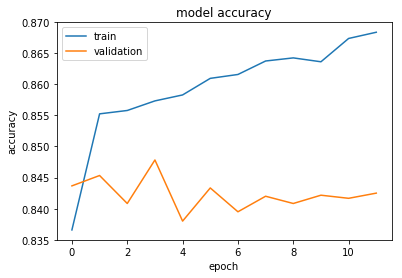

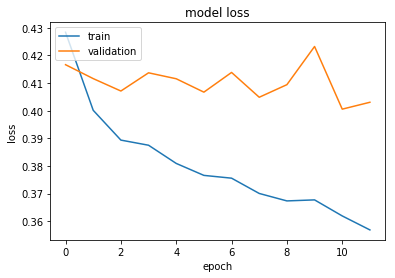

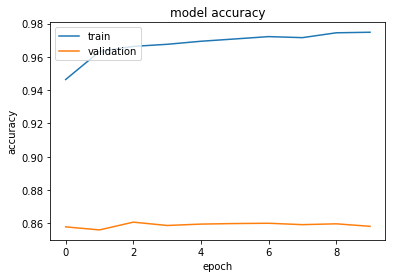

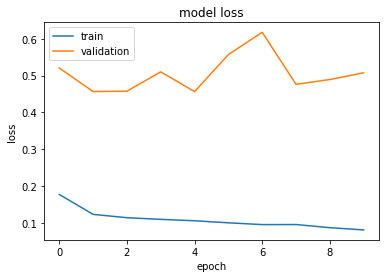

0.92127440625


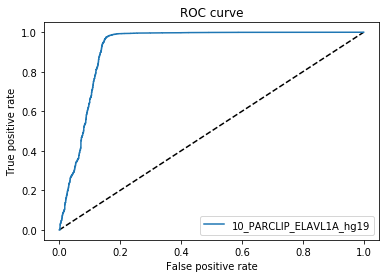

10_PARCLIP_ELAVL1A_hg19


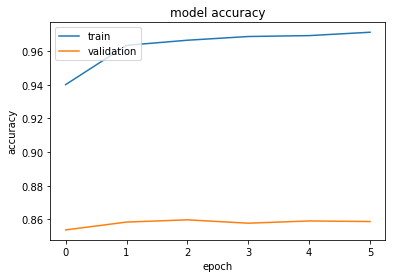

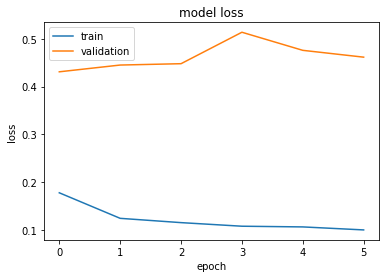

0.94769009375


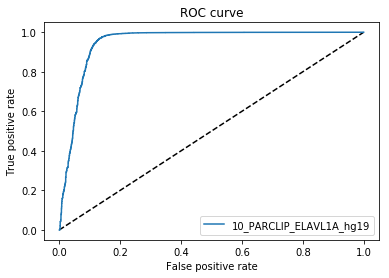

12_PARCLIP_EWSR1_hg19


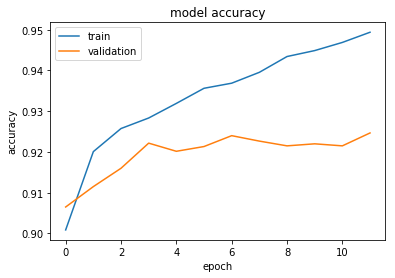

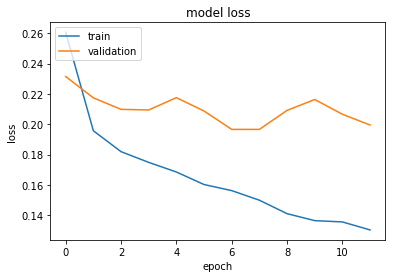

0.9597359999999998


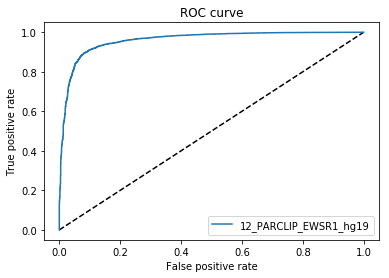

13_PARCLIP_FUS_hg19


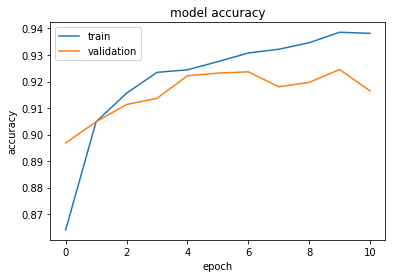

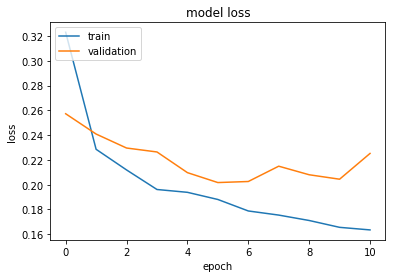

0.9527666875


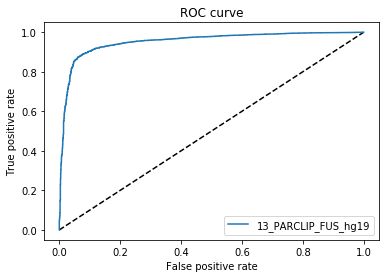

14_PARCLIP_FUS_mut_hg19


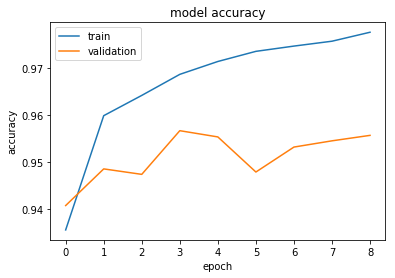

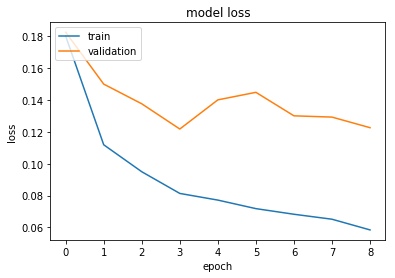

0.9877840625000001


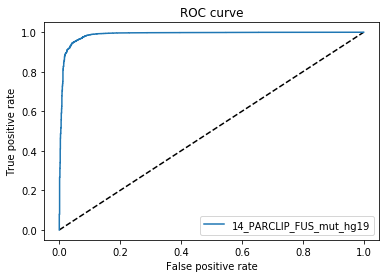

15_PARCLIP_IGF2BP123_hg19


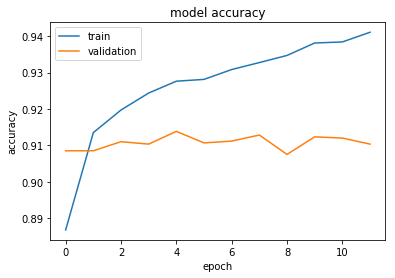

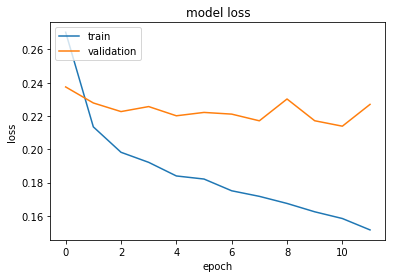

0.95790978125


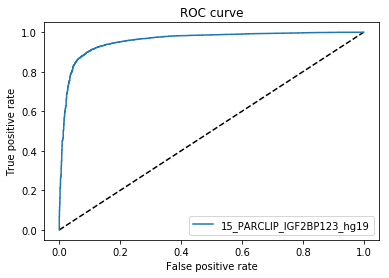

16_ICLIP_hnRNPC_Hela_iCLIP_all_clusters


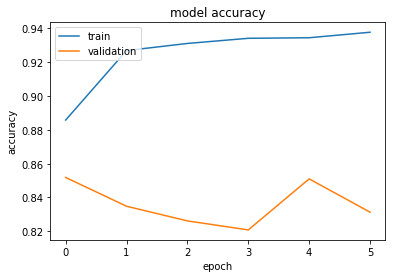

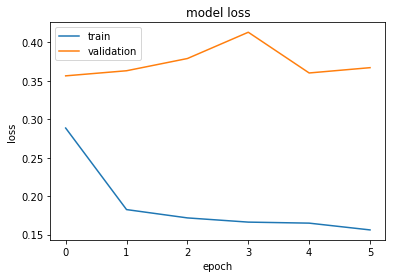

0.9600426874999999


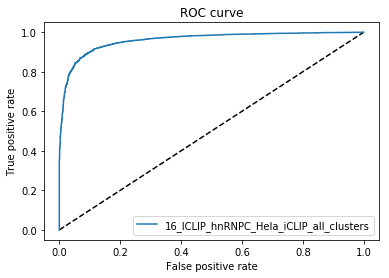

17_ICLIP_HNRNPC_hg19


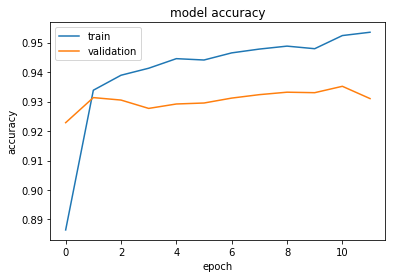

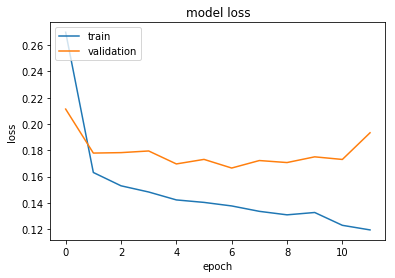

0.9695525937499998


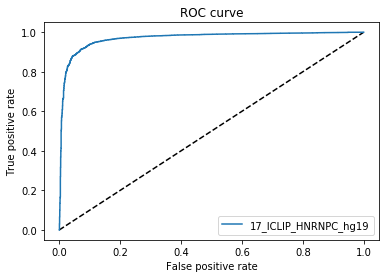

18_ICLIP_hnRNPL_Hela_group_3975_all-hnRNPL-Hela-hg19_sum_G_hg19--ensembl59_from_2337-2339-741_bedGraph-cDNA-hits-in-genome


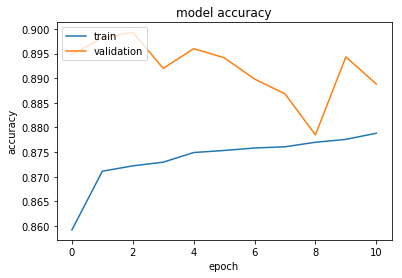

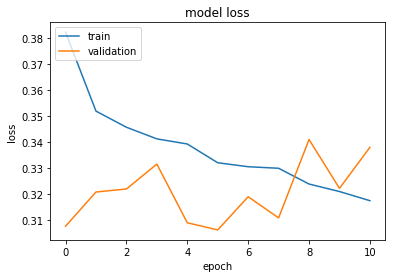

0.85250125


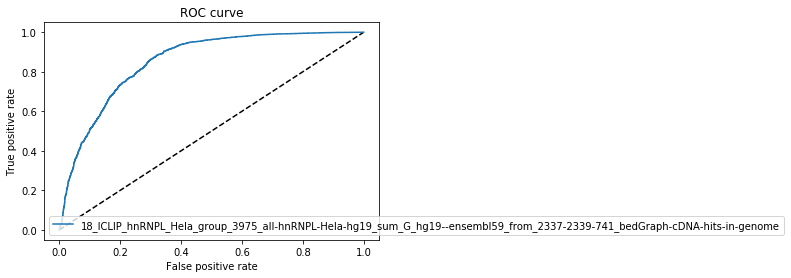

19_ICLIP_hnRNPL_U266_group_3986_all-hnRNPL-U266-hg19_sum_G_hg19--ensembl59_from_2485_bedGraph-cDNA-hits-in-genome


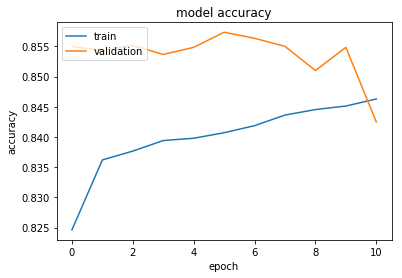

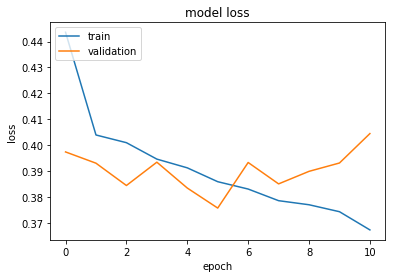

0.7974640625


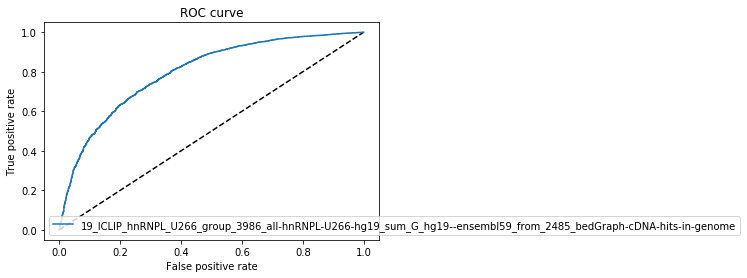

20_ICLIP_hnRNPlike_U266_group_4000_all-hnRNPLlike-U266-hg19_sum_G_hg19--ensembl59_from_2342-2486_bedGraph-cDNA-hits-in-genome


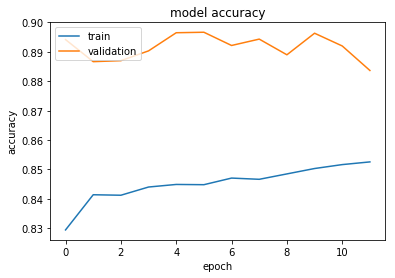

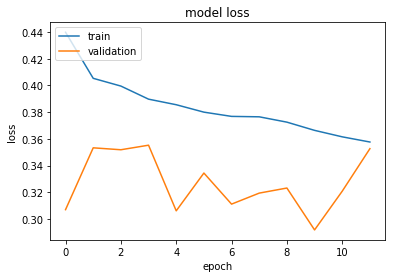

0.8109083125


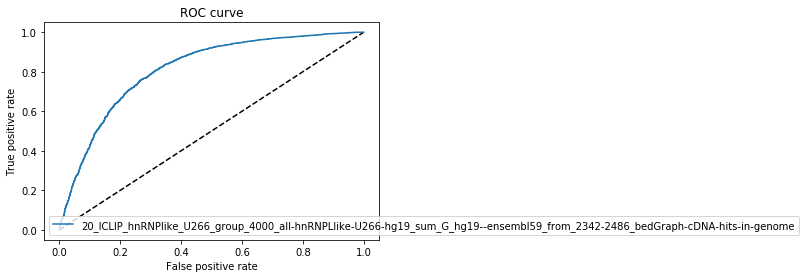

21_PARCLIP_MOV10_Sievers_hg19


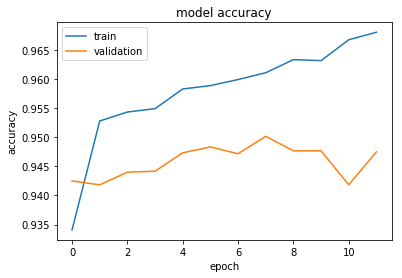

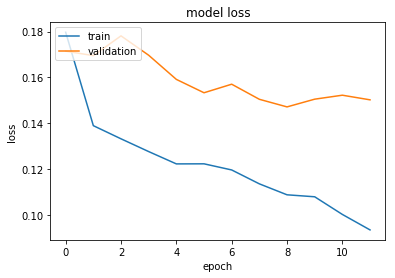

0.977119


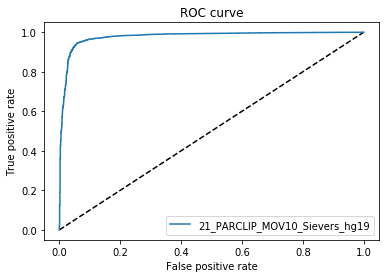

22_ICLIP_NSUN2_293_group_4007_all-NSUN2-293-hg19_sum_G_hg19--ensembl59_from_3137-3202_bedGraph-cDNA-hits-in-genome


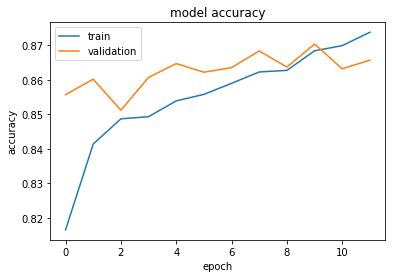

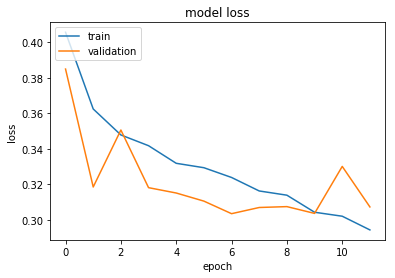

0.8695658749999999


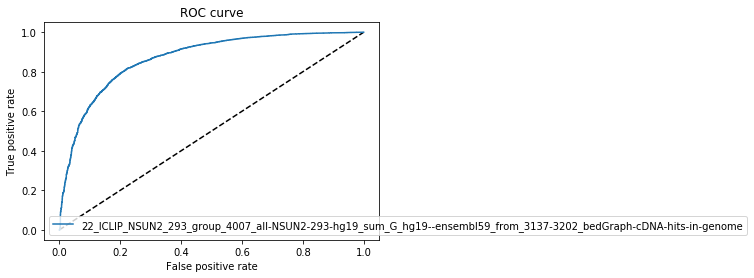

23_PARCLIP_PUM2_hg19


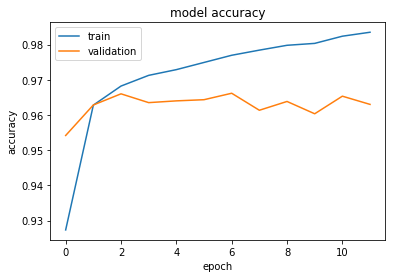

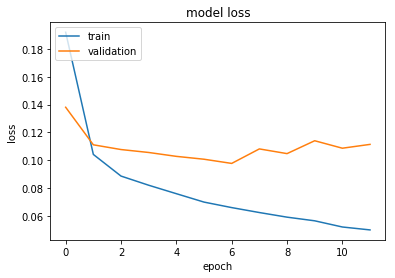

0.9868744375


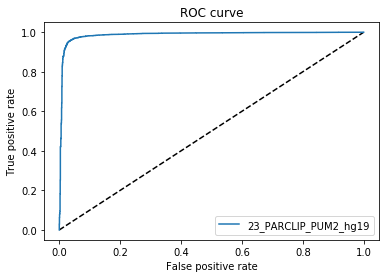

24_PARCLIP_QKI_hg19


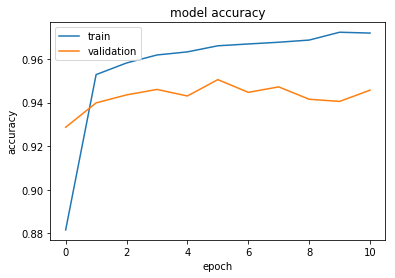

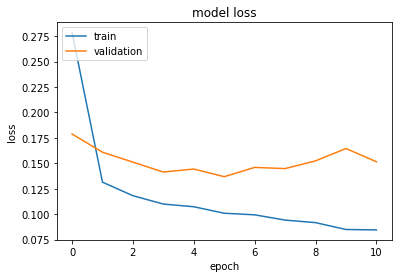

0.97669565625


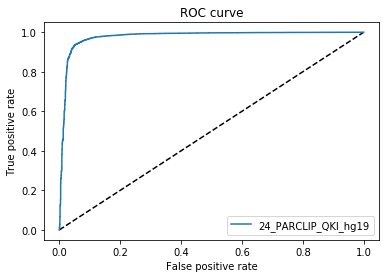

25_CLIPSEQ_SFRS1_hg19


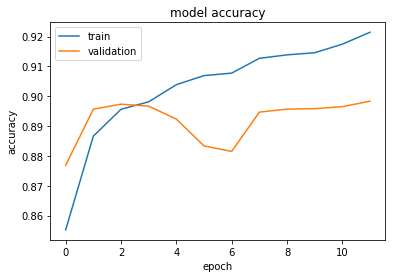

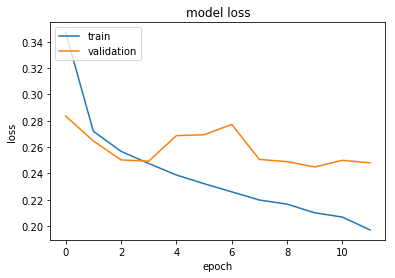

0.93063046875


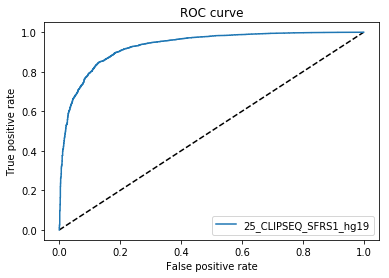

26_PARCLIP_TAF15_hg19


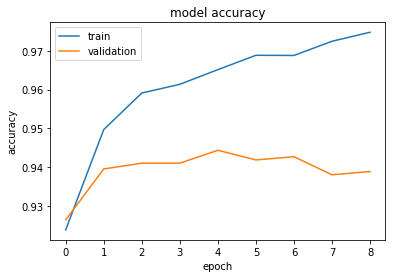

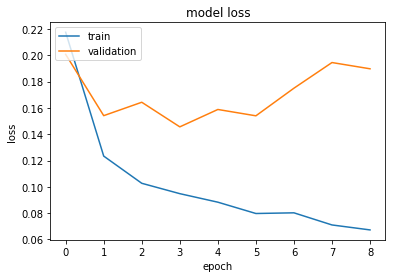

0.9831868749999999


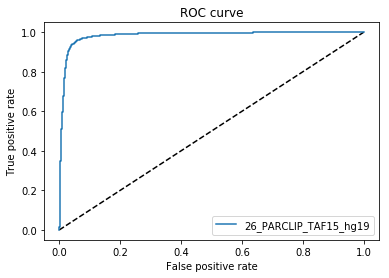

27_ICLIP_TDP43_hg19


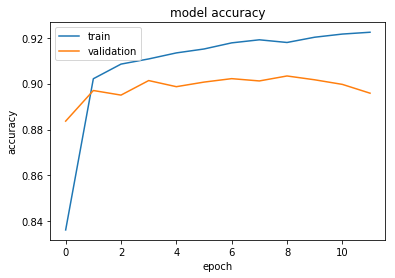

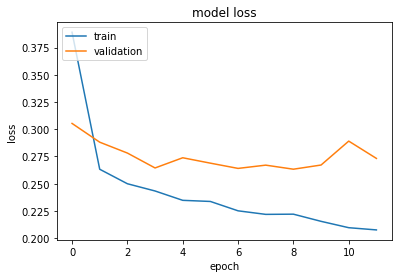

0.9199612812500001


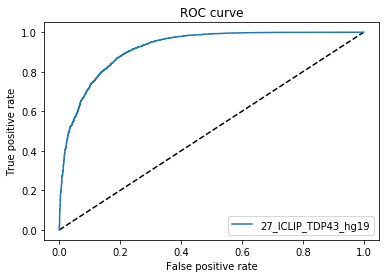

28_ICLIP_TIA1_hg19


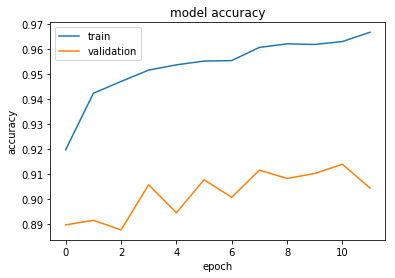

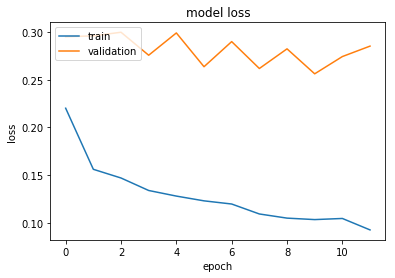

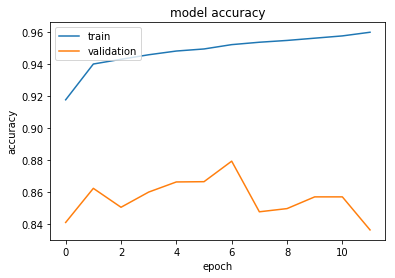

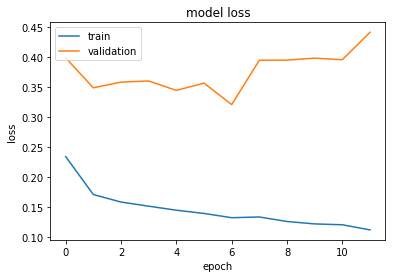

0.9435243125000001


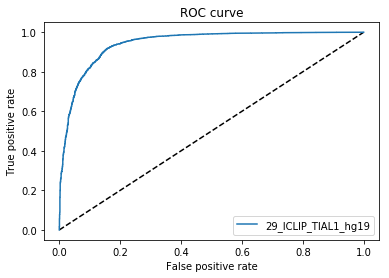

30_ICLIP_U2AF65_Hela_iCLIP_ctrl_all_clusters


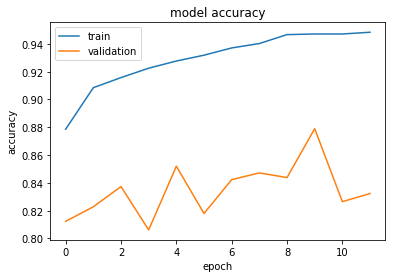

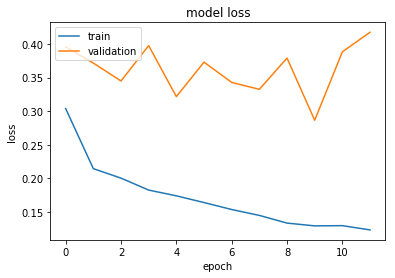

0.9581755


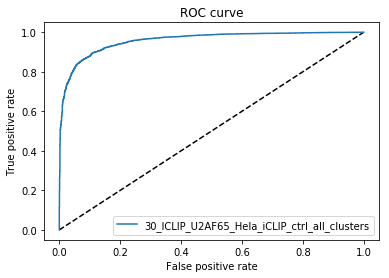

31_ICLIP_U2AF65_Hela_iCLIP_ctrl+kd_all_clusters


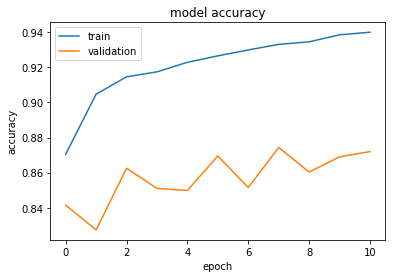

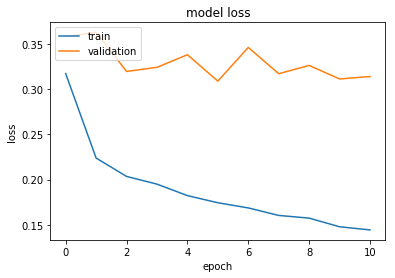

0.94835740625


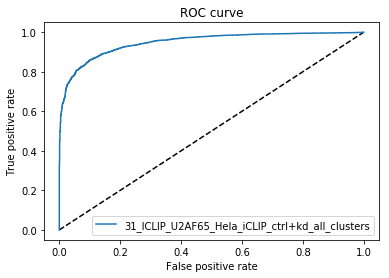

[0.9492419062499999, 0.7422746874999999, 0.9442283124999999, 0.9485853750000001, 0.756226, 0.9652523125000001, 0.97694690625, 0.9715555, 0.76405259375, 0.92127440625, 0.94769009375, 0.9597359999999998, 0.9527666875, 0.9877840625000001, 0.95790978125, 0.9600426874999999, 0.9695525937499998, 0.85250125, 0.7974640625, 0.8109083125, 0.977119, 0.8695658749999999, 0.9868744375, 0.97669565625, 0.93063046875, 0.9831868749999999, 0.9199612812500001, 0.97646975, 0.9435243125000001, 0.9581755, 0.94835740625]


In [20]:
#30k datasets

import numpy as np
from Bio import SeqIO
import gzip
import os
from keras.models import Sequential
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.layers import Dense, Activation, Conv1D, MaxPooling1D, Flatten, GlobalAveragePooling1D, Dropout
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score, roc_curve
import pandas as pd
import matplotlib.pyplot as plt


np.random.seed(454)


def load_data(path):
        
    data = gzip.open(os.path.join(path,"sequences.fa.gz"),"rt")
    return data


def get_seq(protein, t_data):
    
    
    if t_data == "train":
                
        training_data = load_data("datasets/clip/%s/30000/training_sample_2"% protein)
        x_train = np.zeros((30000,101,4))          
    
    elif t_data == "test":    
                
        training_data = load_data("datasets/clip/%s/30000/test_sample_2"% protein)
        x_train = np.zeros((10000,101,4))      
    
    
    
    r = 0    
    
   
    
    for record in SeqIO.parse(training_data,"fasta"):
        sequence = list(record.seq)                
        nucleotide = {'A' : 0, 'T' : 1, 'G' : 2, 'C' : 3, 'N' : 4} 
        num_seq = list() #sekvenca v številskem formatu


        for i in range(0,len(sequence)):
                num_seq.append(nucleotide[sequence[i]])


        X = np.zeros((1,len(num_seq),4))

        
        for i in range (len(num_seq)):
                if num_seq[i] <= 3:
                    X[:,i,num_seq[i]] = 1               

        x_train[r,:,:] = X
        r = r + 1
    
    return x_train


def get_class(protein, t_data):
    y_train = []
    

    if t_data == 'train':
        data = load_data("datasets/clip/%s/30000/training_sample_2"% protein)

    elif t_data == 'test':
        data = load_data("datasets/clip/%s/30000/test_sample_2"% protein)


    for record in SeqIO.parse(data,"fasta"):
        v = int((record.description).split(":")[1])
        y_train.append([int(v == 0), int(v != 0)])

    y_train = np.array(y_train)
    return y_train


def get_cobinding(protein, t_data):
    if t_data == "train":
        with gzip.open(("datasets/clip/%s/30000/training_sample_2/matrix_Cobinding.tab.gz"% protein), "rt") as f:
            cobinding_data = np.loadtxt(f, skiprows=1) 
            
        cobinding = np.zeros((30000,101,cobinding_data.shape[1]/101),dtype=np.int)    
    elif t_data == "test":
        with gzip.open(("datasets/clip/%s/30000/test_sample_2/matrix_Cobinding.tab.gz"% protein), "rt") as f:
            cobinding_data = np.loadtxt(f, skiprows=1) 
        cobinding = np.zeros((10000,101,cobinding_data.shape[1]/101),dtype=np.int)
   
    
    for n in range(0,cobinding_data.shape[1],101):
        a = cobinding_data[:,n:(n+101)]
        cobinding[:,:,(n/101)] = a
    
    return cobinding
    

def get_region (protein, t_data):
    
    if t_data == "train":
        with gzip.open(("datasets/clip/%s/30000/training_sample_2/matrix_RegionType.tab.gz"% protein), "rt") as f:
            region_data = np.loadtxt(f, skiprows=1)
        region = np.zeros((30000,101,region_data.shape[1]/101),dtype=np.int)
                             
    elif t_data == "test":
        with gzip.open(("datasets/clip/%s/30000/test_sample_2/matrix_RegionType.tab.gz"% protein), "rt") as f:
            region_data = np.loadtxt(f, skiprows=1) 
        region = np.zeros((10000,101,region_data.shape[1]/101),dtype=np.int)
    

    for n in range(0,region_data.shape[1],101):
        a = region_data[:,n:(n+101)]
        region[:,:,(n/101)] = a
        
    return region


def get_fold (protein, t_data):
    
    if t_data == "train":
        with gzip.open(("datasets/clip/%s/30000/training_sample_2/matrix_RNAfold.tab.gz"% protein), "rt") as f:
            fold_data = np.loadtxt(f, skiprows=1) 
        fold = np.zeros((30000,101,fold_data.shape[1]/101),dtype=np.int)
                             
    elif t_data == "test":
        with gzip.open(("datasets/clip/%s/30000/test_sample_2/matrix_RNAfold.tab.gz"% protein), "rt") as f:
            fold_data = np.loadtxt(f, skiprows=1) 
        fold = np.zeros((10000,101,fold_data.shape[1]/101),dtype=np.int)




    for n in range(0,fold_data.shape[1],101):
        a = fold_data[:,n:(n+101)]
        fold[:,:,(n/101)] = a
    
    
    return fold



score_list = []
protein_list = ["1_PARCLIP_AGO1234_hg19", "2_PARCLIP_AGO2MNASE_hg19","3_HITSCLIP_Ago2_binding_clusters","4_HITSCLIP_Ago2_binding_clusters_2","5_CLIPSEQ_AGO2_hg19", "6_CLIP-seq-eIF4AIII_1","7_CLIP-seq-eIF4AIII_2","8_PARCLIP_ELAVL1_hg19","9_PARCLIP_ELAVL1MNASE_hg19", "10_PARCLIP_ELAVL1A_hg19", "10_PARCLIP_ELAVL1A_hg19", "12_PARCLIP_EWSR1_hg19", "13_PARCLIP_FUS_hg19", "14_PARCLIP_FUS_mut_hg19", "15_PARCLIP_IGF2BP123_hg19", "16_ICLIP_hnRNPC_Hela_iCLIP_all_clusters", "17_ICLIP_HNRNPC_hg19", "18_ICLIP_hnRNPL_Hela_group_3975_all-hnRNPL-Hela-hg19_sum_G_hg19--ensembl59_from_2337-2339-741_bedGraph-cDNA-hits-in-genome", "19_ICLIP_hnRNPL_U266_group_3986_all-hnRNPL-U266-hg19_sum_G_hg19--ensembl59_from_2485_bedGraph-cDNA-hits-in-genome", "20_ICLIP_hnRNPlike_U266_group_4000_all-hnRNPLlike-U266-hg19_sum_G_hg19--ensembl59_from_2342-2486_bedGraph-cDNA-hits-in-genome", "21_PARCLIP_MOV10_Sievers_hg19", "22_ICLIP_NSUN2_293_group_4007_all-NSUN2-293-hg19_sum_G_hg19--ensembl59_from_3137-3202_bedGraph-cDNA-hits-in-genome", "23_PARCLIP_PUM2_hg19", "24_PARCLIP_QKI_hg19", "25_CLIPSEQ_SFRS1_hg19","26_PARCLIP_TAF15_hg19", "27_ICLIP_TDP43_hg19", "28_ICLIP_TIA1_hg19", "29_ICLIP_TIAL1_hg19", "30_ICLIP_U2AF65_Hela_iCLIP_ctrl_all_clusters", "31_ICLIP_U2AF65_Hela_iCLIP_ctrl+kd_all_clusters"]


for x in range (0,31):

    protein = protein_list[x]
    
    print (protein)
    
    X = np.dstack((get_cobinding(protein,"train"), get_seq(protein,"train"), get_region(protein,"train"), get_fold(protein, "train")))
    y = get_class(protein,"train")
    
    size = X.shape[2]
    
   
    
    score = []
    
    model = Sequential()
    model.add(Conv1D(60,6, data_format='channels_last', input_shape=(101, size) , strides = 1, padding='valid'))
    model.add(MaxPooling1D(pool_size=20, strides=1, padding='valid'))
    model.add(Conv1D(60, 4, activation='relu'))
    model.add(Dropout(0.2))
    model.add(MaxPooling1D(pool_size=40, strides=1, padding='valid'))
    model.add(Conv1D(60, 4, activation='relu'))
    model.add(MaxPooling1D(pool_size=30, strides=1, padding='valid'))
    model.add(Conv1D(60, 3, activation='relu'))
    model.add(GlobalAveragePooling1D())


    model.add(Dense(200, activation='relu'))
    model.add(Dropout(0.1))
    model.add(Dense(2, activation='sigmoid'))

    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    checkpointer = ModelCheckpoint(filepath="models/" + protein + "_weights.hdf5", verbose=0, save_best_only=True)
    earlystopper = EarlyStopping(monitor='val_loss', patience=5, verbose=0)


    X_train = X
    y_train = y

    metrics = model.fit(X_train, y_train, validation_split = 0.2, epochs=12, batch_size=200, verbose=0, callbacks=[earlystopper])

    
    # plot history for accuracy
    plt.plot(metrics.history['acc'])
    plt.plot(metrics.history['val_acc'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()


    # plot loss function history
    plt.plot(metrics.history['loss'])
    plt.plot(metrics.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()
    
    #run predictions
    X_test = np.dstack((get_cobinding(protein,"test"), get_seq(protein,"test"), get_region(protein,"test"), get_fold(protein, "test")))
    y_test = get_class(protein,"test")


    y_scores = model.predict(X_test)
    y_scores = y_scores [:,0:1]
    y_test = y_test [:,0:1]

    score = roc_auc_score(y_test, y_scores)
    print (score)
    score_list.append(score)

    fpr, tpr, thresholds = roc_curve(y_test, y_scores)

    #ROC plot
    plt.figure(1)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.plot(fpr, tpr, label=protein.format(score))
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('ROC curve')
    plt.legend(loc='best')
    plt.show()

print(score_list)

In [21]:
score_list0 = [0.93355259375, 0.76494834375, 0.9452638750000001, 0.94973265625, 0.77152384375, 0.9582632812499999, 0.9752335625000002, 0.9687438125000001, 0.76417015625, 0.92554928125, 0.9481649062499999, 0.96474009375, 0.95151325, 0.99254175, 0.9606924375, 0.96043278125, 0.9714602812500001, 0.8549026562500001, 0.793634, 0.80276684375, 0.9771661249999999, 0.8770343125, 0.9900286875000002, 0.9802337500000001, 0.927933625, 0.98297865625, 0.9195029374999999, 0.9773015624999999, 0.95274246875, 0.9594788750000001, 0.9473421875]
score_list1 = [0.9385295625000001, 0.7697197812500001, 0.9494823124999999, 0.950815125, 0.7534955624999999, 0.9570137812499999, 0.9791968125000001, 0.974795625, 0.7552256562500002, 0.9385016562500001, 0.9354153125000001, 0.95183265625, 0.946218875, 0.9911996875, 0.9557080625, 0.9593035000000001, 0.9755368125000001, 0.8582853749999999, 0.7986637187500001, 0.792563875, 0.97695128125, 0.8648336249999999, 0.988786625, 0.97594046875, 0.935979, 0.9787128125, 0.9137493750000001, 0.978241625, 0.95323625, 0.95880953125, 0.9473410625]
score_list2 = [0.9492419062499999, 0.7422746874999999, 0.9442283124999999, 0.9485853750000001, 0.756226, 0.9652523125000001, 0.97694690625, 0.9715555, 0.76405259375, 0.92127440625, 0.94769009375, 0.9597359999999998, 0.9527666875, 0.9877840625000001, 0.95790978125, 0.9600426874999999, 0.9695525937499998, 0.85250125, 0.7974640625, 0.8109083125, 0.977119, 0.8695658749999999, 0.9868744375, 0.97669565625, 0.93063046875, 0.9831868749999999, 0.9199612812500001, 0.97646975, 0.9435243125000001, 0.9581755, 0.94835740625]

np.round(np.add(score_list0,(np.add(score_list1, score_list2)))/3, decimals = 2)

array([0.94, 0.76, 0.95, 0.95, 0.76, 0.96, 0.98, 0.97, 0.76, 0.93, 0.94,
       0.96, 0.95, 0.99, 0.96, 0.96, 0.97, 0.86, 0.8 , 0.8 , 0.98, 0.87,
       0.99, 0.98, 0.93, 0.98, 0.92, 0.98, 0.95, 0.96, 0.95])

1_PARCLIP_AGO1234_hg19


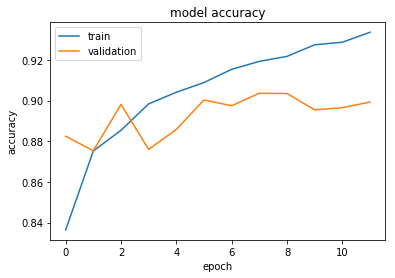

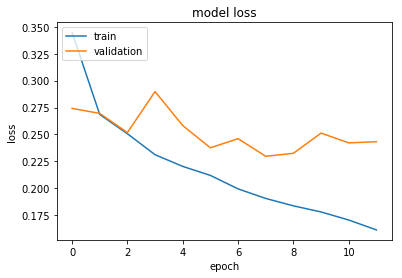

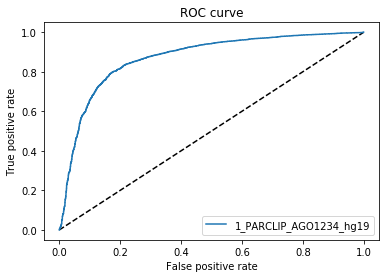

0.8703298125
2_PARCLIP_AGO2MNASE_hg19


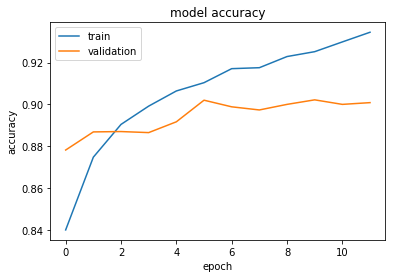

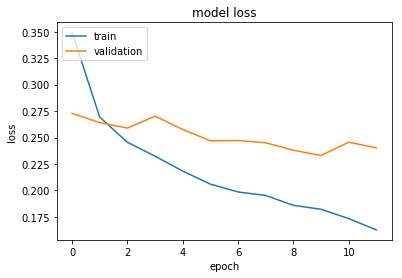

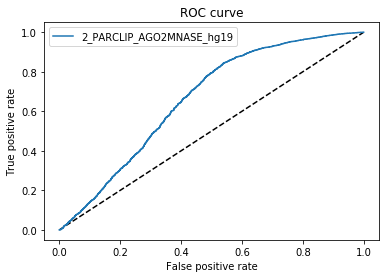

0.6626809687499999
3_HITSCLIP_Ago2_binding_clusters


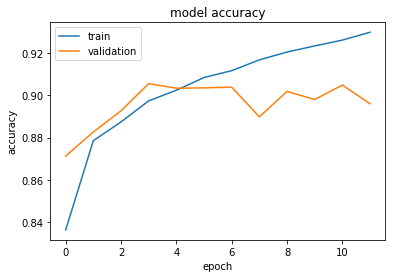

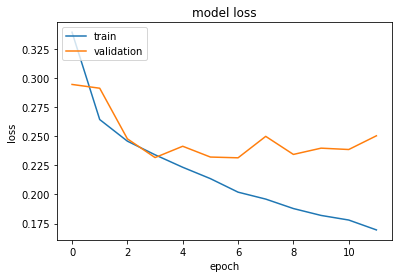

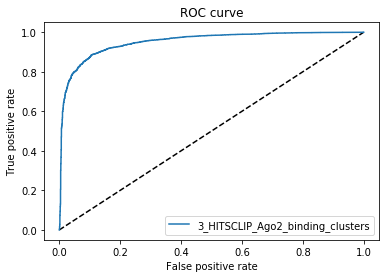

0.9512927500000001
4_HITSCLIP_Ago2_binding_clusters_2


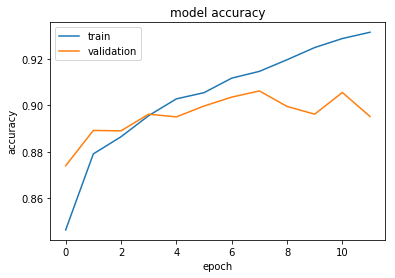

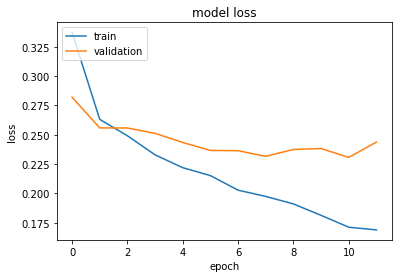

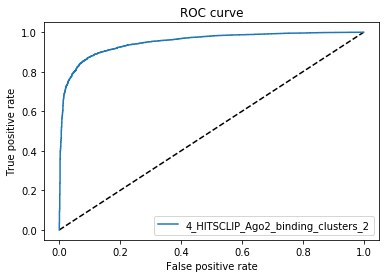

0.950168875
5_CLIPSEQ_AGO2_hg19


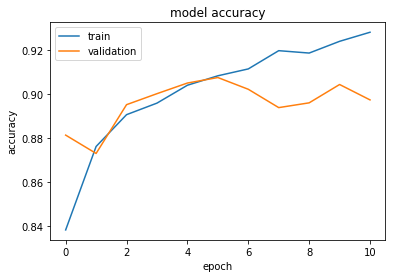

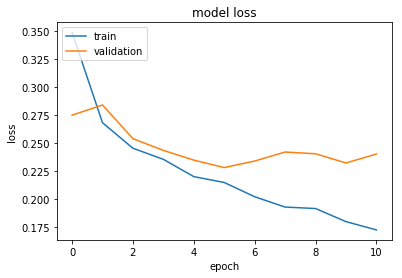

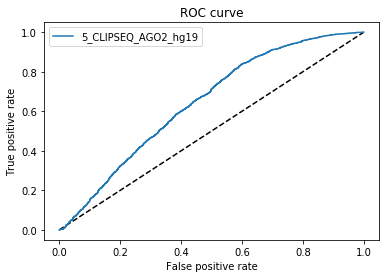

0.643234
6_CLIP-seq-eIF4AIII_1


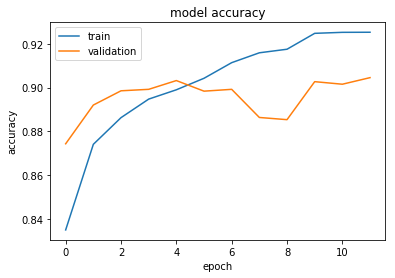

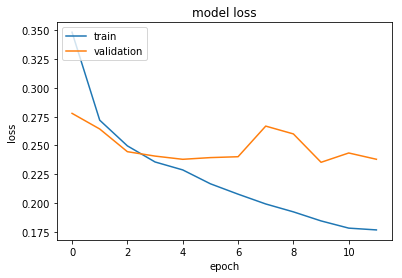

ValueError: Error when checking input: expected conv1d_189_input to have shape (101, 36) but got array with shape (101, 39)

1_PARCLIP_AGO1234_hg19


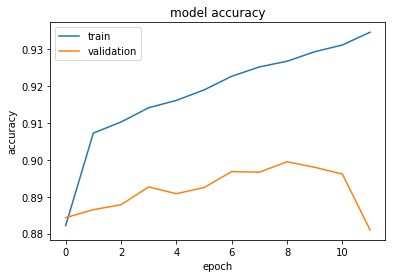

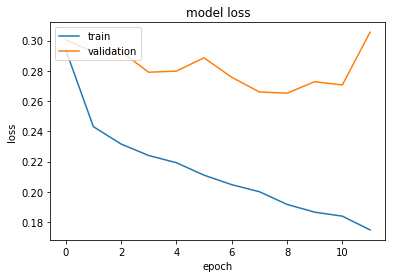

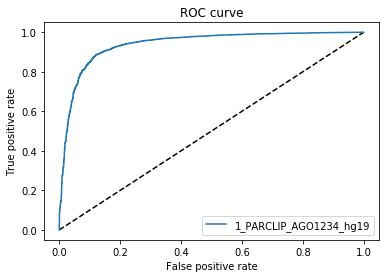

0.93885340625
2_PARCLIP_AGO2MNASE_hg19


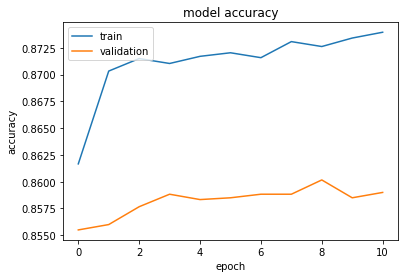

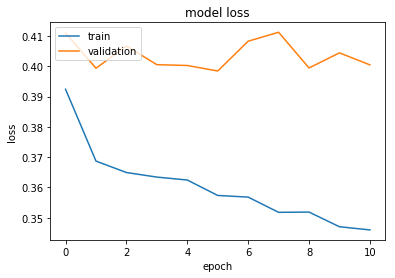

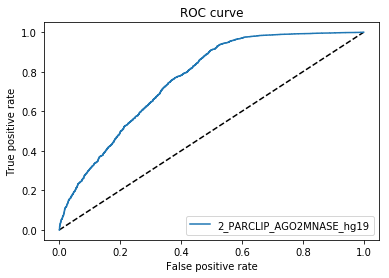

0.7629784687500001
3_HITSCLIP_Ago2_binding_clusters


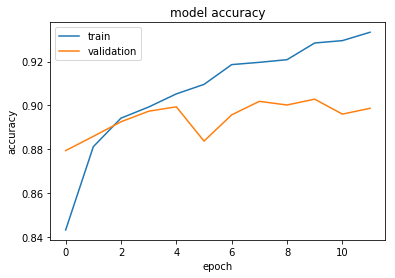

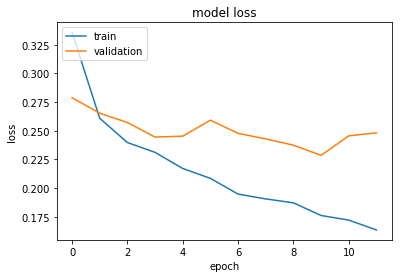

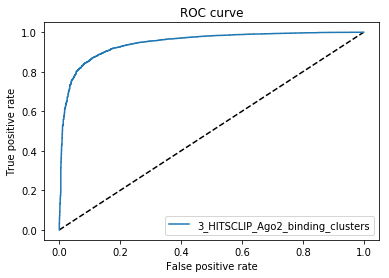

0.9462348125
4_HITSCLIP_Ago2_binding_clusters_2


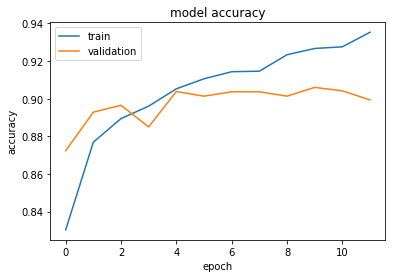

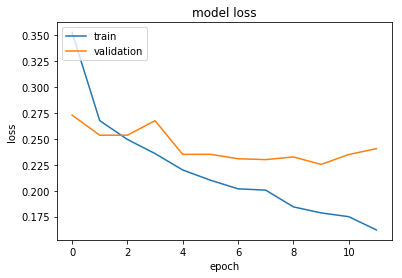

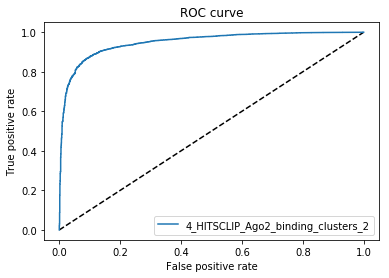

0.9492990937500001
5_CLIPSEQ_AGO2_hg19


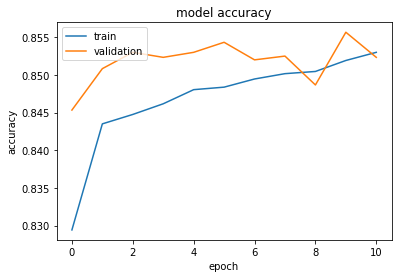

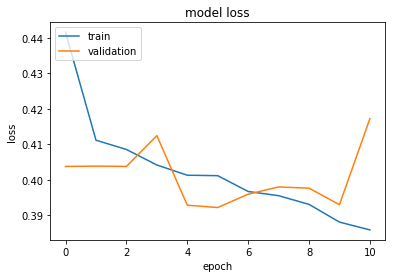

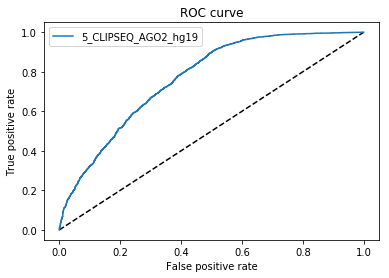

0.7663730000000001
6_CLIP-seq-eIF4AIII_1


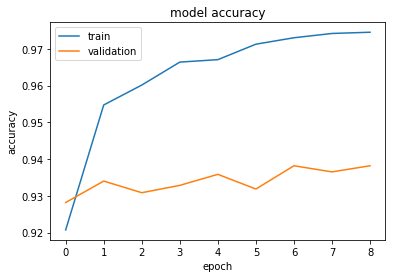

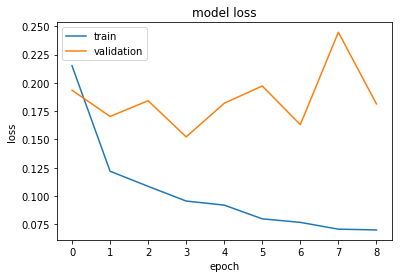

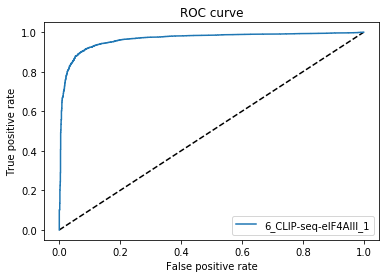

0.9645041875
7_CLIP-seq-eIF4AIII_2


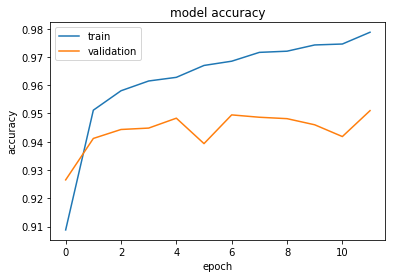

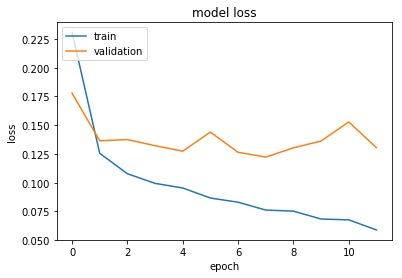

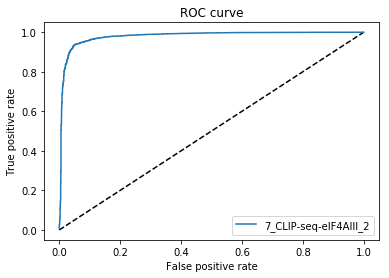

0.97951721875
8_PARCLIP_ELAVL1_hg19


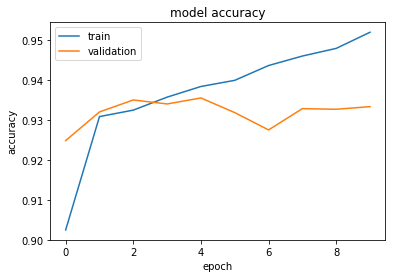

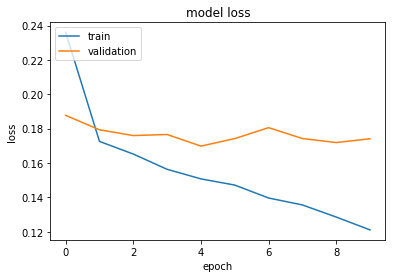

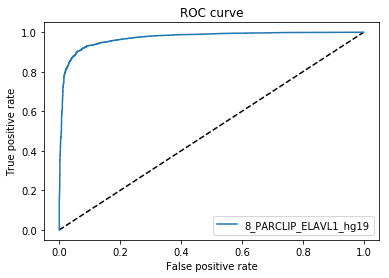

0.971428875
9_PARCLIP_ELAVL1MNASE_hg19


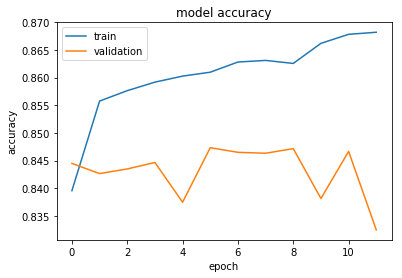

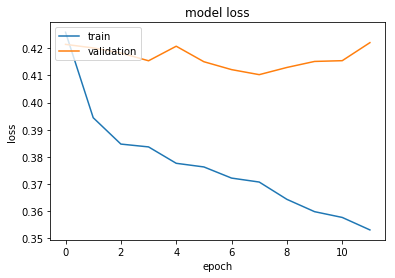

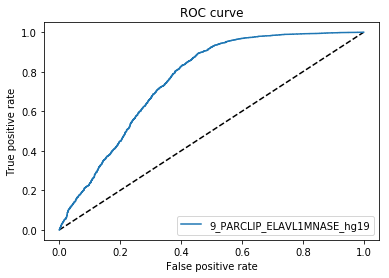

0.75839696875
10_PARCLIP_ELAVL1A_hg19


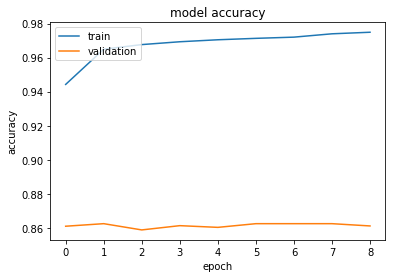

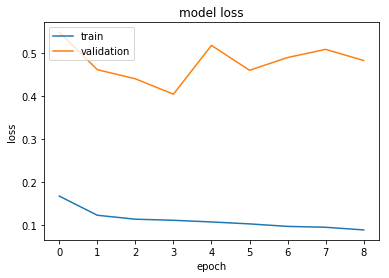

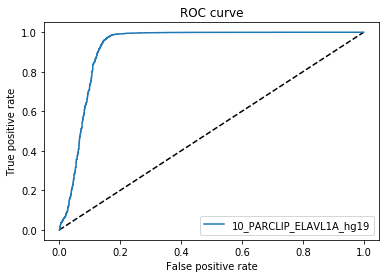

0.9240820625
10_PARCLIP_ELAVL1A_hg19


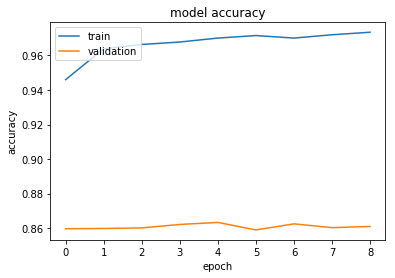

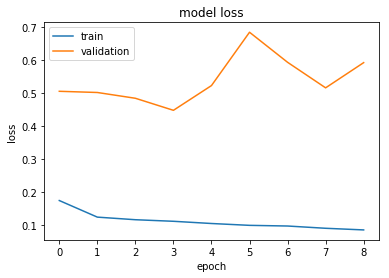

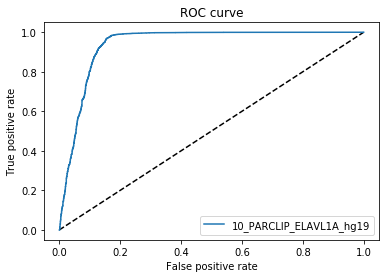

0.9373683125000001
12_PARCLIP_EWSR1_hg19


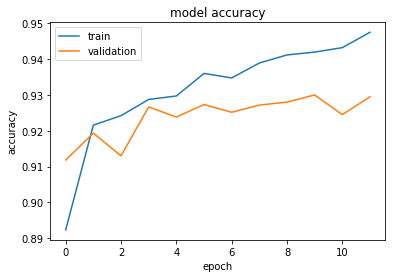

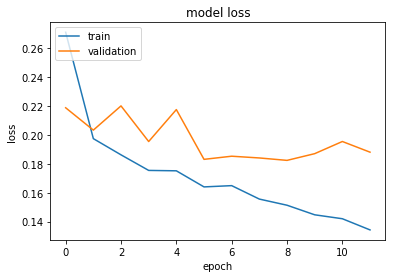

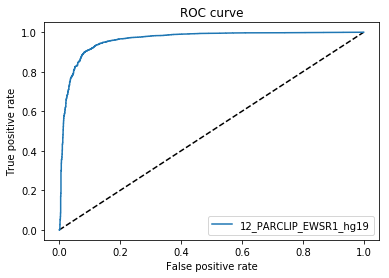

0.9619496562500001
13_PARCLIP_FUS_hg19


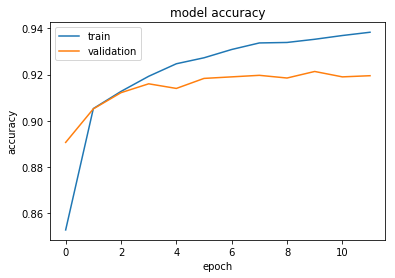

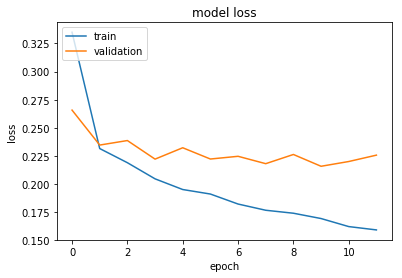

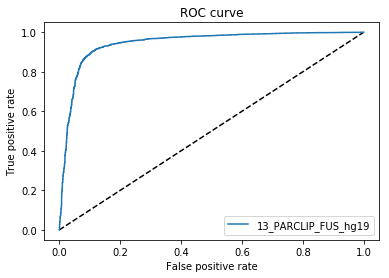

0.94369259375
14_PARCLIP_FUS_mut_hg19


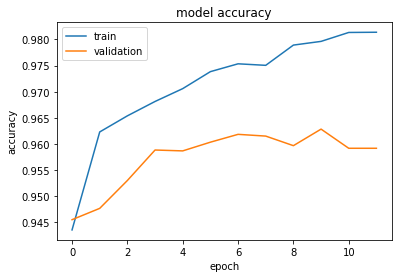

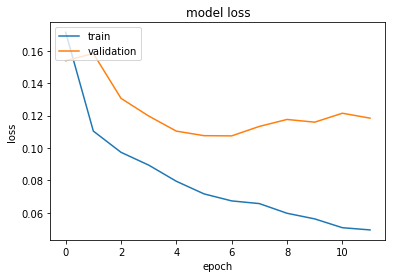

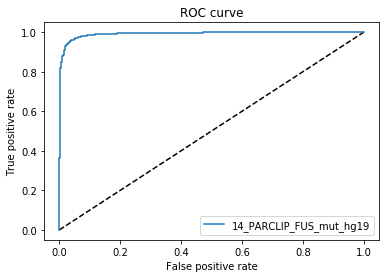

0.9922825625
15_PARCLIP_IGF2BP123_hg19


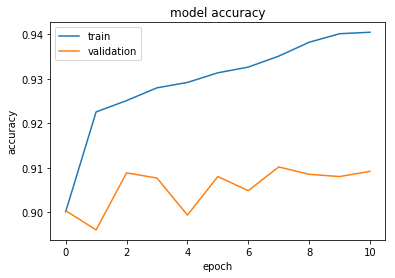

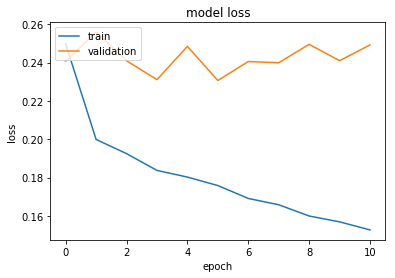

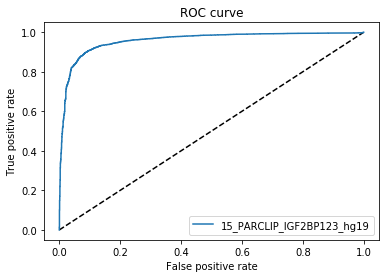

0.9578994999999999
16_ICLIP_hnRNPC_Hela_iCLIP_all_clusters


In [ ]:
#30k datasets

import numpy as np
from Bio import SeqIO
import gzip
import os
from keras.models import Sequential
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.layers import Dense, Activation, Conv1D, MaxPooling1D, Flatten, GlobalAveragePooling1D, Dropout
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score, roc_curve
import pandas as pd
import matplotlib.pyplot as plt


np.random.seed(454)


def load_data(path):
        
    data = gzip.open(os.path.join(path,"sequences.fa.gz"),"rt")
    return data


def get_seq(protein, t_data, training_set_number):
    
    
    if t_data == "train":
                
        training_data = load_data("datasets/clip/%s/30000/training_sample_%s"% (protein, training_set_number))
        x_train = np.zeros((30000,101,4))          
    
    elif t_data == "test":    
                
        training_data = load_data("datasets/clip/%s/30000/test_sample_%s"% (protein, training_set_number))
        x_train = np.zeros((10000,101,4))      
    
    
    
    r = 0    
    
   
    
    for record in SeqIO.parse(training_data,"fasta"):
        sequence = list(record.seq)                
        nucleotide = {'A' : 0, 'T' : 1, 'G' : 2, 'C' : 3, 'N' : 4} 
        num_seq = list() #sekvenca v številskem formatu


        for i in range(0,len(sequence)):
                num_seq.append(nucleotide[sequence[i]])


        X = np.zeros((1,len(num_seq),4))

        
        for i in range (len(num_seq)):
                if num_seq[i] <= 3:
                    X[:,i,num_seq[i]] = 1               

        x_train[r,:,:] = X
        r = r + 1
    
    return x_train


def get_class(protein, t_data,training_set_number):
    y_train = []
    

    if t_data == 'train':
        data = load_data("datasets/clip/%s/30000/training_sample_%s"% (protein, training_set_number))

    elif t_data == 'test':
        data = load_data("datasets/clip/%s/30000/test_sample_%s"% (protein, training_set_number))


    for record in SeqIO.parse(data,"fasta"):
        v = int((record.description).split(":")[1])
        y_train.append([int(v == 0), int(v != 0)])

    y_train = np.array(y_train)
    return y_train


def get_cobinding(protein, t_data, training_set_number):
    if t_data == "train":
        with gzip.open(("datasets/clip/%s/30000/training_sample_%s/matrix_Cobinding.tab.gz"% (protein, training_set_number)), "rt") as f:
            cobinding_data = np.loadtxt(f, skiprows=1) 
            
        cobinding = np.zeros((30000,101,cobinding_data.shape[1]/101),dtype=np.int)    
    elif t_data == "test":
        with gzip.open(("datasets/clip/%s/30000/test_sample_%s/matrix_Cobinding.tab.gz"% (protein, training_set_number)), "rt") as f:
            cobinding_data = np.loadtxt(f, skiprows=1) 
        cobinding = np.zeros((10000,101,cobinding_data.shape[1]/101),dtype=np.int)
   
    
    for n in range(0,cobinding_data.shape[1],101):
        a = cobinding_data[:,n:(n+101)]
        cobinding[:,:,(n/101)] = a
    
    return cobinding
    

def get_region (protein, t_data, training_set_number):
    
    if t_data == "train":
        with gzip.open(("datasets/clip/%s/30000/training_sample_%s/matrix_RegionType.tab.gz"% (protein, training_set_number)), "rt") as f:
            region_data = np.loadtxt(f, skiprows=1)
        region = np.zeros((30000,101,region_data.shape[1]/101),dtype=np.int)
                             
    elif t_data == "test":
        with gzip.open(("datasets/clip/%s/30000/test_sample_%s/matrix_RegionType.tab.gz"% (protein, training_set_number)), "rt") as f:
            region_data = np.loadtxt(f, skiprows=1) 
        region = np.zeros((10000,101,region_data.shape[1]/101),dtype=np.int)
    

    for n in range(0,region_data.shape[1],101):
        a = region_data[:,n:(n+101)]
        region[:,:,(n/101)] = a
        
    return region


def get_fold (protein, t_data, training_set_number):
    
    if t_data == "train":
        with gzip.open(("datasets/clip/%s/30000/training_sample_%s/matrix_RNAfold.tab.gz"% (protein, training_set_number)), "rt") as f:
            fold_data = np.loadtxt(f, skiprows=1) 
        fold = np.zeros((30000,101,fold_data.shape[1]/101),dtype=np.int)
                             
    elif t_data == "test":
        with gzip.open(("datasets/clip/%s/30000/test_sample_%s/matrix_RNAfold.tab.gz"% (protein, training_set_number)), "rt") as f:
            fold_data = np.loadtxt(f, skiprows=1) 
        fold = np.zeros((10000,101,fold_data.shape[1]/101),dtype=np.int)




    for n in range(0,fold_data.shape[1],101):
        a = fold_data[:,n:(n+101)]
        fold[:,:,(n/101)] = a
    
    
    return fold



protein_list = ["1_PARCLIP_AGO1234_hg19", "2_PARCLIP_AGO2MNASE_hg19","3_HITSCLIP_Ago2_binding_clusters","4_HITSCLIP_Ago2_binding_clusters_2","5_CLIPSEQ_AGO2_hg19", "6_CLIP-seq-eIF4AIII_1","7_CLIP-seq-eIF4AIII_2","8_PARCLIP_ELAVL1_hg19","9_PARCLIP_ELAVL1MNASE_hg19", "10_PARCLIP_ELAVL1A_hg19", "10_PARCLIP_ELAVL1A_hg19", "12_PARCLIP_EWSR1_hg19", "13_PARCLIP_FUS_hg19", "14_PARCLIP_FUS_mut_hg19", "15_PARCLIP_IGF2BP123_hg19", "16_ICLIP_hnRNPC_Hela_iCLIP_all_clusters", "17_ICLIP_HNRNPC_hg19", "18_ICLIP_hnRNPL_Hela_group_3975_all-hnRNPL-Hela-hg19_sum_G_hg19--ensembl59_from_2337-2339-741_bedGraph-cDNA-hits-in-genome", "19_ICLIP_hnRNPL_U266_group_3986_all-hnRNPL-U266-hg19_sum_G_hg19--ensembl59_from_2485_bedGraph-cDNA-hits-in-genome", "20_ICLIP_hnRNPlike_U266_group_4000_all-hnRNPLlike-U266-hg19_sum_G_hg19--ensembl59_from_2342-2486_bedGraph-cDNA-hits-in-genome", "21_PARCLIP_MOV10_Sievers_hg19", "22_ICLIP_NSUN2_293_group_4007_all-NSUN2-293-hg19_sum_G_hg19--ensembl59_from_3137-3202_bedGraph-cDNA-hits-in-genome", "23_PARCLIP_PUM2_hg19", "24_PARCLIP_QKI_hg19", "25_CLIPSEQ_SFRS1_hg19","26_PARCLIP_TAF15_hg19", "27_ICLIP_TDP43_hg19", "28_ICLIP_TIA1_hg19", "29_ICLIP_TIAL1_hg19", "30_ICLIP_U2AF65_Hela_iCLIP_ctrl_all_clusters", "31_ICLIP_U2AF65_Hela_iCLIP_ctrl+kd_all_clusters"]
average_score = np.zeros(len(protein_list))


for training_set_number in range (3):
    
    score_list = []
    
    for protein in protein_list:

       

        print (protein)

        X = np.dstack((get_cobinding(protein,"train",training_set_number), get_seq(protein,"train",training_set_number), get_region(protein,"train",training_set_number), get_fold(protein, "train",training_set_number)))
        y = get_class(protein,"train",training_set_number)

        size = X.shape[2]



        score = []

        model = Sequential()
        model.add(Conv1D(60,6, data_format='channels_last', input_shape=(101, size) , strides = 1, padding='valid'))
        model.add(MaxPooling1D(pool_size=20, strides=1, padding='valid'))
        model.add(Conv1D(60, 4, activation='relu'))
        model.add(Dropout(0.2))
        model.add(MaxPooling1D(pool_size=40, strides=1, padding='valid'))
        model.add(Conv1D(60, 4, activation='relu'))
        model.add(MaxPooling1D(pool_size=30, strides=1, padding='valid'))
        model.add(Conv1D(60, 3, activation='relu'))
        model.add(GlobalAveragePooling1D())


        model.add(Dense(200, activation='relu'))
        model.add(Dropout(0.1))
        model.add(Dense(2, activation='sigmoid'))

        model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

        checkpointer = ModelCheckpoint(filepath="models/" + protein + "_weights.hdf5", verbose=0, save_best_only=True)
        earlystopper = EarlyStopping(monitor='val_loss', patience=5, verbose=0)


        X_train = X
        y_train = y

        metrics = model.fit(X_train, y_train, validation_split = 0.2, epochs=12, batch_size=200, verbose=0, callbacks=[earlystopper])


        # plot history for accuracy
        plt.plot(metrics.history['acc'])
        plt.plot(metrics.history['val_acc'])
        plt.title('model accuracy')
        plt.ylabel('accuracy')
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        plt.show()


        # plot loss function history
        plt.plot(metrics.history['loss'])
        plt.plot(metrics.history['val_loss'])
        plt.title('model loss')
        plt.ylabel('loss')
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        plt.show()

        #run predictions
        X_test = np.dstack((get_cobinding(protein,"test",training_set_number), get_seq(protein,"test",training_set_number), get_region(protein,"test",training_set_number), get_fold(protein, "test",training_set_number)))
        y_test = get_class(protein,"test",training_set_number)


        y_scores = model.predict(X_test)
        y_scores = y_scores [:,0:1]
        y_test = y_test [:,0:1]

        score = roc_auc_score(y_test, y_scores)

        fpr, tpr, thresholds = roc_curve(y_test, y_scores)

        #ROC plot
        plt.figure(1)
        plt.plot([0, 1], [0, 1], 'k--')
        plt.plot(fpr, tpr, label=protein.format(score))
        plt.xlabel('False positive rate')
        plt.ylabel('True positive rate')
        plt.title('ROC curve')
        plt.legend(loc='best')
        plt.show()

        print (score)
        score_list.append(score)

    average_score = np.add(score_list, average_score)
    
print(average_score)

array([0.93932289, 1.        ])